# James Liem
**"On my honor, as a student, I have neither given nor received unauthorized aid on this academic work."**
# Final Project: The Big Fast Food Chain War: McDonald's vs. Burger King vs. Chick-fil-A

**In this project, I will do social media analytics on three fast food chain companies. They are McDonald's, Burger King, and Chick-fil-A. I collected two datasets for each fast food chain using Twitter API. One dataset contains the tweets mentioning the fast food company and the other dataset contains the company's tweets from their Twitter account. The tweets mentioning the fast food company may contain complaints, reviews, etc about the company. And, the tweets from each company's Twitter account may contain promotional contents, complaints handling, and others.**

**In addition, I will do descriptive, content, sentiment, network analytics and topic modeling (unsupervised machine learning) in this project.**

# Business questions 

* **What are the promotions offered through each company’s Twitter account?**
* **What is each company mostly talking about from their tweets?**
* **What are people saying about each company in Twitter? How is the review on Twitter?**
* **How is the comparison between the promotions offered by each company?**
* **What are the tweets saying?**
* **Which fast food chain has the most positive reviews?**
* **Which fast food chain has the most negative reviews?**
* **Who are the top people mentioning the company?**
* **How is the network from each company?**
* **What are the popular topics on the reviews of each company?**


## Import packages

In [648]:
import csv
import pandas as pd
import re
import json

from collections import Counter

import nltk
from nltk import word_tokenize, FreqDist
from nltk.corpus import stopwords
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.stem.porter import PorterStemmer

from os import path
from wordcloud import WordCloud, STOPWORDS

import numpy
import matplotlib.pyplot as plt
%matplotlib inline

from nltk.sentiment.vader import SentimentIntensityAnalyzer
vs = SentimentIntensityAnalyzer()

from operator import itemgetter

from IPython.display import Image

import pyLDAvis.gensim
import gensim
from gensim.corpora import Dictionary
from gensim.models import ldamodel
from gensim import corpora, models, similarities

from gensim.models.coherencemodel import CoherenceModel
from gensim.models.wrappers import LdaVowpalWabbit, LdaMallet

from pylab import*

import warnings

warnings.filterwarnings("ignore")
pd.set_option('display.max_colwidth', -1)
stopwords = stopwords.words('english')

## Import the data

**Load tweets from Burger King Twitter account**

In [649]:
# load data of tweets from burger king twitter account
df_bk = pd.read_csv("data/burgerking_tweets.csv", names = ["screen_name", "id", "created_at", "tweet"])
df_bk.head(3)

,screen_name,id,created_at,tweet
0,BurgerKing,1121837596173271042,2019-04-26 18:05:00,"@charmaineoon_ thanks for bringing this to our attention, Char. do you mind reaching out over DM with more info on… https://t.co/64DiDpQYsh"
1,BurgerKing,1121819400598884352,2019-04-26 16:52:42,@Cynderply365 same girl same
2,BurgerKing,1121818616033361921,2019-04-26 16:49:35,@itsjennabtw awwww


In [650]:
len(df_bk)

3228

**Load tweets from McDonald's Twitter account**

In [651]:
# load data of tweets from mcdonald's twitter account
df_mcd = pd.read_csv("data/mcdonalds_tweets.csv", names = ["screen_name", "id", "created_at", "tweet"])
df_mcd.head(3)

,screen_name,id,created_at,tweet
0,McDonalds,1121831928175394816,2019-04-26 17:42:28,"@edilleybar Sounds like you’re livin’ the dream, Erin! 😊"
1,McDonalds,1121830519090683904,2019-04-26 17:36:53,@iamdeara_ We're drooling just thinking about it!
2,McDonalds,1121829066141777921,2019-04-26 17:31:06,"@liadgarcia We're craving to see you, Lia!"


In [652]:
len(df_mcd)

3224

**Load tweets from Chick-fil-A Twitter account**

In [653]:
# load data of tweets from chick fil a twitter account
df_chick = pd.read_csv("data/chickfila_tweets.csv", names = ["screen_name", "id", "created_at", "tweet"])
df_chick.head(3)

,screen_name,id,created_at,tweet
0,ChickfilA,1121838467342831617,2019-04-26 18:08:28,@BritneyRush10 🚗💨🚙💨🚗💨
1,ChickfilA,1121838239927689220,2019-04-26 18:07:33,@kelseyslager We're sorry that your meal wasn't correct. Please give us a call at 1-866-232-2040 or fill out our on… https://t.co/dZSHPFKR2p
2,ChickfilA,1121836344420868096,2019-04-26 18:00:01,@pokinghontas__ We apologize for your experience. Please give us a call at 1-866-232-2040 or fill out our online fo… https://t.co/NNhnhHKJV4


In [654]:
len(df_chick)

3236

**Load the tweets mentioning McDonald's**

In [655]:
# load data of tweets mentioning mcdonalds

# create an empty list to store our tweets in
data_mcd = []

# append each line of the data to our tweets list using the json module
for line in open('mention_mcdonalds.json'):
    try:
        data_mcd.append(json.loads(line))
    except:
        pass

# lets see how many we got
print(len(data_mcd))

2056


**Load the tweets mentioning Burger King**

In [656]:
# load data of tweets mentioning burger king

# create an empty list to store our tweets in
data_bk = []

# append each line of the data to our tweets list using the json module
for line in open('mention_burgerking.json'):
    try:
        data_bk.append(json.loads(line))
    except:
        pass

# lets see how many we got
print(len(data_bk))

2061


**Load the tweets mentioning Chick-fil-A**

In [657]:
# load data of tweets mentioning chick fil a

# create an empty list to store our tweets in
data_chick = []

# append each line of the data to our tweets list using the json module
for line in open('mention_chickfila.json'):
    try:
        data_chick.append(json.loads(line))
    except:
        pass

# lets see how many we got
print(len(data_chick))

2038


## Convert to dataframe

**Tweets Mentioning McDonald's**

In [658]:
# saving the entire tweets in a variable and print it

texts = [ T['text'] for T in data_mcd if 'text' in T ]

# convert to list

tweets = []
for T in data_mcd:
    if 'text' in T:
        tweets.append(T)

# convert to dataframe

times = [T['created_at'] for T in tweets]
tweet = [T['text'] for T in tweets]
screen_names = [T['user']['screen_name'] for T in tweets]
followers_count = [T['user']['followers_count'] for T in tweets]
friends_count = [T['user']['friends_count'] for T in tweets]
names = [T['user']['name'] for T in tweets]

# open an output csv file to write to
out = open('mentiondata_mcdonalds.csv', 'w', encoding='UTF-8', newline='')

# write the header of our CSV as its first line
out.write('created_at,tweet,screen_name,followers_count,friends_count,name\n')

# merge each individual list into a single list using the zip function
rows = list(zip(times, tweet, screen_names, followers_count, friends_count, names))

# use the writer module on our csv file
from csv import writer
csv = writer(out)

# use one value from each of our rows list and write it to the csv as a new row
for row in rows:
    values = [value for value in row]
    #values = [(value.encode('utf8') if hasattr(value, 'encode') else value) for value in row]
    csv.writerow(values)

# close our csv file when done
out.close()

#http://mike.teczno.com/notes/streaming-data-from-twitter.html

In [659]:
# read your data as dataframe

df_mention_mcd = pd.read_csv("mentiondata_mcdonalds.csv")
df_mention_mcd.head(2)

,created_at,tweet,screen_name,followers_count,friends_count,name
0,Thu Apr 25 18:37:38 +0000 2019,Later as I drink McDonalds,TRANS_G_Bot,4,0,TransitionGenerator
1,Thu Apr 25 18:37:40 +0000 2019,What a LIFE For Our Elderly. \nMcDonald's gets help from AARP to hire more older workers https://t.co/vaw4Z5nmJZ,LostDiva,8576,7184,#BlackWomenForBernie2020


**Tweets Mentioning Burger King**

In [660]:
# saving the entire tweets in a variable and print it

texts = [ T['text'] for T in data_bk if 'text' in T ]

# convert to list

tweets = []
for T in data_bk:
    if 'text' in T:
        tweets.append(T)

# convert to dataframe

times = [T['created_at'] for T in tweets]
tweet = [T['text'] for T in tweets]
screen_names = [T['user']['screen_name'] for T in tweets]
followers_count = [T['user']['followers_count'] for T in tweets]
friends_count = [T['user']['friends_count'] for T in tweets]
names = [T['user']['name'] for T in tweets]

# open an output csv file to write to
out = open('mentiondata_burgerking.csv', 'w', encoding='UTF-8', newline='')

# write the header of our CSV as its first line
out.write('created_at,tweet,screen_name,followers_count,friends_count,name\n')

# merge each individual list into a single list using the zip function
rows = list(zip(times, tweet, screen_names, followers_count, friends_count, names))

# use the writer module on our csv file
from csv import writer
csv = writer(out)

# use one value from each of our rows list and write it to the csv as a new row
for row in rows:
    values = [value for value in row]
    #values = [(value.encode('utf8') if hasattr(value, 'encode') else value) for value in row]
    csv.writerow(values)

# close our csv file when done
out.close()

#http://mike.teczno.com/notes/streaming-data-from-twitter.html

In [661]:
# read your data as dataframe

df_mention_bk = pd.read_csv("mentiondata_burgerking.csv")
df_mention_bk.head(3)

,created_at,tweet,screen_name,followers_count,friends_count,name
0,Fri Apr 26 23:06:12 +0000 2019,Big Package – Funny Burger King Commercial . . . https://t.co/8aKKs1lK3b https://t.co/UJhScTlbsF,FunnyVideoXP,46451,34764,Funny Video Express
1,Fri Apr 26 23:06:15 +0000 2019,tava pensando em preparar uma jantinha pra bonita e ela me fala que\ncomeu \num \nBurger King https://t.co/7QjuXwWMtc,mikakamco,687,582,kami
2,Fri Apr 26 23:06:15 +0000 2019,"RT @mappenapp: In what is apparently not an April Fool’s joke, Impossible Foods and Burger King are launching an Impossible Whopper https:/…",DanielNewman,1009815,768992,Daniel Newmaη


**Tweets Mentioning Chick-fil-A**

In [662]:
# saving the entire tweets in a variable and print it

texts = [ T['text'] for T in data_chick if 'text' in T ]

# convert to list

tweets = []
for T in data_chick:
    if 'text' in T:
        tweets.append(T)

# convert to dataframe

times = [T['created_at'] for T in tweets]
tweet = [T['text'] for T in tweets]
screen_names = [T['user']['screen_name'] for T in tweets]
followers_count = [T['user']['followers_count'] for T in tweets]
friends_count = [T['user']['friends_count'] for T in tweets]
names = [T['user']['name'] for T in tweets]

# open an output csv file to write to
out = open('mentiondata_chickfila.csv', 'w', encoding='UTF-8', newline='')

# write the header of our CSV as its first line
out.write('created_at,tweet,screen_name,followers_count,friends_count,name\n')

# merge each individual list into a single list using the zip function
rows = list(zip(times, tweet, screen_names, followers_count, friends_count, names))

# use the writer module on our csv file
csv = writer(out)

# use one value from each of our rows list and write it to the csv as a new row
for row in rows:
    values = [value for value in row]
    #values = [(value.encode('utf8') if hasattr(value, 'encode') else value) for value in row]
    csv.writerow(values)

# close our csv file when done
out.close()

#http://mike.teczno.com/notes/streaming-data-from-twitter.html

In [663]:
# read your data as dataframe

df_mention_chick = pd.read_csv("mentiondata_chickfila.csv")
df_mention_chick.head(3)

,created_at,tweet,screen_name,followers_count,friends_count,name
0,Fri Apr 26 19:28:20 +0000 2019,"@ChickfilA You know I have to go back because I’m addicted, okay. Just 30min I’ll never get back 💔",brnvldmr,16,20,𝖁𝖎𝖑𝖑𝖆𝖎𝖓
1,Fri Apr 26 19:28:27 +0000 2019,.@kfc is here to remind the gays that Chick-Fil-A is homophobic and the Colonel is apparently a snack now? https://t.co/nNPOvKkkYy,realpatkane,426,545,Patrick Kane
2,Fri Apr 26 19:28:35 +0000 2019,RT @garretlondon: my bank account when I pull into chick fil a every morning https://t.co/9lpTbXaa8b,RobertoRosa05,269,756,🇵🇷Roberto 💋👑


# Every dataset for this project
**General info on all 6 datasets**

Datasets containing tweets that mention McDonald's, Burger King, Chick-fil-A respectively:
* df_mention_mcd
* df_mention_bk
* df_mention_chick

Datasets containing tweets from McDonald's, Burger King, Chick-fil-A Twitter account respectively:
* df_mcd
* df_bk
* df_chick

## McDonald's Datasets

In [664]:
df_mention_mcd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2056 entries, 0 to 2055
Data columns (total 6 columns):
created_at         2056 non-null object
tweet              2056 non-null object
screen_name        2056 non-null object
followers_count    2056 non-null int64
friends_count      2056 non-null int64
name               2056 non-null object
dtypes: int64(2), object(4)
memory usage: 96.5+ KB


In [665]:
df_mcd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3224 entries, 0 to 3223
Data columns (total 4 columns):
screen_name    3224 non-null object
id             3224 non-null int64
created_at     3224 non-null object
tweet          3224 non-null object
dtypes: int64(1), object(3)
memory usage: 100.8+ KB


## Burger King Datasets

In [666]:
df_mention_bk.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2061 entries, 0 to 2060
Data columns (total 6 columns):
created_at         2061 non-null object
tweet              2061 non-null object
screen_name        2061 non-null object
followers_count    2061 non-null int64
friends_count      2061 non-null int64
name               2061 non-null object
dtypes: int64(2), object(4)
memory usage: 96.7+ KB


In [667]:
df_bk.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3228 entries, 0 to 3227
Data columns (total 4 columns):
screen_name    3228 non-null object
id             3228 non-null int64
created_at     3228 non-null object
tweet          3228 non-null object
dtypes: int64(1), object(3)
memory usage: 101.0+ KB


## Chick-fil-A Datasets

In [668]:
df_mention_chick.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2038 entries, 0 to 2037
Data columns (total 6 columns):
created_at         2038 non-null object
tweet              2038 non-null object
screen_name        2038 non-null object
followers_count    2038 non-null int64
friends_count      2038 non-null int64
name               2038 non-null object
dtypes: int64(2), object(4)
memory usage: 95.6+ KB


In [669]:
df_chick.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3236 entries, 0 to 3235
Data columns (total 4 columns):
screen_name    3236 non-null object
id             3236 non-null int64
created_at     3236 non-null object
tweet          3236 non-null object
dtypes: int64(1), object(3)
memory usage: 101.2+ KB


**All of the 6 datasets (2 datasets for each company) contain no null values and ready to be cleaned and analyzed.**

# Data cleaning for each fast food company's tweet dataset 

In [670]:
# create function for sentiment analysis using vader sentiment

def sen_score(x):
    return vs.polarity_scores(x)['compound']

**Data cleaning for McDonald's tweets (df_mcd)**

In [671]:
# data cleaning for mcdonalds tweets
# lower all of the words
# create new columns (hashtags, hashtag count, mentions, mention count, whether the tweet is retweet or not)
# remove unwanted characters from the words
# apply the sentiment function created before


df_mcd['tweet'] = df_mcd.tweet.str.lower()
df_mcd['retweet'] = df_mcd.tweet.str.startswith("rt")
df_mcd['hashtags'] = df_mcd.tweet.str.findall(r"(?<=#)\w+")
df_mcd['mentions'] = df_mcd.tweet.str.findall("(?<=@)\w+")
df_mcd['hashtag_count'] = df_mcd.tweet.str.findall("(?<=#)\w+").str.len()
df_mcd['mention_count'] = df_mcd.tweet.str.findall("(?<=@)\w+").str.len()
df_mcd['cleaned'] = df_mcd['tweet']
df_mcd['hashtags'] = df_mcd['hashtags'].apply(', '.join)
df_mcd['mentions'] = df_mcd['mentions'].apply(', '.join)
df_mcd['cleaned'] = df_mcd.cleaned.str.replace('http\S+|www.\S+', '')
df_mcd['cleaned'] = df_mcd['cleaned'].str.replace("[^a-zA-Z]", " ")
df_mcd['cleaned'] = df_mcd.cleaned.str.findall('\w{3,}').str.join(' ')
df_mcd['cleaned'] = df_mcd.cleaned.apply(lambda x: ' '.join([word for word in x.split() if word not in (stopwords)]))
df_mcd['sentiment'] = df_mcd['tweet'].apply(sen_score)
df_mcd.head(3)

,screen_name,id,created_at,tweet,retweet,hashtags,mentions,hashtag_count,mention_count,cleaned,sentiment
0,McDonalds,1121831928175394816,2019-04-26 17:42:28,"@edilleybar sounds like you’re livin’ the dream, erin! 😊",False,,edilleybar,0,1,edilleybar sounds like livin dream erin,0.5848
1,McDonalds,1121830519090683904,2019-04-26 17:36:53,@iamdeara_ we're drooling just thinking about it!,False,,iamdeara_,0,1,iamdeara drooling thinking,0.0000
2,McDonalds,1121829066141777921,2019-04-26 17:31:06,"@liadgarcia we're craving to see you, lia!",False,,liadgarcia,0,1,liadgarcia craving see lia,0.0000


**Data cleaning for Burger King tweets (df_bk)**

In [672]:
# data cleaning for burger king tweets
# lower all of the words
# create new columns (hashtags, hashtag count, mentions, mention count, whether the tweet is retweet or not)
# remove unwanted characters from the words


df_bk['tweet'] = df_bk.tweet.str.lower()
df_bk['retweet'] = df_bk.tweet.str.startswith("rt")
df_bk['hashtags'] = df_bk.tweet.str.findall(r"(?<=#)\w+")
df_bk['mentions'] = df_bk.tweet.str.findall("(?<=@)\w+")
df_bk['hashtag_count'] = df_bk.tweet.str.findall("(?<=#)\w+").str.len()
df_bk['mention_count'] = df_bk.tweet.str.findall("(?<=@)\w+").str.len()
df_bk['cleaned'] = df_bk['tweet']
df_bk['hashtags'] = df_bk['hashtags'].apply(', '.join)
df_bk['mentions'] = df_bk['mentions'].apply(', '.join)
df_bk['cleaned'] = df_bk.cleaned.str.replace('http\S+|www.\S+', '')
df_bk['cleaned'] = df_bk['cleaned'].str.replace("[^a-zA-Z]", " ")
df_bk['cleaned'] = df_bk.cleaned.str.findall('\w{3,}').str.join(' ')
df_bk['cleaned'] = df_bk.cleaned.apply(lambda x: ' '.join([word for word in x.split() if word not in (stopwords)]))
df_bk['sentiment'] = df_bk['tweet'].apply(sen_score)
df_bk.head(3)

,screen_name,id,created_at,tweet,retweet,hashtags,mentions,hashtag_count,mention_count,cleaned,sentiment
0,BurgerKing,1121837596173271042,2019-04-26 18:05:00,"@charmaineoon_ thanks for bringing this to our attention, char. do you mind reaching out over dm with more info on… https://t.co/64didpqysh",False,,charmaineoon_,0,1,charmaineoon thanks bringing attention char mind reaching info,0.5719
1,BurgerKing,1121819400598884352,2019-04-26 16:52:42,@cynderply365 same girl same,False,,cynderply365,0,1,cynderply girl,0.0000
2,BurgerKing,1121818616033361921,2019-04-26 16:49:35,@itsjennabtw awwww,False,,itsjennabtw,0,1,itsjennabtw awwww,0.0000


**Data cleaning for Chick-fil-A tweets (df_chick)**

In [673]:
# data cleaning for chick fil a tweets
# lower all of the words
# create new columns (hashtags, hashtag count, mentions, mention count, whether the tweet is retweet or not)
# remove unwanted characters from the words


df_chick['tweet'] = df_chick.tweet.str.lower()
df_chick['retweet'] = df_chick.tweet.str.startswith("rt")
df_chick['hashtags'] = df_chick.tweet.str.findall(r"(?<=#)\w+")
df_chick['mentions'] = df_chick.tweet.str.findall("(?<=@)\w+")
df_chick['hashtag_count'] = df_chick.tweet.str.findall("(?<=#)\w+").str.len()
df_chick['mention_count'] = df_chick.tweet.str.findall("(?<=@)\w+").str.len()
df_chick['cleaned'] = df_chick['tweet']
df_chick['hashtags'] = df_chick['hashtags'].apply(', '.join)
df_chick['mentions'] = df_chick['mentions'].apply(', '.join)
df_chick['cleaned'] = df_chick.cleaned.str.replace('http\S+|www.\S+', '')
df_chick['cleaned'] = df_chick['cleaned'].str.replace("[^a-zA-Z]", " ")
df_chick['cleaned'] = df_chick.cleaned.str.findall('\w{3,}').str.join(' ')
df_chick['cleaned'] = df_chick.cleaned.apply(lambda x: ' '.join([word for word in x.split() if word not in (stopwords)]))
df_chick['sentiment'] = df_chick['tweet'].apply(sen_score)
df_chick.head(2)

,screen_name,id,created_at,tweet,retweet,hashtags,mentions,hashtag_count,mention_count,cleaned,sentiment
0,ChickfilA,1121838467342831617,2019-04-26 18:08:28,@britneyrush10 🚗💨🚙💨🚗💨,False,,britneyrush10,0,1,britneyrush,0.0000
1,ChickfilA,1121838239927689220,2019-04-26 18:07:33,@kelseyslager we're sorry that your meal wasn't correct. please give us a call at 1-866-232-2040 or fill out our on… https://t.co/dzshpfkr2p,False,,kelseyslager,0,1,kelseyslager sorry meal correct please give call fill,-0.3098


# Data cleaning for tweets mentioning each fast food company

**Data cleaning for tweets mentioning McDonald's (df_mention_mcd)**

In [674]:
# data cleaning for tweets mentioning mcdonalds 
# lower all of the words
# create new columns (hashtags, hashtag count, mentions, mention count, whether the tweet is retweet or not)
# remove unwanted characters from the words


df_mention_mcd['tweet'] = df_mention_mcd.tweet.str.lower()
df_mention_mcd['retweet'] = df_mention_mcd.tweet.str.startswith("rt")
df_mention_mcd['hashtags'] = df_mention_mcd.tweet.str.findall(r"(?<=#)\w+")
df_mention_mcd['mentions'] = df_mention_mcd.tweet.str.findall("(?<=@)\w+")
df_mention_mcd['hashtag_count'] = df_mention_mcd.tweet.str.findall("(?<=#)\w+").str.len()
df_mention_mcd['mention_count'] = df_mention_mcd.tweet.str.findall("(?<=@)\w+").str.len()
df_mention_mcd['cleaned'] = df_mention_mcd['tweet']
df_mention_mcd['hashtags'] = df_mention_mcd['hashtags'].apply(', '.join)
df_mention_mcd['mentions'] = df_mention_mcd['mentions'].apply(', '.join)
df_mention_mcd['cleaned'] = df_mention_mcd.cleaned.str.replace('http\S+|www.\S+', '')
df_mention_mcd['cleaned'] = df_mention_mcd['cleaned'].str.replace("[^a-zA-Z]", " ")
df_mention_mcd['cleaned'] = df_mention_mcd.cleaned.str.findall('\w{3,}').str.join(' ')
df_mention_mcd['cleaned'] = df_mention_mcd.cleaned.apply(lambda x: ' '.join([word for word in x.split() if word not in (stopwords)]))
df_mention_mcd['sentiment'] = df_mention_mcd['tweet'].apply(sen_score)
df_mention_mcd.head(2)

,created_at,tweet,screen_name,followers_count,friends_count,name,retweet,hashtags,mentions,hashtag_count,mention_count,cleaned,sentiment
0,Thu Apr 25 18:37:38 +0000 2019,later as i drink mcdonalds,TRANS_G_Bot,4,0,TransitionGenerator,False,,,0,0,later drink mcdonalds,0.0000
1,Thu Apr 25 18:37:40 +0000 2019,what a life for our elderly. \nmcdonald's gets help from aarp to hire more older workers https://t.co/vaw4z5nmjz,LostDiva,8576,7184,#BlackWomenForBernie2020,False,,,0,0,life elderly mcdonald gets help aarp hire older workers,0.4019


**Data cleaning for tweets mentioning Burger King (df_mention_bk)**

In [675]:
# data cleaning for tweets mentioning burger king 
# lower all of the words
# create new columns (hashtags, hashtag count, mentions, mention count, whether the tweet is retweet or not)
# remove unwanted characters from the words


df_mention_bk['tweet'] = df_mention_bk.tweet.str.lower()
df_mention_bk['retweet'] = df_mention_bk.tweet.str.startswith("rt")
df_mention_bk['hashtags'] = df_mention_bk.tweet.str.findall(r"(?<=#)\w+")
df_mention_bk['mentions'] = df_mention_bk.tweet.str.findall("(?<=@)\w+")
df_mention_bk['hashtag_count'] = df_mention_bk.tweet.str.findall("(?<=#)\w+").str.len()
df_mention_bk['mention_count'] = df_mention_bk.tweet.str.findall("(?<=@)\w+").str.len()
df_mention_bk['cleaned'] = df_mention_bk['tweet']
df_mention_bk['hashtags'] = df_mention_bk['hashtags'].apply(', '.join)
df_mention_bk['mentions'] = df_mention_bk['mentions'].apply(', '.join)
df_mention_bk['cleaned'] = df_mention_bk.cleaned.str.replace('http\S+|www.\S+', '')
df_mention_bk['cleaned'] = df_mention_bk['cleaned'].str.replace("[^a-zA-Z]", " ")
df_mention_bk['cleaned'] = df_mention_bk.cleaned.str.findall('\w{3,}').str.join(' ')
df_mention_bk['cleaned'] = df_mention_bk.cleaned.apply(lambda x: ' '.join([word for word in x.split() if word not in (stopwords)]))
df_mention_bk['sentiment'] = df_mention_bk['tweet'].apply(sen_score)
df_mention_bk.head(2)

,created_at,tweet,screen_name,followers_count,friends_count,name,retweet,hashtags,mentions,hashtag_count,mention_count,cleaned,sentiment
0,Fri Apr 26 23:06:12 +0000 2019,big package – funny burger king commercial . . . https://t.co/8akks1lk3b https://t.co/ujhsctlbsf,FunnyVideoXP,46451,34764,Funny Video Express,False,,,0,0,big package funny burger king commercial,0.4404
1,Fri Apr 26 23:06:15 +0000 2019,tava pensando em preparar uma jantinha pra bonita e ela me fala que\ncomeu \num \nburger king https://t.co/7qjuxwwmtc,mikakamco,687,582,kami,False,,,0,0,tava pensando preparar uma jantinha pra bonita ela fala que comeu burger king,0.0000


**Data cleaning for tweets mentioning Chick-fil-A (df_mention_chick)**

In [676]:
# data cleaning for tweets mentioning chick fil a 
# lower all of the words
# create new columns (hashtags, hashtag count, mentions, mention count, whether the tweet is retweet or not)
# remove unwanted characters from the words


df_mention_chick['tweet'] = df_mention_chick.tweet.str.lower()
df_mention_chick['retweet'] = df_mention_chick.tweet.str.startswith("rt")
df_mention_chick['hashtags'] = df_mention_chick.tweet.str.findall(r"(?<=#)\w+")
df_mention_chick['mentions'] = df_mention_chick.tweet.str.findall("(?<=@)\w+")
df_mention_chick['hashtag_count'] = df_mention_chick.tweet.str.findall("(?<=#)\w+").str.len()
df_mention_chick['mention_count'] = df_mention_chick.tweet.str.findall("(?<=@)\w+").str.len()
df_mention_chick['cleaned'] = df_mention_chick['tweet']
df_mention_chick['hashtags'] = df_mention_chick['hashtags'].apply(', '.join)
df_mention_chick['mentions'] = df_mention_chick['mentions'].apply(', '.join)
df_mention_chick['cleaned'] = df_mention_chick.cleaned.str.replace('http\S+|www.\S+', '')
df_mention_chick['cleaned'] = df_mention_chick['cleaned'].str.replace("[^a-zA-Z]", " ")
df_mention_chick['cleaned'] = df_mention_chick.cleaned.str.findall('\w{3,}').str.join(' ')
df_mention_chick['cleaned'] = df_mention_chick.cleaned.apply(lambda x: ' '.join([word for word in x.split() if word not in (stopwords)]))
df_mention_chick['sentiment'] = df_mention_chick['tweet'].apply(sen_score)
df_mention_chick.head(2)

,created_at,tweet,screen_name,followers_count,friends_count,name,retweet,hashtags,mentions,hashtag_count,mention_count,cleaned,sentiment
0,Fri Apr 26 19:28:20 +0000 2019,"@chickfila you know i have to go back because i’m addicted, okay. just 30min i’ll never get back 💔",brnvldmr,16,20,𝖁𝖎𝖑𝖑𝖆𝖎𝖓,False,,chickfila,0,1,chickfila know back addicted okay min never get back,0.2263
1,Fri Apr 26 19:28:27 +0000 2019,.@kfc is here to remind the gays that chick-fil-a is homophobic and the colonel is apparently a snack now? https://t.co/nnpovkkkyy,realpatkane,426,545,Patrick Kane,False,,kfc,0,1,kfc remind gays chick fil homophobic colonel apparently snack,0.0000


# McDonald's Twitter Analysis

**This section includes descriptive, content, sentiment, topic modeling, and network analysis for the company's tweets and the tweets mentioning the company.**

## Tweets Mentioning McDonald's Descriptive and Content Analytics

### Total Original Tweets and Retweets

Total Number of Original Tweets and Retweets(False is Original Tweets and True is Retweets)
False    1055
True     1001
Name: retweet, dtype: int64

Total Tweets:
2056



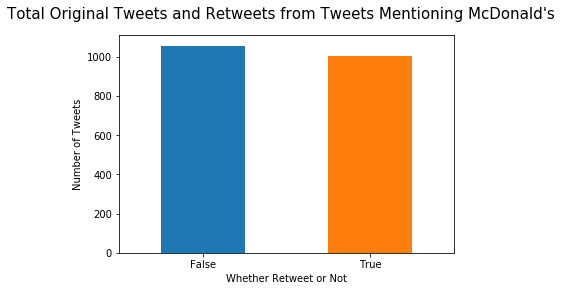

In [677]:
# find out how many tweets and retweets there are

print ('Total Number of Original Tweets and Retweets(False is Original Tweets and True is Retweets)')
print (df_mention_mcd['retweet'].value_counts())
print()

# find out total tweets

print ('Total Tweets:')
print (df_mention_mcd['tweet'].count())
print()

# plot the total tweets

ax = df_mention_mcd['retweet'].value_counts().plot(kind='bar')
plt.xticks(rotation=0)
plt.suptitle("Total Original Tweets and Retweets from Tweets Mentioning McDonald's", fontsize=15)
plt.xlabel("Whether Retweet or Not")
plt.ylabel("Number of Tweets")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Total Original Tweets and Retweets from Tweets Mentioning McDonald's", bbox_inches='tight')


**There are 1001 retweets and 1055 original tweets from tweets mentioning McDonald's, which has 2056 tweets in total. This means that there are 2056 people mentioning McDonald's from the data.**

### The Most Influential Person who Mentioned McDonald's

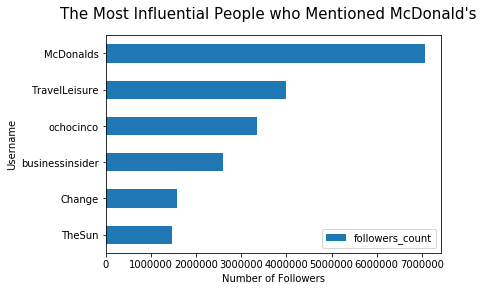

In [678]:
most_followers = df_mention_mcd.groupby('screen_name')['followers_count'].sum().sort_values(ascending=False).reset_index().head(6)
most_followers = most_followers.set_index('screen_name')
ax = most_followers
ax = ax.sort_values('followers_count', ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("The Most Influential People who Mentioned McDonald's", fontsize=15)
plt.ylabel("Username")
plt.xlabel("Number of Followers")
plt.show()
fig = ax.get_figure()
fig.savefig("images/The Most Influential People who Mentioned McDonald's", bbox_inches='tight')


In [679]:
# what did the most influential person tweet?

most_influential = df_mention_mcd.loc[df_mention_mcd['screen_name']=='TravelLeisure']
most_influential = most_influential[['screen_name', 'tweet', 'followers_count', 'sentiment']]
most_influential

,screen_name,tweet,followers_count,sentiment
591,TravelLeisure,these popular international mcdonald's items are coming to the u.s. https://t.co/oymks0ufnb https://t.co/l3lyiafrxh,3991630,0.4215


**It appears that the most influential username that mentioned McDonald's was a travelling company, which tweeted about international McDonald's items are coming to the US and the sentiment is pretty positive. TravelLeisure also has almost 4 million twitter followers. Fortunately, the most influential person tweeted a positive thing about McDonald's. Otherwise, it could damage McDonald's reputation.**

### Hashtags Metrics

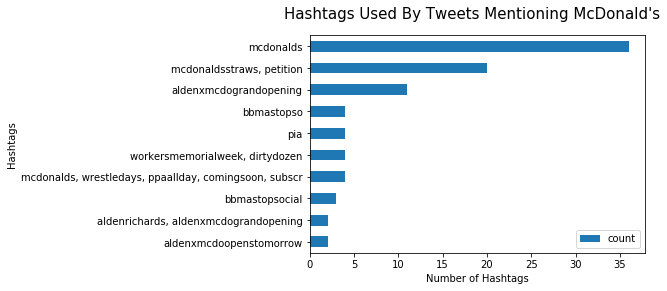

The Total Number of Hashtags:
count    180
dtype: int64



In [680]:
# find out the popular hashtags used

mcd_mention_hashtags = df_mention_mcd['hashtags'].value_counts().reset_index()
mcd_mention_hashtags = mcd_mention_hashtags.rename(columns={'index': 'hashtags', 'hashtags': 'count'})
mcd_mention_hashtags = mcd_mention_hashtags.drop(mcd_mention_hashtags.index[[0]])
mcd_mention_hashtags = mcd_mention_hashtags.set_index('hashtags')
ax = mcd_mention_hashtags.head(10).sort_values('count', ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("Hashtags Used By Tweets Mentioning McDonald's", fontsize=15)
plt.ylabel("Hashtags")
plt.xlabel("Number of Hashtags")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Hashtags Used By Tweets Mentioning McDonald's.png", bbox_inches='tight')

# find out how many hashtags mcdonalds used on their tweets

print('The Total Number of Hashtags:')
print(mcd_mention_hashtags.sum())
print()

### Mentions Metrics

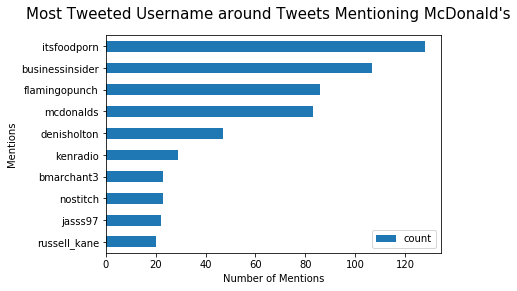

In [681]:
# find out who is the most mentioned 

mention_mcd_most = df_mention_mcd['mentions'].value_counts().reset_index()
mention_mcd_most = mention_mcd_most.rename(columns={'index': 'mentions', 'mentions': 'count'})
mention_mcd_most['mentions'].replace('', np.nan, inplace=True)
mention_mcd_most = mention_mcd_most.dropna()
mention_mcd_most = mention_mcd_most.set_index('mentions')
ax = mention_mcd_most.head(10).sort_values('count',ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("Most Tweeted Username around Tweets Mentioning McDonald's", fontsize=15)
plt.ylabel("Mentions")
plt.xlabel("Number of Mentions")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Most Tweeted Username around Tweets Mentioning McDonald's.png", bbox_inches='tight')


**The most mentioned user around tweets mentioning McDonald's is itsfoodporn.**

**Tweets to itsfoodporn.**

In [682]:
# select the tweets only for itsfoodporn

most_mention_itsfoodporn = df_mention_mcd.loc[df_mention_mcd['mentions']=='itsfoodporn']
most_mention_itsfoodporn = most_mention_itsfoodporn[['screen_name', 'tweet', 'mentions']]
print (most_mention_itsfoodporn.nunique())
print()
print(most_mention_itsfoodporn['tweet'].head(1))

screen_name    128
tweet          1  
mentions       1  
dtype: int64

15    rt @itsfoodporn: mcdonald's french fries. https://t.co/qmnattepny
Name: tweet, dtype: object


**It appears that people have been retweeting one same tweet by itsfoodporn. The tweet appears to be McDonald's French Fries picture.**

**Here is the picture everyone has been retweeting:**

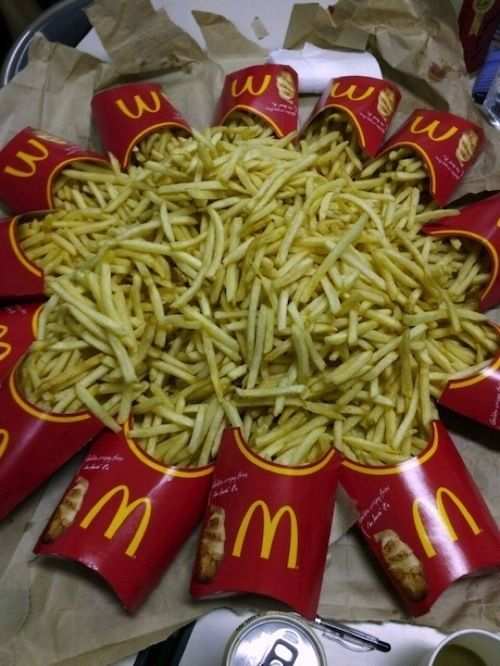

In [683]:
# load the image

Image("images/mcdonalds_french_fries.jpg")

### Popular Words from Tweets Mentioning McDonald's

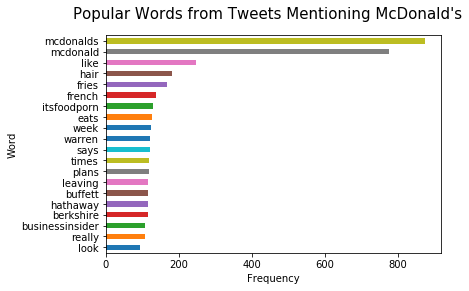

In [684]:
# find out the most popular words 

ax = df_mention_mcd.cleaned.str.split(expand=True).stack().value_counts().head(20)
ax = ax.sort_values(ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("Popular Words from Tweets Mentioning McDonald's", fontsize=15)
plt.ylabel("Word")
plt.xlabel("Frequency")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Popular Words from Tweets Mentioning McDonald's.png", bbox_inches='tight')


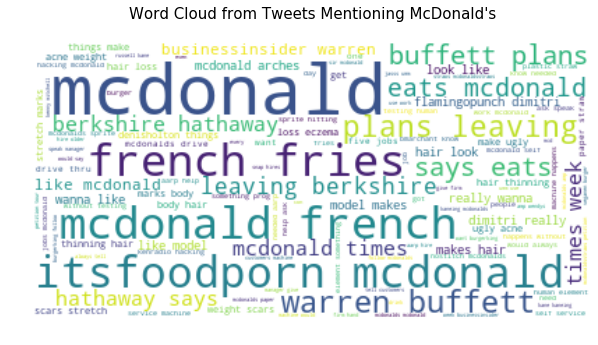

In [685]:
# word cloud 

wordcloud = WordCloud(background_color="white",
                      max_font_size=50, relative_scaling=.5, 
                      random_state=1, stopwords=stopwords).generate(' '.join(df_mention_mcd['cleaned']))
plt.figure(figsize=(10,10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud from Tweets Mentioning McDonald's\n", fontsize=15)
plt.savefig("images/Word Cloud from Tweets Mentioning McDonald's.png")

### Popular Bigrams

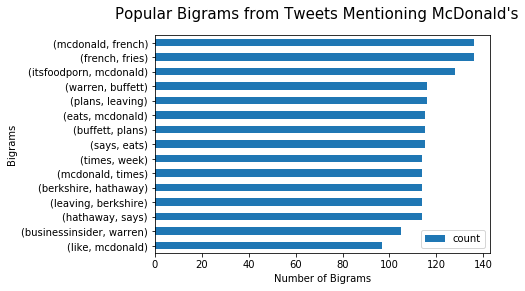

In [686]:
# popular bigrams

mcd_bgs = df_mention_mcd['cleaned'].values.tolist()
mcd_bgs = str(mcd_bgs)
mcd_bgs = re.sub("[^a-zA-Z0-9]", " ", str(mcd_bgs))
mcd_bgs = word_tokenize(mcd_bgs)
mcd_bgs = nltk.bigrams(mcd_bgs)
mcd_bgs = nltk.FreqDist(mcd_bgs)
df_mcd_bigram = pd.DataFrame.from_dict(mcd_bgs, orient='index').reset_index()
df_mcd_bigram = df_mcd_bigram.rename(columns={'index':'bigram', 0:'count'})
df_mcd_bigram = df_mcd_bigram.set_index('bigram')
ax = df_mcd_bigram.sort_values('count', ascending=False).head(15)
ax = ax.sort_values('count',ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("Popular Bigrams from Tweets Mentioning McDonald's", fontsize=15)
plt.ylabel("Bigrams")
plt.xlabel("Number of Bigrams")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Popular Bigrams from Tweets Mentioning McDonald's.png", bbox_inches='tight')


## McDonald's Tweets Descriptive and Content Analytics

### Total Original Tweets and Retweets

Total Number of Original Tweets and Retweets(True is Original Tweets and False is Retweets)
False    3224
Name: retweet, dtype: int64



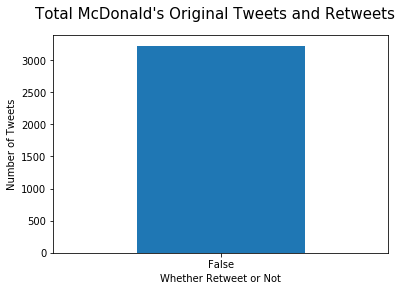

In [687]:
# find out how many tweets and retweets there are

print ('Total Number of Original Tweets and Retweets(True is Original Tweets and False is Retweets)')
print (df_mcd['retweet'].value_counts())
print()
# plot the total tweets

ax = df_mcd['retweet'].value_counts().plot(kind='bar')
plt.xticks(rotation=0)
plt.suptitle("Total McDonald's Original Tweets and Retweets", fontsize=15)
plt.xlabel("Whether Retweet or Not")
plt.ylabel("Number of Tweets")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Total McDonald's Original Tweets and Retweets.png", bbox_inches='tight')


**There are no retweets and only original tweets from McDonald's Twitter account, which has 3224 tweets in total**

### Hashtags Metrics

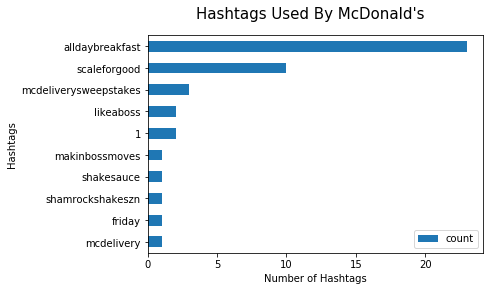

The Total Number of Hashtags:
count    45
dtype: int64



In [688]:
# find out the popular hashtags used

mcd_hashtags = df_mcd['hashtags'].value_counts().reset_index()
mcd_hashtags = mcd_hashtags.rename(columns={'index': 'hashtags', 'hashtags': 'count'})
mcd_hashtags = mcd_hashtags.drop(mcd_hashtags.index[[0]])
mcd_hashtags = mcd_hashtags.set_index('hashtags')
ax = mcd_hashtags
ax = ax.sort_values('count',ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("Hashtags Used By McDonald's", fontsize=15)
plt.ylabel("Hashtags")
plt.xlabel("Number of Hashtags")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Hashtags Used By McDonald's.png", bbox_inches='tight')

# find out how many hashtags mcdonalds used on their tweets

print('The Total Number of Hashtags:')
print(mcd_hashtags.sum())
print()

### Mentions Metrics

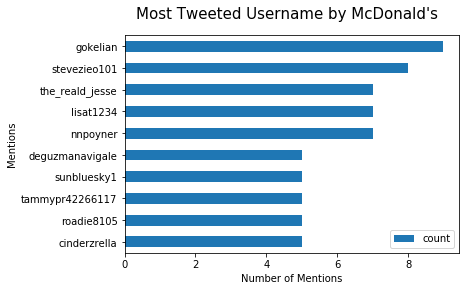

In [689]:
# find out who is the most mentioned by mcdonalds

mcd_most_mention = df_mcd['mentions'].value_counts().reset_index()
mcd_most_mention = mcd_most_mention.rename(columns={'index': 'mentions', 'mentions': 'count'})
mcd_most_mention['mentions'].replace('', np.nan, inplace=True)
mcd_most_mention = mcd_most_mention.dropna()
mcd_most_mention = mcd_most_mention.set_index('mentions')
ax = mcd_most_mention.head(10)
ax = ax.sort_values('count',ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("Most Tweeted Username by McDonald's", fontsize=15)
plt.ylabel("Mentions")
plt.xlabel("Number of Mentions")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Most Tweeted Username by McDonald's.png", bbox_inches='tight')


**The most mentioned user by McDonald's is gokelian.**

**McDonald's tweets to gokelian**

In [690]:
# select the tweets only for gokelian

most_mention = df_mcd.loc[df_mcd['mentions']=='gokelian']
most_mention = most_mention[['screen_name', 'tweet', 'mentions']]
most_mention

,screen_name,tweet,mentions
2002,McDonalds,@gokelian a big mac in the sun sounds awesome! thanks for another entry!,gokelian
2004,McDonalds,"@gokelian sounds like a fantastic meal, friend! thanks for entering again.",gokelian
2008,McDonalds,"@gokelian can't go wrong with chicken mcnuggets! good luck, friend.",gokelian
2645,McDonalds,"@gokelian sounds delicious! best of luck, friend!",gokelian
2646,McDonalds,"@gokelian mmm, you're making us hungry! thanks for entering.",gokelian
2647,McDonalds,"@gokelian great choices, friend! thanks for another entry!",gokelian
2991,McDonalds,@gokelian mmm... sounds delicious! 😋 🍔 thanks for another entry!,gokelian
2992,McDonalds,@gokelian your delivery is our delight! thanks again for entering!,gokelian
2993,McDonalds,@gokelian having a big mac delivered would be a blockbuster! best of luck to you!,gokelian


**It appears that McDonald's has been replying gokelian's sweepstakes entry back.**

### Popular Words Used by McDonald's on Their Tweets

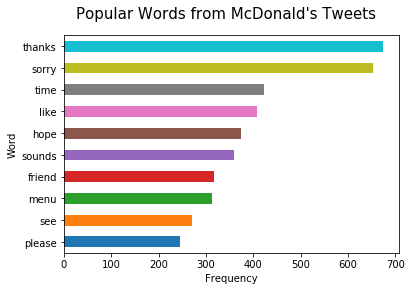

In [691]:
# find out the most popular words from mcdonalds tweets

ax = df_mcd.cleaned.str.split(expand=True).stack().value_counts().head(10)
ax = ax.sort_values(ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("Popular Words from McDonald's Tweets", fontsize=15)
plt.ylabel("Word")
plt.xlabel("Frequency")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Popular Words from McDonald's Tweets.png", bbox_inches='tight')


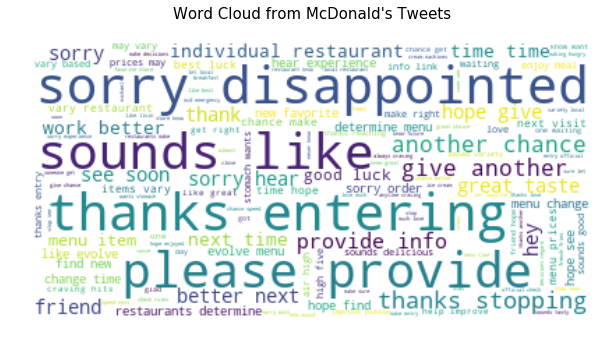

In [692]:
# word cloud of mcdonalds tweets

from nltk.corpus import stopwords
stopwords = stopwords.words('english')

wordcloud = WordCloud(background_color="white",
                      max_font_size=50, relative_scaling=.5, 
                      random_state=1, stopwords=stopwords).generate(' '.join(df_mcd['cleaned']))
plt.figure(figsize=(10,10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud from McDonald's Tweets\n", fontsize=15)
plt.savefig("images/Word Cloud from McDonald's Tweets.png")

### Popular Bigrams 

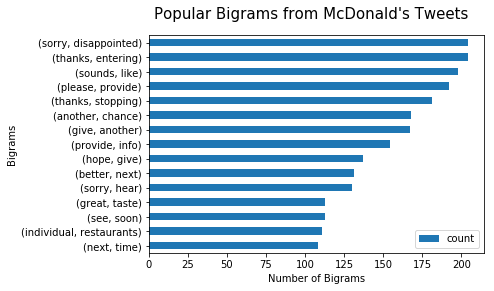

In [693]:
# popular bigrams

mcd_bgs = df_mcd['cleaned'].values.tolist()
mcd_bgs = str(mcd_bgs)
mcd_bgs = re.sub("[^a-zA-Z0-9]", " ", str(mcd_bgs))
mcd_bgs = word_tokenize(mcd_bgs)
mcd_bgs = nltk.bigrams(mcd_bgs)
mcd_bgs = nltk.FreqDist(mcd_bgs)
df_mcd_bigram = pd.DataFrame.from_dict(mcd_bgs, orient='index').reset_index()
df_mcd_bigram = df_mcd_bigram.rename(columns={'index':'bigram', 0:'count'})
df_mcd_bigram = df_mcd_bigram.set_index('bigram')
ax = df_mcd_bigram.sort_values('count', ascending=False).head(15)
ax = ax.sort_values('count', ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("Popular Bigrams from McDonald's Tweets", fontsize=15)
plt.ylabel("Bigrams")
plt.xlabel("Number of Bigrams")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Popular Bigrams from McDonald's Tweets.png", bbox_inches='tight')


### Tweet Metrics

In [694]:
# time series analysis

df_mcd1 = df_mcd
df_mcd1['time'] = pd.to_datetime(df_mcd1['created_at'])
mcd_time = df_mcd1.set_index(['time'])
mcd_time.head(2)

,screen_name,id,created_at,tweet,retweet,hashtags,mentions,hashtag_count,mention_count,cleaned,sentiment
time,,,,,,,,,,,
2019-04-26 17:42:28,McDonalds,1121831928175394816,2019-04-26 17:42:28,"@edilleybar sounds like you’re livin’ the dream, erin! 😊",False,,edilleybar,0,1,edilleybar sounds like livin dream erin,0.5848
2019-04-26 17:36:53,McDonalds,1121830519090683904,2019-04-26 17:36:53,@iamdeara_ we're drooling just thinking about it!,False,,iamdeara_,0,1,iamdeara drooling thinking,0.0000


In [695]:
# create function to count number of tweets 

def f(x):
     return pd.Series(dict(number_of_tweets = x['tweet'].count(), 
                        ))

In [696]:
# time series by month 

mcd_month = mcd_time.groupby(mcd_time.index.month).apply(f)
mcd_month

,number_of_tweets
time,
4,3224


**It appears that all the McDonald's tweets I collected is only from April.**

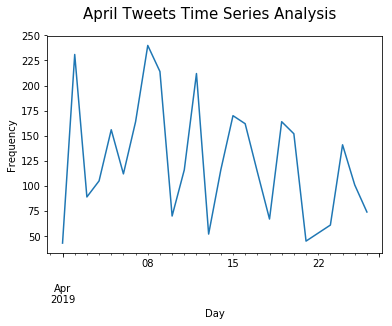

In [697]:
# time series by day

mcd_day = mcd_time.resample('D').size()
ax = mcd_day.plot()
plt.suptitle("April Tweets Time Series Analysis", fontsize=15)
plt.xlabel("Day")
plt.ylabel("Frequency")
plt.show()
fig = ax.get_figure()
fig.savefig('images/april_tweets_mcdonalds.png', bbox_inches='tight')


In [698]:
# find the most tweets per day

mcd_day = mcd_day.reset_index()
mcd_day = mcd_day.rename(columns={0: 'count', 'time': 'date'})
mcd_day.sort_values('count', ascending=False).head()


,date,count
7,2019-04-08,240
1,2019-04-02,231
8,2019-04-09,214
11,2019-04-12,212
14,2019-04-15,170


**It appears that McDonald's tweeted the most on April 8 with 240 tweets.**

### Drill-down: April 8 Tweet Metrics

In [699]:
# select and analyze april 8 tweets

mcd_apr8 = mcd_time['2019-04-08']
print(mcd_apr8.groupby(mcd_apr8['sentiment'].apply(lambda x: 'negative' if x < 0 else 'positive' if x > 0 else 'neutral'))['sentiment'].count())
print('')

# average sentiment for april 8 tweets

print('The average sentiment for April 8 tweets:')
print(mcd_apr8['sentiment'].mean())

sentiment
negative    19 
neutral     31 
positive    190
Name: sentiment, dtype: int64

The average sentiment for April 8 tweets:
0.5471458333333339


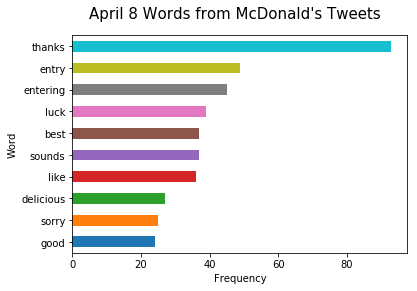

In [700]:
# popular words for april 8 tweets

ax = mcd_apr8.cleaned.str.split(expand=True).stack().value_counts().head(10)
ax = ax.sort_values(ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("April 8 Words from McDonald's Tweets", fontsize=15)
plt.ylabel("Word")
plt.xlabel("Frequency")
plt.show()
fig = ax.get_figure()
fig.savefig("images/April 8 Words from McDonald's Tweets.png", bbox_inches='tight')


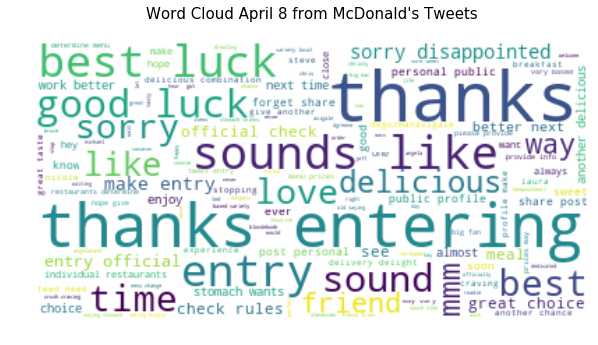

In [701]:
# word cloud of mcdonalds april 8 tweets

wordcloud = WordCloud(background_color="white",
                      max_font_size=50, relative_scaling=.5, 
                      random_state=1, stopwords=stopwords).generate(' '.join(mcd_apr8['cleaned']))
plt.figure(figsize=(10,10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud April 8 from McDonald's Tweets\n", fontsize=15)
plt.savefig("images/Word Cloud April 8 from McDonald's Tweets.png")

## Tweets Mentioning McDonald's Sentiment Analysis

sentiment
negative    475 
neutral     1015
positive    566 
Name: sentiment, dtype: int64

The average sentiment for McDonald's tweets:
0.04197300583657561


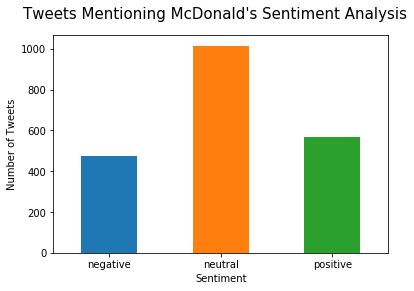

In [702]:
# positive vs. neutral vs. negative counts

print (df_mention_mcd.groupby(df_mention_mcd['sentiment'].apply(lambda x: 'negative' if x < 0 else 'positive' if x > 0 else 'neutral'))['sentiment'].count())
print('')

# average sentiment for all tweets

print("The average sentiment for McDonald's tweets:")
print(df_mention_mcd['sentiment'].mean())

# plot the sentiment classification

ax= df_mention_mcd.groupby(df_mention_mcd['sentiment'].apply(lambda x: 'negative' if x < 0 else 'positive' if x > 0 else 'neutral'))['sentiment'].count().plot(kind='bar')
plt.xticks(rotation=0)
plt.suptitle("Tweets Mentioning McDonald's Sentiment Analysis", fontsize=15)
plt.xlabel("Sentiment")
plt.ylabel("Number of Tweets")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Tweets Mentioning McDonald's Sentiment Analysis.png", bbox_inches='tight')


### McDonald's Negative Tweets

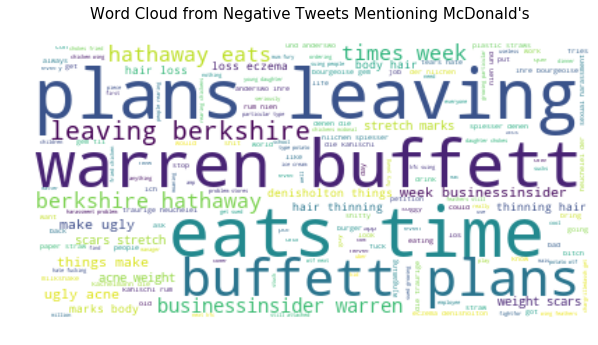

In [703]:
# word cloud negative tweets
#add stopwords

mcd_neg = df_mention_mcd.loc[df_mention_mcd['sentiment'] < 0]

from nltk.corpus import stopwords
stopwords = set(stopwords.words("english"))
stopwords.add("mcdonald")
stopwords.add("says")
stopwords.add("mcdonalds")

wordcloud = WordCloud(background_color="white",
                      max_font_size=50, relative_scaling=.5, 
                      random_state=1, stopwords=stopwords).generate(' '.join(mcd_neg['cleaned']))
plt.figure(figsize=(10,10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud from Negative Tweets Mentioning McDonald's \n", fontsize=15)
plt.savefig("images/Word Cloud from Negative Tweets Mentioning McDonald's.png")

### Popular Bigrams Negative Tweets

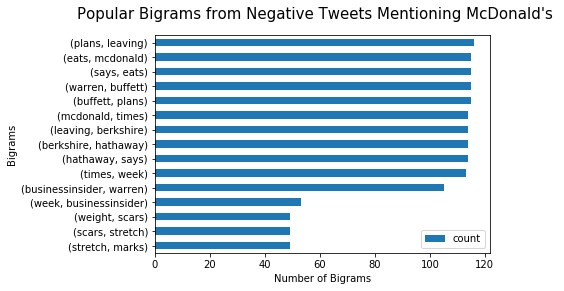

In [704]:
# popular bigrams

mcd_bgs = mcd_neg['cleaned'].values.tolist()
mcd_bgs = str(mcd_bgs)
mcd_bgs = re.sub("[^a-zA-Z0-9]", " ", str(mcd_bgs))
mcd_bgs = word_tokenize(mcd_bgs)
mcd_bgs = nltk.bigrams(mcd_bgs)
mcd_bgs = nltk.FreqDist(mcd_bgs)
df_mcd_bigram = pd.DataFrame.from_dict(mcd_bgs, orient='index').reset_index()
df_mcd_bigram = df_mcd_bigram.rename(columns={'index':'bigram', 0:'count'})
df_mcd_bigram = df_mcd_bigram.set_index('bigram')
ax = df_mcd_bigram.sort_values('count', ascending=False).head(15)
ax = ax.sort_values('count', ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("Popular Bigrams from Negative Tweets Mentioning McDonald's ", fontsize=15)
plt.ylabel("Bigrams")
plt.xlabel("Number of Bigrams")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Popular Bigrams from Negative Tweets Mentioning McDonald's.png", bbox_inches='tight')


### McDonald's Positive Tweets

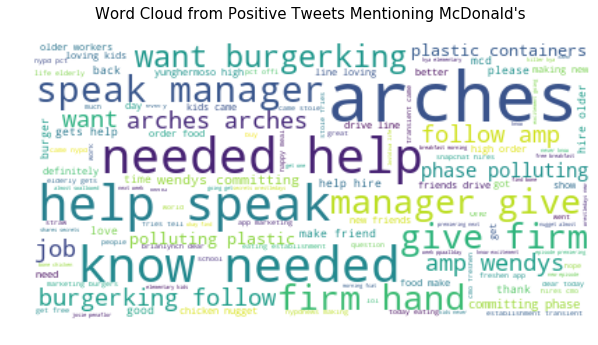

In [705]:
# word cloud positive tweets
# add stopwords

mcd_pos = df_mention_mcd.loc[df_mention_mcd['sentiment'] > 0]

from nltk.corpus import stopwords
stopwords = set(stopwords.words("english"))
stopwords.add("model")
stopwords.add("dimitri")
stopwords.add("wanna")
stopwords.add("aarp")
stopwords.add("really")
stopwords.add("mcdonald")
stopwords.add("mcdonalds")
stopwords.add("hair")
stopwords.add("look")
stopwords.add("like")
stopwords.add("bmarchant")
stopwords.add("makes")
stopwords.add("flamingopunch")
stopwords.add("ask")

wordcloud = WordCloud(background_color="white",
                      max_font_size=50, relative_scaling=.5, 
                      random_state=1, stopwords=stopwords).generate(' '.join(mcd_pos['cleaned']))
plt.figure(figsize=(10,10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud from Positive Tweets Mentioning McDonald's \n", fontsize=15)
plt.savefig("images/Word Cloud from Positive Tweets Mentioning McDonald's.png")

### Popular Bigrams Positive Tweets 

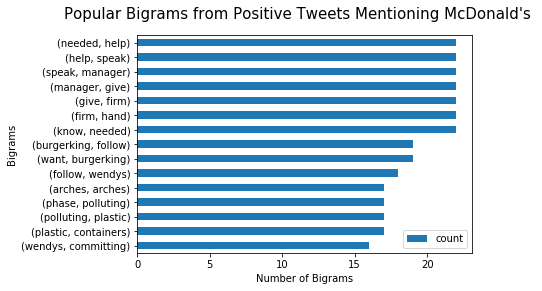

In [706]:
# popular bigrams
from nltk.corpus import stopwords

mcd_bgs = mcd_pos['cleaned'].values.tolist()
mcd_bgs = str(mcd_bgs)
mcd_bgs = re.sub("[^a-zA-Z0-9]", " ", str(mcd_bgs))
mcd_bgs = word_tokenize(mcd_bgs)
more_stopwords = set(('model', 'dimitri', 'wanna', 'aarp', 'really', 
                      'mcdonald', 'mcdonalds', 'hair', 'look',
                      'like', 'bmarchant', 'makes', 'flamingopunch', 'ask', 'wan', 'na', 'amp'))
extra_stoplist = set(stopwords.words('english')) | more_stopwords
mcd_bgs = (word for word in mcd_bgs if word not in extra_stoplist)
mcd_bgs = nltk.bigrams(mcd_bgs)
mcd_bgs = nltk.FreqDist(mcd_bgs)
df_mcd_bigram = pd.DataFrame.from_dict(mcd_bgs, orient='index').reset_index()
df_mcd_bigram = df_mcd_bigram.rename(columns={'index':'bigram', 0:'count'})
df_mcd_bigram = df_mcd_bigram.set_index('bigram')
ax = df_mcd_bigram.sort_values('count', ascending=False).head(15)
ax = ax.sort_values('count', ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("Popular Bigrams from Positive Tweets Mentioning McDonald's ", fontsize=15)
plt.ylabel("Bigrams")
plt.xlabel("Number of Bigrams")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Popular Bigrams from Positive Tweets Mentioning McDonald's.png", bbox_inches='tight')


## McDonald's Tweets Sentiment Analysis

sentiment
negative    354 
neutral     497 
positive    2373
Name: sentiment, dtype: int64

The average sentiment for McDonald's tweets:
0.4420887096774201


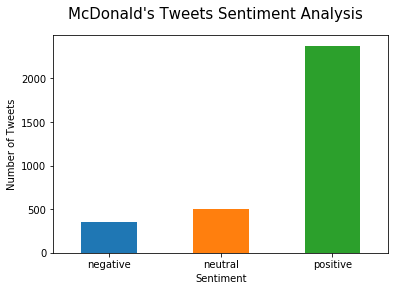

In [707]:
# positive vs. neutral vs. negative counts

print (df_mcd.groupby(df_mcd['sentiment'].apply(lambda x: 'negative' if x < 0 else 'positive' if x > 0 else 'neutral'))['sentiment'].count())
print('')

# average sentiment for all tweets

print("The average sentiment for McDonald's tweets:")
print(df_mcd['sentiment'].mean())

# plot the sentiment classification

ax= df_mcd.groupby(df_mcd['sentiment'].apply(lambda x: 'negative' if x < 0 else 'positive' if x > 0 else 'neutral'))['sentiment'].count().plot(kind='bar')
plt.xticks(rotation=0)
plt.suptitle("McDonald's Tweets Sentiment Analysis", fontsize=15)
plt.xlabel("Sentiment")
plt.ylabel("Number of Tweets")
plt.show()
fig = ax.get_figure()
fig.savefig("images/McDonald's Tweets Sentiment Analysis.png", bbox_inches='tight')


### McDonald's Negative Tweets

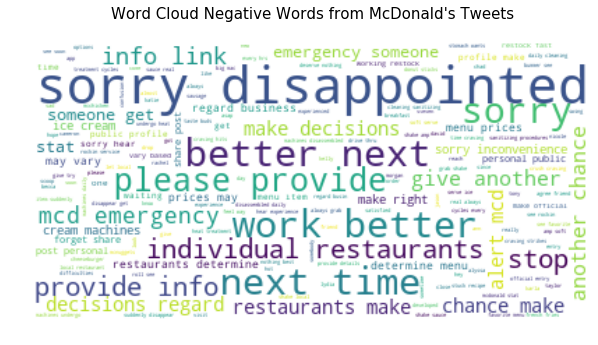

In [709]:
# word cloud of mcdonalds negative tweets

mcd_neg = df_mcd.loc[df_mcd['sentiment'] < 0]

from nltk.corpus import stopwords
stopwords = set(stopwords.words("english"))

wordcloud = WordCloud(background_color="white",
                      max_font_size=50, relative_scaling=.5, 
                      random_state=1, stopwords=stopwords).generate(' '.join(mcd_neg['cleaned']))
plt.figure(figsize=(10,10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud Negative Words from McDonald's Tweets\n", fontsize=15)
plt.savefig("images/Word Cloud Negative Words from McDonald's Tweets.png")

### Popular Bigrams Negative Tweets

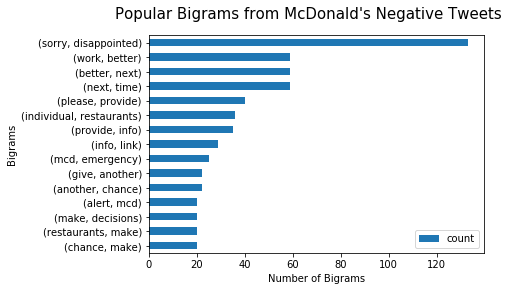

In [710]:
# popular bigrams

mcd_bgs = mcd_neg['cleaned'].values.tolist()
mcd_bgs = str(mcd_bgs)
mcd_bgs = re.sub("[^a-zA-Z0-9]", " ", str(mcd_bgs))
mcd_bgs = word_tokenize(mcd_bgs)
mcd_bgs = nltk.bigrams(mcd_bgs)
mcd_bgs = nltk.FreqDist(mcd_bgs)
df_mcd_bigram = pd.DataFrame.from_dict(mcd_bgs, orient='index').reset_index()
df_mcd_bigram = df_mcd_bigram.rename(columns={'index':'bigram', 0:'count'})
df_mcd_bigram = df_mcd_bigram.set_index('bigram')
ax = df_mcd_bigram.sort_values('count', ascending=False).head(15)
ax = ax.sort_values('count', ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("Popular Bigrams from McDonald's Negative Tweets ", fontsize=15)
plt.ylabel("Bigrams")
plt.xlabel("Number of Bigrams")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Popular Bigrams from McDonald's Negative Tweets.png", bbox_inches='tight')


### McDonald's Positive Tweets

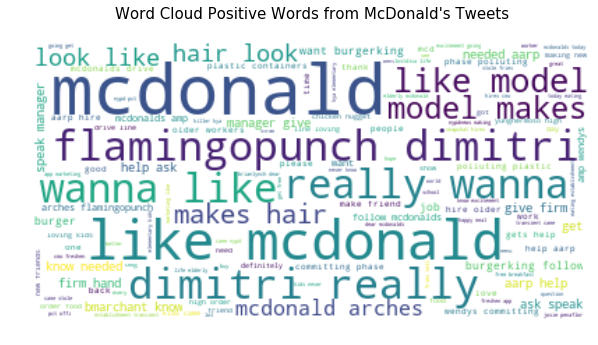

In [503]:
# word cloud of mcdonalds positive tweets

wordcloud = WordCloud(background_color="white",
                      max_font_size=50, relative_scaling=.5, 
                      random_state=1, stopwords=stopwords).generate(' '.join(mcd_pos['cleaned']))
plt.figure(figsize=(10,10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud Positive Words from McDonald's Tweets\n", fontsize=15)
plt.savefig("images/Word Cloud Positive Words from McDonald's Tweets.png")

### Popular Bigrams Positive Tweets

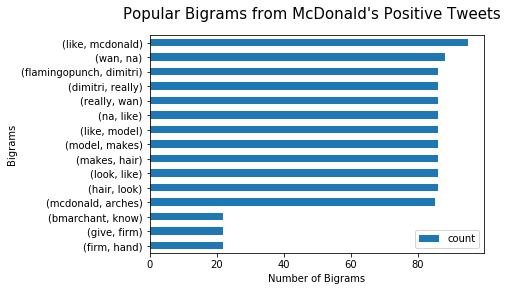

In [504]:
# popular bigrams

mcd_bgs = mcd_pos['cleaned'].values.tolist()
mcd_bgs = str(mcd_bgs)
mcd_bgs = re.sub("[^a-zA-Z0-9]", " ", str(mcd_bgs))
mcd_bgs = word_tokenize(mcd_bgs)
mcd_bgs = nltk.bigrams(mcd_bgs)
mcd_bgs = nltk.FreqDist(mcd_bgs)
df_mcd_bigram = pd.DataFrame.from_dict(mcd_bgs, orient='index').reset_index()
df_mcd_bigram = df_mcd_bigram.rename(columns={'index':'bigram', 0:'count'})
df_mcd_bigram = df_mcd_bigram.set_index('bigram')
ax = df_mcd_bigram.sort_values('count', ascending=False).head(15)
ax = ax.sort_values('count', ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("Popular Bigrams from McDonald's Positive Tweets", fontsize=15)
plt.ylabel("Bigrams")
plt.xlabel("Number of Bigrams")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Popular Bigrams from McDonald's Positive Tweets.png", bbox_inches='tight')


## Topic Modeling for Tweets Mentioning McDonald's 

In [505]:
# select data for topic modeling and convert to list

mcd_modeling = df_mention_mcd['tweet']
texts = mcd_modeling.values

### Data Cleaning

In [506]:
# text preprocessing
from nltk.corpus import stopwords

# Remove useless numbers and alphanumerical words
documents = [re.sub("[^a-zA-Z]+", " ", str(text)) for text in texts]

# tokenize
texts = [document.split() for document in documents]

# stemming words: having --> have; friends --> friend
wordnet_lemmatizer = WordNetLemmatizer()
texts = [[wordnet_lemmatizer.lemmatize(word) for word in tokens] for tokens in texts]

# remove common words 
stoplist = stopwords.words('english')
texts = [[word for word in tokens if word not in stoplist] for tokens in texts]

#remove short words
texts = [[word for word in tokens if len(word) >= 3] for tokens in texts]

# A list of extra stopwords 
extra_stopwords = ['http', 'year', 'old', 'next', 'leilachaibi',
                   'los', 'france', 'ojlfz', 'para', 'por', 'con',
                   'nostitch', 'und', 'euch', 'veganen', 'ihr', 'ich',
                   'aber', 'nicht', 'qmnattepny', 'nwpddws', 'que', 'fiscal',
                  'imp', 'paie', 'gie', 'aarp', 'fucking', 'cmo', 'mcdonald', 'mcdonalds']

extra_stoplist = extra_stopwords

# remove extra stopwords
texts = [[word for word in tokens if word not in extra_stoplist] for tokens in texts]
len(texts)
#https://github.com/alexperrier/datatalks/blob/master/debates/R/stm.R

2056

In [507]:
# save the preprocessed texts
df_texts = pd.DataFrame(texts)
df_texts.to_csv('data/mention_mcd_processed_texts.csv', index=False, header=False)

# Create a dictionary representation of the documents.

dictionary = Dictionary(texts) 

len(dictionary)

5444

In [508]:
# Remove rare and common tokens.
# ignore words that appear in less than 2 documents or more than 40% documents (remove too frequent & infrequent words) - an optional step
dictionary.filter_extremes(no_below=5, no_above=0.5) #https://radimrehurek.com/gensim/corpora/dictionary.html#gensim.corpora.dictionary.Dictionary.filter_extremes
dictionary.save('data/mention_mcd_texts.dict')  # store the dictionary, for future reference
len(dictionary)

583

In [509]:
# convert words to vetors or integers
corpus = [dictionary.doc2bow(text) for text in texts]
corpora.MmCorpus.serialize('data/mention_mcd_texts.mm', corpus)  
len(corpus)

2056

In [510]:
print(('Number of unique tokens: %d' % len(dictionary)))
print(('Number of documents: %d' % len(corpus)))

# save dict and corpus

saved_dict = dictionary.load('data/mention_mcd_texts.dict')
saved_corpus = corpora.MmCorpus('data/mention_mcd_texts.mm')

Number of unique tokens: 583
Number of documents: 2056


### Determine Optimal K-value

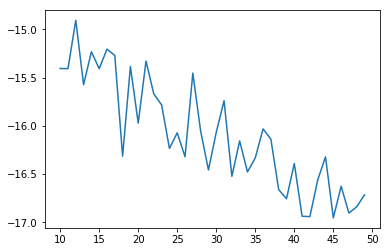

In [511]:
# load the optimal k-value result
Image("images/Optimal K-value for Tweets Mentioning McDonald's LDA Model.png")

**Optimal k-value is 12 topics**

### Build topic modeling model with LDA and use optimal k-value = 12

In [512]:
# use the optimal k-value to build model (num_topics=12)

numpy.random.seed(1) # setting random seed to get the same results each time. 
model = ldamodel.LdaModel(corpus, id2word=dictionary, num_topics=12, passes=20, eval_every=1)

In [513]:
# save the best and optimal lda model
model.save('data/lda_mcd_mention.model') 

In [514]:
# load the model
model = models.LdaModel.load('data/lda_mcd_mention.model')

### Term-Topic Distribution

In [515]:
# let's see the topic found by the model

model.show_topics(num_topics=12)

[(0,
  '0.077*"fry" + 0.070*"french" + 0.068*"itsfoodporn" + 0.068*"week" + 0.068*"say" + 0.068*"eats" + 0.067*"warren" + 0.066*"plan" + 0.066*"time" + 0.066*"buffett"'),
 (1,
  '0.040*"real" + 0.039*"einen" + 0.039*"ceo" + 0.038*"nur" + 0.024*"people" + 0.023*"job" + 0.020*"get" + 0.019*"need" + 0.018*"back" + 0.017*"man"'),
 (2,
  '0.091*"time" + 0.090*"day" + 0.050*"burger" + 0.048*"bring" + 0.044*"vegan" + 0.043*"menu" + 0.040*"made" + 0.039*"germany" + 0.039*"looking" + 0.018*"new"'),
 (3,
  '0.282*"burger" + 0.156*"king" + 0.074*"ein" + 0.019*"see" + 0.018*"game" + 0.018*"went" + 0.014*"eat" + 0.012*"kfc" + 0.012*"dude" + 0.012*"heart"'),
 (4,
  '0.056*"tell" + 0.045*"would" + 0.043*"job" + 0.039*"work" + 0.037*"five" + 0.033*"life" + 0.033*"let" + 0.032*"samsora" + 0.032*"pro" + 0.032*"player"'),
 (5,
  '0.056*"chicken" + 0.048*"still" + 0.038*"wing" + 0.038*"lol" + 0.038*"room" + 0.038*"young" + 0.038*"feather" + 0.036*"kid" + 0.036*"fried" + 0.036*"choke"'),
 (6,
  '0.068*"man

In [516]:
# print topics without probability
for i in range(0,12):
    topics = model.show_topic(i, 10)
    print(', '.join([str(word[0]) for word in topics]))

fry, french, itsfoodporn, week, say, eats, warren, plan, time, buffett
real, einen, ceo, nur, people, job, get, need, back, man
time, day, burger, bring, vegan, menu, made, germany, looking, new
burger, king, ein, see, game, went, eat, kfc, dude, heart
tell, would, job, work, five, life, let, samsora, pro, player
chicken, still, wing, lol, room, young, feather, kid, fried, choke
man, get, worker, help, older, customer, hire, store, calling, manager
first, drive, snap, hire, thru, mitchell, kenny, brianlynch, said, fuck
want, think, never, straw, get, going, would, breakfast, getting, much
like, make, look, really, wanna, arch, hair, flamingopunch, model, dimitri
thing, wendys, hair, friend, make, body, lunch, taking, mark, ugly
local, night, tomorrow, point, pick, road, sauce, vasion, fiscale, sandwicherie


**Tweets Mentioning McDonald's Topics:**
1. French fries by itsfoodporn and Warren Buffet plans
2. Real people need to get job
3. Bring vegan burger menu
4. Burger King and KFC to watch games
5. Gaming player samsora pro life
6. Fried chicken wing
7. Calling manager and worker to help customer
8. Drive thru 
9. Get going with breakfast
10. Flamingopunch and model dimitri hair
11. Wendy's lunch hair body ugly
12. Local night sauce

### Data Visualization with Gensim

In [517]:
# better visualization with gensim

pyLDAvis.enable_notebook()
pyLDAvis.gensim.prepare(model, corpus, dictionary, sort_topics=False)

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0     -0.177085  0.391430  1       1        15.809645
1     -0.024028 -0.123817  2       1        9.299696 
2     -0.028992  0.077787  3       1        6.587275 
3      0.013920 -0.022739  4       1        3.424016 
4     -0.216357 -0.151437  5       1        10.114525
5     -0.060638 -0.014096  6       1        6.332828 
6     -0.098061 -0.048501  7       1        4.301440 
7      0.154293  0.006343  8       1        8.442019 
8     -0.065433 -0.178467  9       1        8.203913 
9      0.316848  0.056959  10      1        12.718428
10     0.212877  0.000055  11      1        11.757319
11    -0.027344  0.006485  12      1        3.008907 , topic_info=     Category        Freq             Term       Total  loglift  logprob
term                                                                    
15    Default  257.000000  like             257.000000  30.0000  30.0000
76    Default  138.000000  burger           138.000000  29.0000  29.0000
71    Default  190.000000  time             190.000000  28.0000  28.0000
37    Default  130.000000  fry              130.000000  27.0000  27.0000
26    Default  164.000000  hair             164.000000  26.0000  26.0000
36    Default  119.000000  french           119.000000  25.0000  25.0000
73    Default  115.000000  itsfoodporn      115.000000  24.0000  24.0000
94    Default  115.000000  week             115.000000  23.0000  23.0000
486   Default  114.000000  eats             114.000000  22.0000  22.0000
572   Default  113.000000  warren           113.000000  21.0000  21.0000
27    Default  100.000000  look             100.000000  20.0000  20.0000
571   Default  111.000000  plan             111.000000  19.0000  19.0000
568   Default  111.000000  buffett          111.000000  18.0000  18.0000
570   Default  111.000000  leaving          111.000000  17.0000  17.0000
198   Default  57.000000   king             57.000000   16.0000  16.0000
567   Default  110.000000  berkshire        110.000000  15.0000  15.0000
569   Default  110.000000  hathaway         110.000000  14.0000  14.0000
28    Default  168.000000  make             168.000000  13.0000  13.0000
30    Default  124.000000  really           124.000000  12.0000  12.0000
31    Default  93.000000   wanna            93.000000   11.0000  11.0000
345   Default  138.000000  say              138.000000  10.0000  10.0000
23    Default  93.000000   arch             93.000000   9.0000   9.0000 
29    Default  93.000000   model            93.000000   8.0000   8.0000 
24    Default  93.000000   dimitri          93.000000   7.0000   7.0000 
25    Default  93.000000   flamingopunch    93.000000   6.0000   6.0000 
338   Default  85.000000   day              85.000000   5.0000   5.0000 
47    Default  102.000000  thing            102.000000  4.0000   4.0000 
135   Default  65.000000   want             65.000000   3.0000   3.0000 
573   Default  91.000000   businessinsider  91.000000   2.0000   2.0000 
220   Default  85.000000   wendys           85.000000   1.0000   1.0000 
...       ...        ...               ...        ...      ...      ... 
371   Topic12  21.946859   night            22.947445   3.4590  -2.6801 
276   Topic12  21.946854   tomorrow         22.947439   3.4590  -2.6801 
491   Topic12  21.501759   point            22.502344   3.4581  -2.7006 
523   Topic12  21.279205   pick             22.279791   3.4576  -2.7110 
274   Topic12  13.219520   sauce            14.220108   3.4306  -3.1870 
233   Topic12  12.997054   centre           13.997639   3.4294  -3.2040 
236   Topic12  12.997054   strat            13.997639   3.4294  -3.2040 
235   Topic12  12.997054   sandwicherie     13.997639   3.4294  -3.2040 
234   Topic12  12.997054   fiscale          13.997639   3.4294  -3.2040 
237   Topic12  12.997054   vasion           13.997639   3.4294  -3.2040 
232   Topic12  12.997054   alors            13.997639   3.4294

## Topic Modeling for McDonald's Tweets

In [518]:
# select data for topic modeling and convert to list

mcd_modeling = df_mcd['tweet']
texts = mcd_modeling.values

### Data Cleaning

In [519]:
# text preprocessing
from nltk.corpus import stopwords

# Remove useless numbers and alphanumerical words
documents = [re.sub("[^a-zA-Z]+", " ", str(text)) for text in texts]

# tokenize
texts = [document.split() for document in documents]

# stemming words: having --> have; friends --> friend
wordnet_lemmatizer = WordNetLemmatizer()
texts = [[wordnet_lemmatizer.lemmatize(word) for word in tokens] for tokens in texts]

# remove common words 
stoplist = stopwords.words('english')
texts = [[word for word in tokens if word not in stoplist] for tokens in texts]

#remove short words
texts = [[word for word in tokens if len(word) >= 3] for tokens in texts]

# A list of extra stopwords 
extra_stopwords = ['http', 'year', 'old', 'next', 'leilachaibi',
                   'los', 'france', 'ojlfz', 'para', 'por', 'con',
                   'nostitch', 'und', 'euch', 'veganen', 'ihr', 'ich',
                   'aber', 'nicht', 'qmnattepny', 'nwpddws', 'que', 'fiscal',
                  'imp', 'paie', 'gie', 'aarp', 'fucking', 'cmo', 'mcdonald', 'mcdonalds']

extra_stoplist = extra_stopwords

# remove extra stopwords
texts = [[word for word in tokens if word not in extra_stoplist] for tokens in texts]
len(texts)
#https://github.com/alexperrier/datatalks/blob/master/debates/R/stm.R

3224

In [520]:
# save the preprocessed texts
df_texts = pd.DataFrame(texts)
df_texts.to_csv('data/mcd_processed_texts.csv', index=False, header=False)

# Create a dictionary representation of the documents.

dictionary = Dictionary(texts) 

len(dictionary)

5762

In [521]:
# Remove rare and common tokens.
# ignore words that appear in less than 2 documents or more than 40% documents (remove too frequent & infrequent words) - an optional step
dictionary.filter_extremes(no_below=5, no_above=0.5) #https://radimrehurek.com/gensim/corpora/dictionary.html#gensim.corpora.dictionary.Dictionary.filter_extremes
dictionary.save('data/mcd_texts.dict')  # store the dictionary, for future reference
len(dictionary)

549

In [522]:
# convert words to vetors or integers
corpus = [dictionary.doc2bow(text) for text in texts]
corpora.MmCorpus.serialize('data/mcd_texts.mm', corpus)  
len(corpus)

3224

In [523]:
print(('Number of unique tokens: %d' % len(dictionary)))
print(('Number of documents: %d' % len(corpus)))

# save dict and corpus

saved_dict = dictionary.load('data/mcd_texts.dict')
saved_corpus = corpora.MmCorpus('data/mcd_texts.mm')

Number of unique tokens: 549
Number of documents: 3224


### Determine Optimal K-value

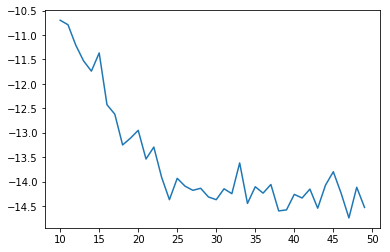

In [524]:
# load the optimal k-value result
Image("images/Optimal K-value for McDonald's LDA Model.png")

**Optimal k-value is 10 topics**

### Build topic modeling model with LDA and use optimal k-value = 10

In [525]:
# use the optimal k-value to build model (num_topics=10)

numpy.random.seed(1) # setting random seed to get the same results each time. 
model = ldamodel.LdaModel(corpus, id2word=dictionary, num_topics=10, passes=20, eval_every=1)

In [526]:
# save the best and optimal lda model
model.save('data/lda_mcd.model') 

In [527]:
# load the model
model = models.LdaModel.load('data/lda_mcd.model')

### Term-Topic Distribution

In [528]:
# let's see the topic found by the model

model.show_topics(num_topics=10)

[(0,
  '0.173*"great" + 0.120*"taste" + 0.045*"glad" + 0.031*"day" + 0.028*"way" + 0.023*"always" + 0.023*"knew" + 0.023*"combination" + 0.019*"thank" + 0.018*"steve"'),
 (1,
  '0.047*"get" + 0.040*"love" + 0.031*"craving" + 0.029*"hit" + 0.028*"welcome" + 0.024*"fry" + 0.024*"never" + 0.023*"mcd" + 0.023*"much" + 0.023*"someone"'),
 (2,
  '0.096*"see" + 0.095*"sound" + 0.070*"soon" + 0.060*"like" + 0.047*"friend" + 0.043*"stop" + 0.040*"want" + 0.039*"craving" + 0.037*"waiting" + 0.031*"always"'),
 (3,
  '0.119*"please" + 0.115*"sorry" + 0.098*"provide" + 0.077*"info" + 0.071*"experience" + 0.070*"hear" + 0.061*"whvwt" + 0.034*"help" + 0.030*"link" + 0.028*"almost"'),
 (4,
  '0.134*"time" + 0.062*"menu" + 0.052*"like" + 0.050*"favorite" + 0.049*"new" + 0.046*"change" + 0.042*"hope" + 0.038*"evolve" + 0.036*"find" + 0.029*"hey"'),
 (5,
  '0.124*"thanks" + 0.107*"entering" + 0.087*"luck" + 0.079*"sound" + 0.076*"best" + 0.071*"like" + 0.057*"good" + 0.047*"delicious" + 0.038*"choice" + 

In [529]:
# print topics without probability
for i in range(0,10):
    topics = model.show_topic(i, 10)
    print(', '.join([str(word[0]) for word in topics]))

great, taste, glad, day, way, always, knew, combination, thank, steve
get, love, craving, hit, welcome, fry, never, mcd, much, someone
see, sound, soon, like, friend, stop, want, craving, waiting, always
please, sorry, provide, info, experience, hear, whvwt, help, link, almost
time, menu, like, favorite, new, change, hope, evolve, find, hey
thanks, entering, luck, sound, best, like, good, delicious, choice, mmm
thanks, stopping, time, entry, better, work, sorry, enjoy, love, disappointed
hope, sorry, chance, give, another, right, disappointed, order, visit, make
restaurant, menu, vary, local, item, individual, determine, know, may, let
make, entry, official, profile, check, rule, sure, vjwqoph, think, post


**McDonald's Tweets Topics:**
1. Gratitude and thanking to customers
2. Love someone get craving on the fries
3. Saying see you again soon and always craving
4. Sorry for something and asking for more information to help customers
5. Favorite menu and hoping to see some change on the menu
6. Thanks for entering the sweepstakes and wishing best of luck
7. Thanks for entering the entry and sorry for not getting the prize
8. Making up for mistake and handling complaints for your next visit
9. Menu on local restaurants vary
10. To make your sweepstakes entry official, please check the rule

### Data Visualization with Gensim

In [530]:
# better visualization with gensim

pyLDAvis.enable_notebook()
pyLDAvis.gensim.prepare(model, corpus, dictionary, sort_topics=False)

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0     -0.134171 -0.064898  1       1        6.925712 
1     -0.025244  0.004090  2       1        8.513749 
2     -0.219916  0.012576  3       1        10.824351
3      0.224962 -0.228536  4       1        10.092583
4     -0.023345  0.211955  5       1        11.078128
5     -0.300912 -0.042959  6       1        10.028521
6     -0.010953 -0.139837  7       1        11.610707
7      0.173903 -0.154942  8       1        12.969151
8      0.155025  0.295501  9       1        10.120789
9      0.160650  0.107051  10      1        7.836319 , topic_info=     Category        Freq        Term       Total  loglift  logprob
term                                                               
40    Default  630.000000  thanks      630.000000  30.0000  30.0000
21    Default  393.000000  time        393.000000  29.0000  29.0000
13    Default  227.000000  great       227.000000  28.0000  28.0000
3     Default  345.000000  sound       345.000000  27.0000  27.0000
89    Default  228.000000  please      228.000000  26.0000  26.0000
26    Default  351.000000  hope        351.000000  25.0000  25.0000
30    Default  602.000000  sorry       602.000000  24.0000  24.0000
73    Default  303.000000  menu        303.000000  23.0000  23.0000
76    Default  236.000000  restaurant  236.000000  22.0000  22.0000
24    Default  225.000000  chance      225.000000  21.0000  21.0000
409   Default  212.000000  entering    212.000000  20.0000  20.0000
90    Default  188.000000  provide     188.000000  19.0000  19.0000
25    Default  228.000000  give        228.000000  18.0000  18.0000
14    Default  157.000000  taste       157.000000  17.0000  17.0000
7     Default  236.000000  see         236.000000  16.0000  16.0000
1     Default  373.000000  like        373.000000  15.0000  15.0000
481   Default  220.000000  entry       220.000000  14.0000  14.0000
233   Default  164.000000  luck        164.000000  13.0000  13.0000
35    Default  223.000000  make        223.000000  12.0000  12.0000
88    Default  148.000000  info        148.000000  11.0000  11.0000
121   Default  144.000000  best        144.000000  10.0000  10.0000
39    Default  154.000000  stopping    154.000000  9.0000   9.0000 
23    Default  212.000000  another     212.000000  8.0000   8.0000 
64    Default  186.000000  soon        186.000000  7.0000   7.0000 
86    Default  136.000000  experience  136.000000  6.0000   6.0000 
78    Default  135.000000  vary        135.000000  5.0000   5.0000 
87    Default  159.000000  hear        159.000000  4.0000   4.0000 
91    Default  116.000000  whvwt       116.000000  3.0000   3.0000 
261   Default  102.000000  official    102.000000  2.0000   2.0000 
126   Default  189.000000  good        189.000000  1.0000   1.0000 
...       ...         ...       ...           ...     ...      ... 
192   Topic10  23.316948   regard      24.207539   2.5089  -4.1494 
186   Topic10  20.697773   ubereats    21.588388   2.5043  -4.2685 
209   Topic10  16.591648   business    17.482235   2.4941  -4.4897 
410   Topic10  14.218151   winner      15.108781   2.4856  -4.6440 
187   Topic10  13.157781   website     14.048379   2.4809  -4.7215 
329   Topic10  12.873302   closed      13.763897   2.4795  -4.7434 
545   Topic10  11.422774   entered     12.314869   2.4712  -4.8629 
386   Topic10  10.183003   stay        11.073647   2.4626  -4.9778 
104   Topic10  9.580754    word        10.471657   2.4575  -5.0388 
485   Topic10  9.510515    tuned       10.401155   2.4569  -5.0462 
495   Topic10  9.192489    tay         10.083202   2.4539  -5.0802 
457   Topic10  9.119608    jay         10.012549   2.4530  -5.0881 
325   Topic10  9.051409    creative    9.942008    2.4526  -5.0956 
262   Topic10  31.279993   amp         34.862938   2.4380  -3.8556 
480   Topic10  7.563853    although    8.454483    2.4351  -5.2752 
547   Topic10  7.174058    dip         8.0648

## Tweets Mentioning McDonald's Network Analytics

In [531]:
# let's process the data in list (better for text processing)

tweets = df_mention_mcd.values
len(tweets)

2056

In [532]:
# make screen name and tweet text to be the only screen

mention = []

for tweet in tweets:
    mention.append([tweet[2], tweet[1]])
    
mention[:5]

[['TRANS_G_Bot', 'later as i drink mcdonalds'],
 ['LostDiva',
  "what a life for our elderly. \nmcdonald's gets help from aarp to hire more older workers https://t.co/vaw4z5nmjz"],
 ['TarhodzM',
  'rt @mjdeleonblogs: i\'m sorry but i have to patol. why do people like josie penaflor exist? \n\ni don\'t think "old" and "dirty" would best des…'],
 ['StormGryphon', "@brazybirb @mcdonalds you aren't bipolar, you are genius"],
 ['imerohi',
  "rt @flamingopunch: dimitri i really wanna like you but your 3d model makes your hair look like the mcdonald's arches https://t.co/nwpddws2ng"]]

In [533]:
# computationally intensive ... very slow if you have a lot of data
for i in mention[:5]:
    print(i[0], i[1])

TRANS_G_Bot later as i drink mcdonalds
LostDiva what a life for our elderly. 
mcdonald's gets help from aarp to hire more older workers https://t.co/vaw4z5nmjz
TarhodzM rt @mjdeleonblogs: i'm sorry but i have to patol. why do people like josie penaflor exist? 

i don't think "old" and "dirty" would best des…
StormGryphon @brazybirb @mcdonalds you aren't bipolar, you are genius
imerohi rt @flamingopunch: dimitri i really wanna like you but your 3d model makes your hair look like the mcdonald's arches https://t.co/nwpddws2ng


In [534]:
# select only screen name and mention name

for tweet in mention[:5]:
    a = re.findall(r"(?<=@)\w+", tweet[1])
    for i in a:
        print(tweet[0], i)

TarhodzM mjdeleonblogs
StormGryphon brazybirb
StormGryphon mcdonalds
imerohi flamingopunch


In [535]:
# putting everything together and save it to csv

import csv
mention = []
for tweet in tweets:
    mention.append([tweet[2], tweet[1]])
    
openfile = open("data/mention_mcd_network.csv", "w", newline='')
w = csv.writer(openfile)

for tweet in mention:
    a = re.findall(r"(?<=@)\w+", tweet[1])
    for i in a:
        w.writerow([tweet[0], i])
        
openfile.close()

### Network Visualization

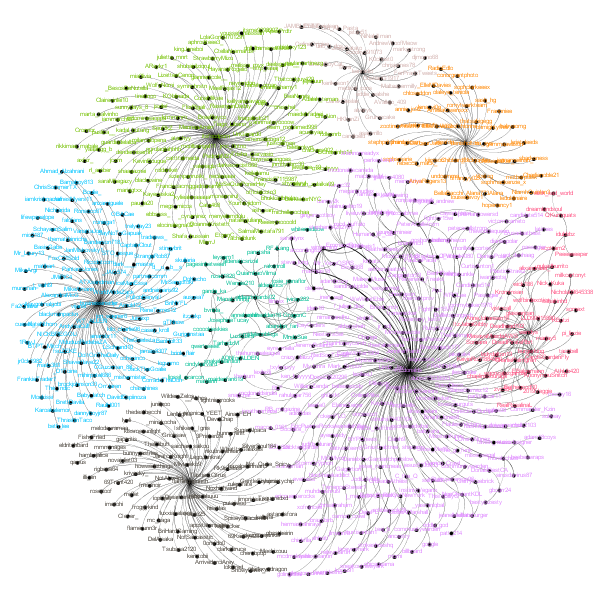

In [536]:
# load the gephi image

Image("images/Tweets Mentioning McDonald's Networks.png")

**As can be seen above, tweets mentioning McDonald's networks by Gephi have 8 clusters. And, the biggest cluster is purple.**

### The Largest Cluster from the Network

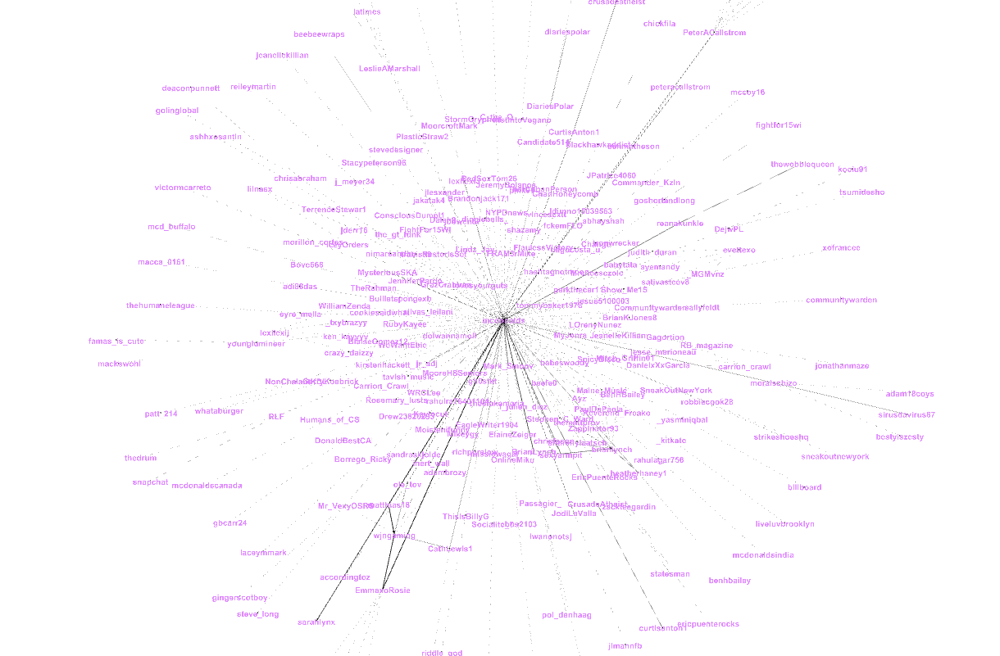

In [537]:
# load the purple cluster

Image("images/Purple Cluster.PNG")

**As can be seen by the network above, the biggest cluster, purple cluster, has a center that is McDonald's.**

### Network Metrics

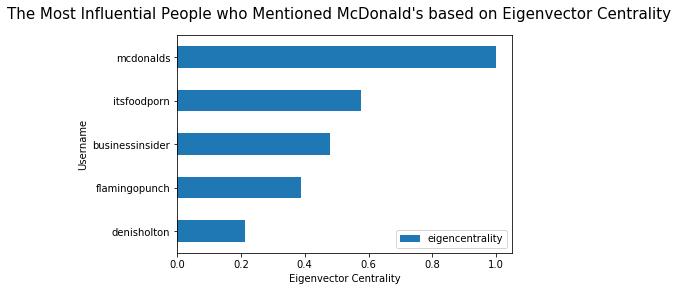

In [538]:
# load the data

mention_mcd_network = pd.read_csv("Tweets mentioning McDonald's networks data.csv")
mention_mcd_network = mention_mcd_network[['Label', 'eigencentrality']]
mention_mcd_network = mention_mcd_network.set_index('Label')
ax = mention_mcd_network.sort_values('eigencentrality', ascending=False).head()
ax = ax.sort_values('eigencentrality', ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("The Most Influential People who Mentioned McDonald's based on Eigenvector Centrality", fontsize=15)
plt.ylabel("Username")
plt.xlabel("Eigenvector Centrality")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Tweet Mentioning McDonald's Network Metrics", bbox_inches='tight')

**The most influential people in terms of eigenvector centrality are mcdonalds, itsfoodporn, businessinsider, flamingopunch, denisholton.**


## McDonald's Tweets Network Analytics

In [539]:
# let's process the data in list (better for text processing)

tweets = df_mcd.values
len(tweets)

3224

In [540]:
# make screen name and tweet text to be the only screen

mention = []

for tweet in tweets:
    mention.append([tweet[0], tweet[3]])
    
mention[:5]

[['McDonalds', '@edilleybar sounds like you’re livin’ the dream, erin! 😊'],
 ['McDonalds', "@iamdeara_ we're drooling just thinking about it!"],
 ['McDonalds', "@liadgarcia we're craving to see you, lia!"],
 ['McDonalds',
  '@terryextralarge a better world requires better solutions - like recycling. by 2025, our goal is to recycle 100% of… https://t.co/ev77q4a6hm'],
 ['McDonalds', "@tokeahontass you've got great taste!"]]

In [541]:
# computationally intensive ... very slow if you have a lot of data
for i in mention[:5]:
    print(i[0], i[1])

McDonalds @edilleybar sounds like you’re livin’ the dream, erin! 😊
McDonalds @iamdeara_ we're drooling just thinking about it!
McDonalds @liadgarcia we're craving to see you, lia!
McDonalds @terryextralarge a better world requires better solutions - like recycling. by 2025, our goal is to recycle 100% of… https://t.co/ev77q4a6hm
McDonalds @tokeahontass you've got great taste!


In [542]:
# select only screen name and mention name

for tweet in mention[:5]:
    a = re.findall(r"(?<=@)\w+", tweet[1])
    for i in a:
        print(tweet[0], i)

McDonalds edilleybar
McDonalds iamdeara_
McDonalds liadgarcia
McDonalds terryextralarge
McDonalds tokeahontass


In [543]:
# putting everything together and save it to csv

import csv
mention = []
for tweet in tweets:
    mention.append([tweet[0], tweet[3]])
    
openfile = open("data/mcd_network.csv", "w", newline='')
w = csv.writer(openfile)

for tweet in mention:
    a = re.findall(r"(?<=@)\w+", tweet[1])
    for i in a:
        w.writerow([tweet[0], i])
        
openfile.close()

### Network Visualization

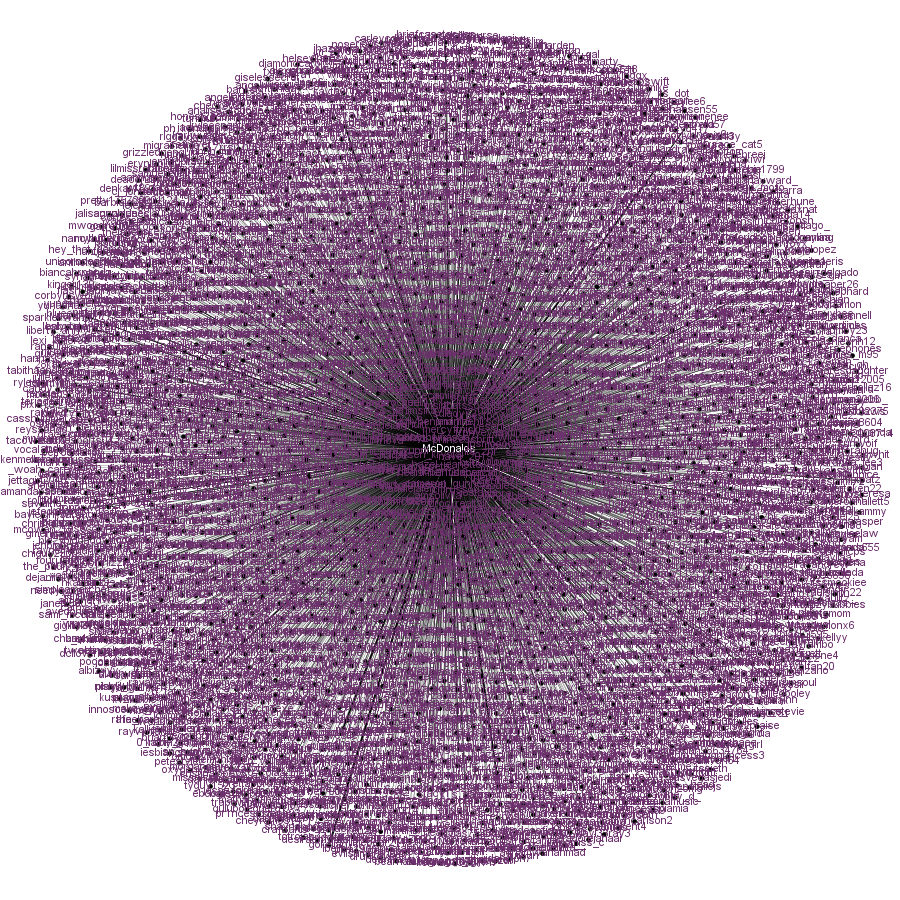

In [544]:
# load the gephi image

Image("images/McDonald's Tweets Networks.PNG")

**As can be seen above, there is only one cluster in the network because this network is from McDonald's tweets and the center here is McDonald's. And, the most influential person here is McDonald's.**

# Burger King Twitter Analysis

**This section includes descriptive, content, sentiment, topic modeling, and network analysis for the company's tweets and the tweets mentioning the company.**

## Tweets Mentioning Burger King Descriptive and Content Analytics

### Total Original Tweets and Retweets

Total Number of Original Tweets and Retweets(False is Original Tweets and True is Retweets)
False    1069
True     992 
Name: retweet, dtype: int64

Total Tweets:
2061



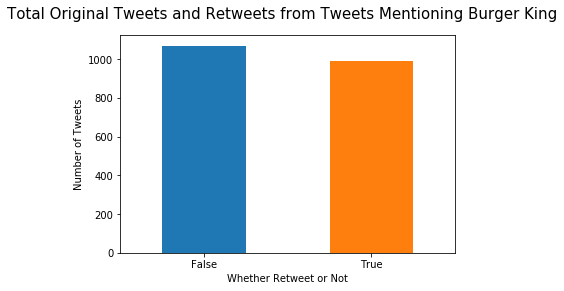

In [545]:
# find out how many tweets and retweets there are

print ('Total Number of Original Tweets and Retweets(False is Original Tweets and True is Retweets)')
print (df_mention_bk['retweet'].value_counts())
print()

# find out total tweets

print ('Total Tweets:')
print (df_mention_bk['tweet'].count())
print()

# plot the total tweets

ax = df_mention_bk['retweet'].value_counts().plot(kind='bar')
plt.xticks(rotation=0)
plt.suptitle("Total Original Tweets and Retweets from Tweets Mentioning Burger King", fontsize=15)
plt.xlabel("Whether Retweet or Not")
plt.ylabel("Number of Tweets")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Total Original Tweets and Retweets from Tweets Mentioning Burger King", bbox_inches='tight')


**There are 992 retweets and 1069 original tweets from tweets mentioning Burger King, which has 2061 tweets in total. This means that there are 2061 people mentioning Burger King from the data.**

### The Most Influential Person who Mentioned Burger King

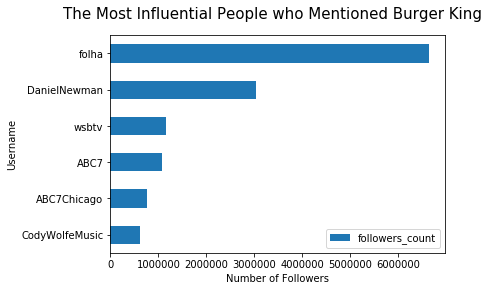

In [546]:
most_followers = df_mention_bk.groupby('screen_name')['followers_count'].sum().sort_values(ascending=False).reset_index().head(6)
most_followers = most_followers.set_index('screen_name')
ax = most_followers.sort_values('followers_count', ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("The Most Influential People who Mentioned Burger King", fontsize=15)
plt.ylabel("Username")
plt.xlabel("Number of Followers")
plt.show()
fig = ax.get_figure()
fig.savefig("images/The Most Influential People who Mentioned Burger King", bbox_inches='tight')


In [547]:
# what did the most influential person tweet?

most_influential = df_mention_bk.loc[df_mention_bk['screen_name']=='folha']
most_influential = most_influential[['screen_name', 'tweet', 'followers_count', 'sentiment']]
most_influential

,screen_name,tweet,followers_count,sentiment
1426,folha,"enquanto governo foge de polêmica, burger king faz comerciais inusitados https://t.co/xyzqxu0yla",6647580,0.0


**It appears that the most influential username that mentioned Burger King was a brazillian newspaper company called folha, which tweeted about how Burger King creates unused commercials. Folha is a very influential Twitter user and has more than 6.5 million followers.**

### Hashtags Metrics

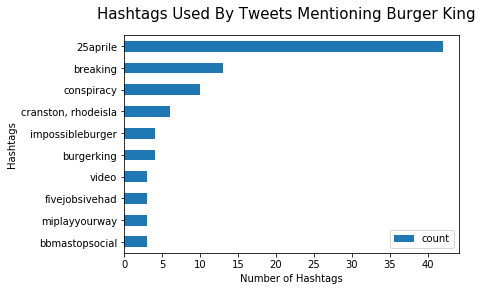

The Total Number of Hashtags:
count    172
dtype: int64



In [548]:
# find out the popular hashtags used

bk_mention_hashtags = df_mention_bk['hashtags'].value_counts().reset_index()
bk_mention_hashtags = bk_mention_hashtags.rename(columns={'index': 'hashtags', 'hashtags': 'count'})
bk_mention_hashtags = bk_mention_hashtags.drop(bk_mention_hashtags.index[[0]])
bk_mention_hashtags = bk_mention_hashtags.set_index('hashtags')
ax = bk_mention_hashtags.head(10).sort_values('count', ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("Hashtags Used By Tweets Mentioning Burger King", fontsize=15)
plt.ylabel("Hashtags")
plt.xlabel("Number of Hashtags")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Hashtags Used By Tweets Mentioning Burger King.png", bbox_inches='tight')

# find out how many hashtags used on their tweets

print('The Total Number of Hashtags:')
print(bk_mention_hashtags.sum())
print()

### Mentions Metrics

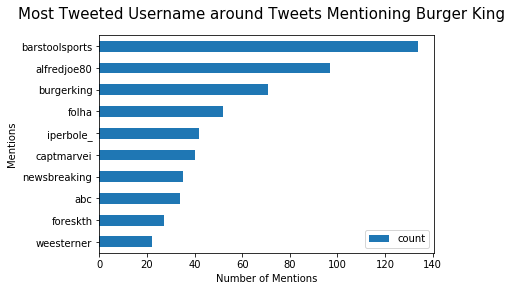

In [549]:
# find out who is the most mentioned 

mention_bk_most = df_mention_bk['mentions'].value_counts().reset_index()
mention_bk_most = mention_bk_most.rename(columns={'index': 'mentions', 'mentions': 'count'})
mention_bk_most['mentions'].replace('', np.nan, inplace=True)
mention_bk_most = mention_bk_most.dropna()
mention_bk_most = mention_bk_most.set_index('mentions')
ax = mention_bk_most.head(10).sort_values('count',ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("Most Tweeted Username around Tweets Mentioning Burger King", fontsize=15)
plt.ylabel("Mentions")
plt.xlabel("Number of Mentions")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Most Tweeted Username around Tweets Mentioning Burger King.png", bbox_inches='tight')


**The most mentioned user around tweets mentioning Burger King is barstoolsports.**

**The Tweets to barstoolsports.**

In [550]:
# select the tweets only for barstoolsports

most_mention_barstoolsports = df_mention_bk.loc[df_mention_bk['mentions']=='barstoolsports']
most_mention_barstoolsports = most_mention_barstoolsports[['screen_name', 'tweet', 'mentions']]
print (most_mention_barstoolsports.nunique())
print()
print(most_mention_barstoolsports['tweet'].head(1))

screen_name    134
tweet          1  
mentions       1  
dtype: int64

729    rt @barstoolsports: and people thought burger king didn’t flame grill their burgers https://t.co/8nhjtc8o6g
Name: tweet, dtype: object


**It appears that people have been retweeting one same tweet by barstoolsports. The tweet appears to be a video with car being burned and exploded in front of a Burger King shop.**

**Here is the picture everyone has been retweeting:**

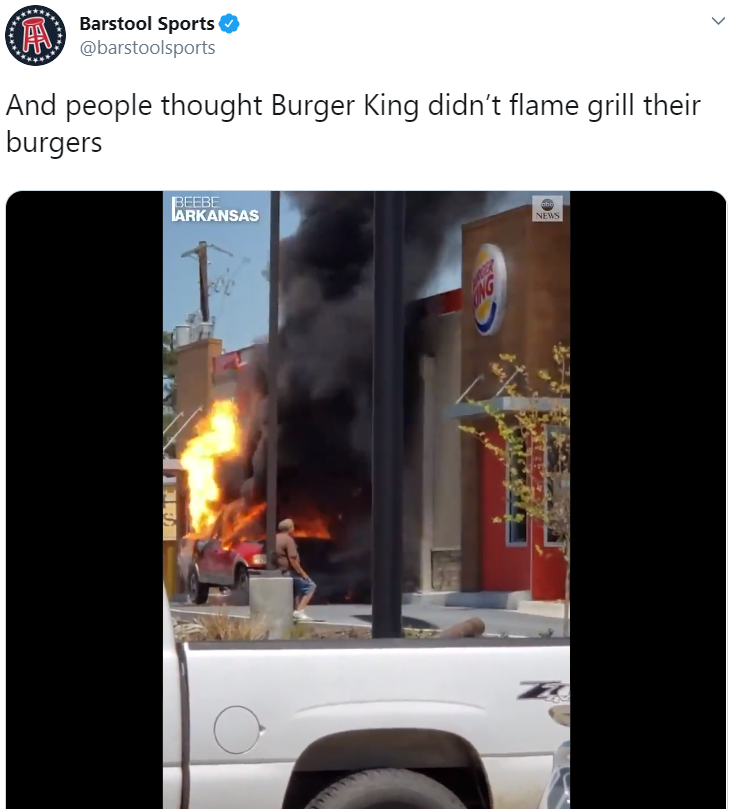

In [551]:
# load the image

Image("images/burgerking_burnedcar.png")

### Popular Words from Tweets Mentioning Burger King

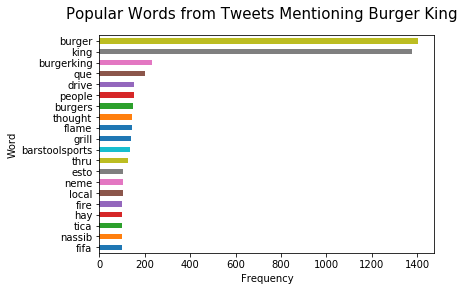

In [552]:
# find out the most popular words 

ax = df_mention_bk.cleaned.str.split(expand=True).stack().value_counts().head(20)
ax = ax.sort_values(ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("Popular Words from Tweets Mentioning Burger King", fontsize=15)
plt.ylabel("Word")
plt.xlabel("Frequency")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Popular Words from Tweets Mentioning Burger King.png", bbox_inches='tight')


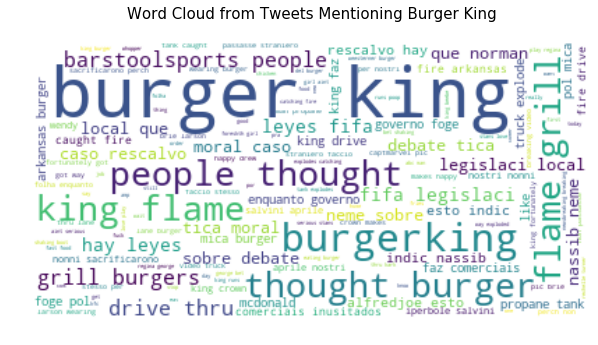

In [553]:
# word cloud 

from nltk.corpus import stopwords
stopwords = set(stopwords.words("english"))

wordcloud = WordCloud(background_color="white",
                      max_font_size=50, relative_scaling=.5, 
                      random_state=1, stopwords=stopwords).generate(' '.join(df_mention_bk['cleaned']))
plt.figure(figsize=(10,10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud from Tweets Mentioning Burger King\n", fontsize=15)
plt.savefig("images/Word Cloud from Tweets Mentioning Burger King.png")

### Popular Bigrams

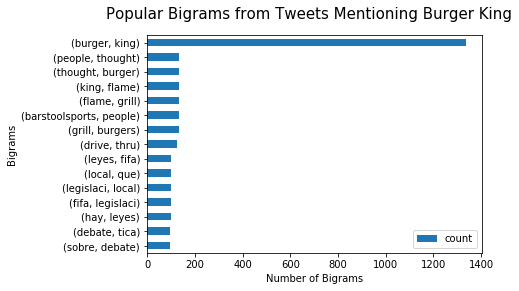

In [554]:
# popular bigrams

bk_bgs = df_mention_bk['cleaned'].values.tolist()
bk_bgs = str(bk_bgs)
bk_bgs = re.sub("[^a-zA-Z0-9]", " ", str(bk_bgs))
bk_bgs = word_tokenize(bk_bgs)
bk_bgs = nltk.bigrams(bk_bgs)
bk_bgs = nltk.FreqDist(bk_bgs)
bk_bgs = pd.DataFrame.from_dict(bk_bgs, orient='index').reset_index()
bk_bgs = bk_bgs.rename(columns={'index':'bigram', 0:'count'})
bk_bgs = bk_bgs.set_index('bigram')
ax = bk_bgs.sort_values('count', ascending=False).head(15)
ax = ax.sort_values('count', ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("Popular Bigrams from Tweets Mentioning Burger King", fontsize=15)
plt.ylabel("Bigrams")
plt.xlabel("Number of Bigrams")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Popular Bigrams from Tweets Mentioning Burger King.png", bbox_inches='tight')


## Burger King Tweets Descriptive and Content Analytics

### Total Original Tweets and Retweets

Total Number of Original Tweets and Retweets(True is Retweets and False is Original Tweets)
False    3226
True     2   
Name: retweet, dtype: int64



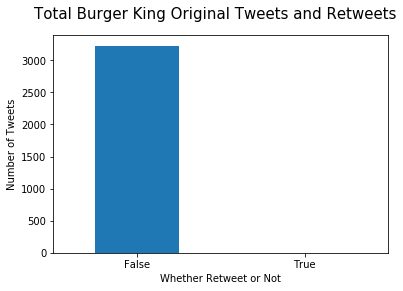

In [555]:
# find out how many tweets and retweets there are

print ('Total Number of Original Tweets and Retweets(True is Retweets and False is Original Tweets)')
print (df_bk['retweet'].value_counts())
print()
# plot the total tweets

ax = df_bk['retweet'].value_counts().plot(kind='bar')
plt.xticks(rotation=0)
plt.suptitle("Total Burger King Original Tweets and Retweets", fontsize=15)
plt.xlabel("Whether Retweet or Not")
plt.ylabel("Number of Tweets")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Total Burger King Original Tweets and Retweets.png", bbox_inches='tight')


**There are 2 retweets and 3226 original tweets from Burger King Twitter account, which has 3228 tweets in total**

### Hashtags Metrics

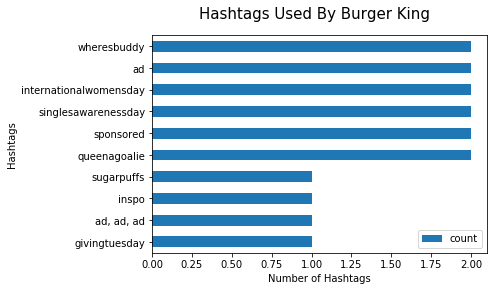

The Total Number of Hashtags:
count    33
dtype: int64



In [556]:
# find out the popular hashtags used

bk_hashtags = df_bk['hashtags'].value_counts().reset_index()
bk_hashtags = bk_hashtags.rename(columns={'index': 'hashtags', 'hashtags': 'count'})
bk_hashtags = bk_hashtags.drop(bk_hashtags.index[[0]])
bk_hashtags = bk_hashtags.set_index('hashtags')
ax = bk_hashtags.sort_values('count',ascending=False).head(10)
ax = ax.sort_values('count',ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("Hashtags Used By Burger King", fontsize=15)
plt.ylabel("Hashtags")
plt.xlabel("Number of Hashtags")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Hashtags Used By Burger King.png", bbox_inches='tight')

# find out how many hashtags mcdonalds used on their tweets

print('The Total Number of Hashtags:')
print(bk_hashtags.sum())
print()

### Mentions Metrics

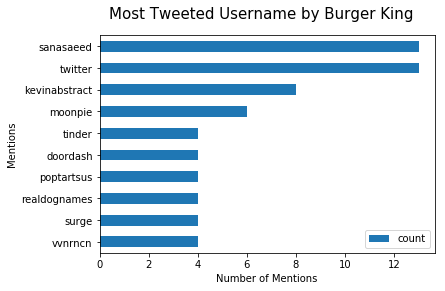

In [557]:
# find out who is the most mentioned by mcdonalds

bk_most_mention = df_bk['mentions'].value_counts().reset_index()
bk_most_mention = bk_most_mention.rename(columns={'index': 'mentions', 'mentions': 'count'})
bk_most_mention['mentions'].replace('', np.nan, inplace=True)
bk_most_mention = bk_most_mention.dropna()
bk_most_mention = bk_most_mention.set_index('mentions')
ax = bk_most_mention.head(10)
ax = ax.sort_values('count', ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("Most Tweeted Username by Burger King", fontsize=15)
plt.ylabel("Mentions")
plt.xlabel("Number of Mentions")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Most Tweeted Username by Burger King.png", bbox_inches='tight')


**The most mentioned user by Burger King is sanasaeed.**

**Burger King tweets to sanasaeed**

In [558]:
# select the tweets only for gokelian

most_mention = df_bk.loc[df_bk['mentions']=='sanasaeed']
most_mention = most_mention[['screen_name', 'tweet', 'mentions']]
most_mention

,screen_name,tweet,mentions
58,BurgerKing,@sanasaeed you’ll have to speak with a certain competitor about that,sanasaeed
62,BurgerKing,"@sanasaeed sry for the delay, had to collect myself\n\ngood vibes",sanasaeed
65,BurgerKing,@sanasaeed i can send vibes,sanasaeed
68,BurgerKing,@sanasaeed expressing myself,sanasaeed
1469,BurgerKing,@sanasaeed your treat?,sanasaeed
1470,BurgerKing,@sanasaeed 🙃,sanasaeed
1647,BurgerKing,@sanasaeed happens to the best of us,sanasaeed
1656,BurgerKing,@sanasaeed we all break in feb,sanasaeed
2164,BurgerKing,@sanasaeed guess so.,sanasaeed
2493,BurgerKing,@sanasaeed 😇: just do it everyone breaks them\n👿: it's literally only january 8th...,sanasaeed


**It appears that Burger King has been replying back to sanasaeed for a few jokes.**

### Popular Words Used by Burger King on Their Tweets

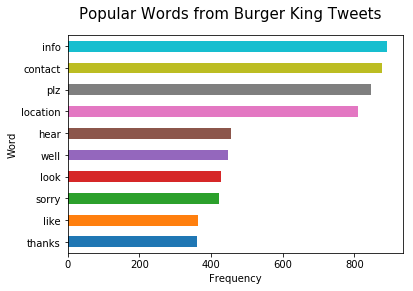

In [559]:
# find out the most popular words from company's tweets

ax = df_bk.cleaned.str.split(expand=True).stack().value_counts().head(10)
ax = ax.sort_values(ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("Popular Words from Burger King Tweets", fontsize=15)
plt.ylabel("Word")
plt.xlabel("Frequency")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Popular Words from Burger King Tweets.png", bbox_inches='tight')


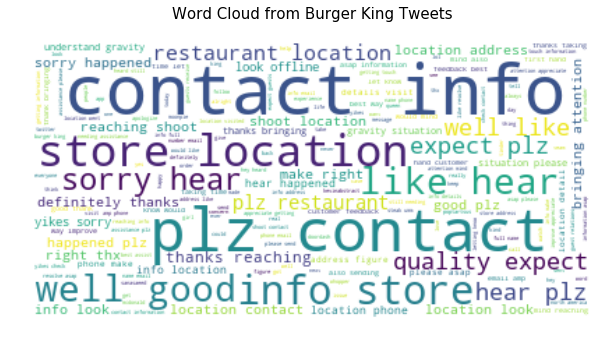

In [560]:
# word cloud of tweets

from nltk.corpus import stopwords
stopwords = stopwords.words('english')

wordcloud = WordCloud(background_color="white",
                      max_font_size=50, relative_scaling=.5, 
                      random_state=1, stopwords=stopwords).generate(' '.join(df_bk['cleaned']))
plt.figure(figsize=(10,10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud from Burger King Tweets\n", fontsize=15)
plt.savefig("images/Word Cloud from Burger King Tweets.png")

### Popular Bigrams 

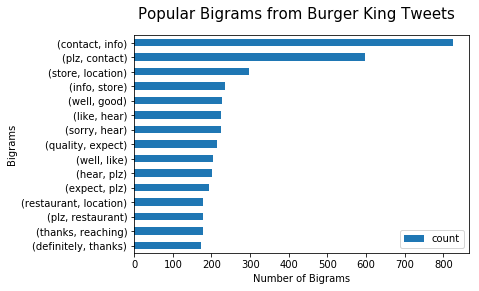

In [561]:
# popular bigrams

bk_bgs = df_bk['cleaned'].values.tolist()
bk_bgs = str(bk_bgs)
bk_bgs = re.sub("[^a-zA-Z0-9]", " ", str(bk_bgs))
bk_bgs = word_tokenize(bk_bgs)
bk_bgs = nltk.bigrams(bk_bgs)
bk_bgs = nltk.FreqDist(bk_bgs)
bk_bgs = pd.DataFrame.from_dict(bk_bgs, orient='index').reset_index()
bk_bgs = bk_bgs.rename(columns={'index':'bigram', 0:'count'})
bk_bgs = bk_bgs.set_index('bigram')
ax = bk_bgs.sort_values('count', ascending=False).head(15)
ax = ax.sort_values('count',ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("Popular Bigrams from Burger King Tweets", fontsize=15)
plt.ylabel("Bigrams")
plt.xlabel("Number of Bigrams")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Popular Bigrams from Burger King Tweets.png", bbox_inches='tight')


### Tweet Metrics

In [562]:
# time series analysis

df_bk1 = df_bk
df_bk1['time'] = pd.to_datetime(df_bk1['created_at'])
bk_time = df_bk1.set_index(['time'])
bk_time.head(2)

,screen_name,id,created_at,tweet,retweet,hashtags,mentions,hashtag_count,mention_count,cleaned,sentiment
time,,,,,,,,,,,
2019-04-26 18:05:00,BurgerKing,1121837596173271042,2019-04-26 18:05:00,"@charmaineoon_ thanks for bringing this to our attention, char. do you mind reaching out over dm with more info on… https://t.co/64didpqysh",False,,charmaineoon_,0,1,charmaineoon thanks bringing attention char mind reaching info,0.5719
2019-04-26 16:52:42,BurgerKing,1121819400598884352,2019-04-26 16:52:42,@cynderply365 same girl same,False,,cynderply365,0,1,cynderply girl,0.0000


In [563]:
# create function to count number of tweets 

def f(x):
     return pd.Series(dict(number_of_tweets = x['tweet'].count(), 
                        ))

In [564]:
# time series by month 

bk_month = bk_time.groupby(bk_time.index.month).apply(f)
bk_month

,number_of_tweets
time,
1,642
2,729
3,722
4,546
9,185
10,139
11,175
12,90


**It appears that all the Burger King tweets I collected is only from every month except May, June, August.**

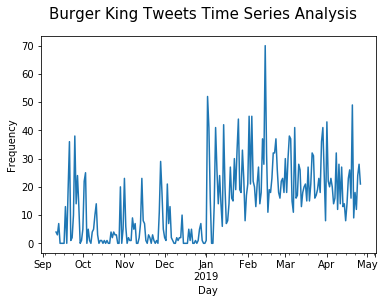

In [565]:
# time series by day

bk_day = bk_time.resample('D').size()
ax = bk_day.plot()
plt.suptitle("Burger King Tweets Time Series Analysis", fontsize=15)
plt.xlabel("Day")
plt.ylabel("Frequency")
plt.show()
fig = ax.get_figure()
fig.savefig('images/Burger King Tweets Time Series Analysis.png', bbox_inches='tight')


In [566]:
# find the most tweets per day

bk_day = bk_day.reset_index()
bk_day = bk_day.rename(columns={0: 'count', 'time': 'date'})
bk_day.sort_values('count', ascending=False).head()


,date,count
156,2019-02-14,70
113,2019-01-02,52
221,2019-04-20,49
146,2019-02-04,45
144,2019-02-02,45


**It appears that Burger King tweeted the most on February 14 with 70 tweets.**

### Drill-down: February 14 Tweet Metrics

In [567]:
# select and analyze feb 14 tweets

bk_feb = bk_time['2019-02-14']
print(bk_feb.groupby(bk_feb['sentiment'].apply(lambda x: 'negative' if x < 0 else 'positive' if x > 0 else 'neutral'))['sentiment'].count())
print('')

# average sentiment for feb tweets

print('The average sentiment for February 14 tweets:')
print(bk_feb['sentiment'].mean())

sentiment
negative    9 
neutral     41
positive    20
Name: sentiment, dtype: int64

The average sentiment for February 14 tweets:
0.07495714285714286


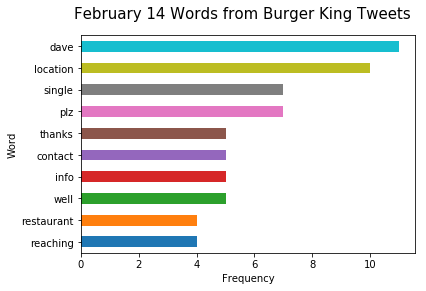

In [568]:
# popular words for feb tweets

ax = bk_feb.cleaned.str.split(expand=True).stack().value_counts().head(10)
ax = ax.sort_values(ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("February 14 Words from Burger King Tweets", fontsize=15)
plt.ylabel("Word")
plt.xlabel("Frequency")
plt.show()
fig = ax.get_figure()
fig.savefig("images/February 14 Words from Burger King Tweets.png", bbox_inches='tight')


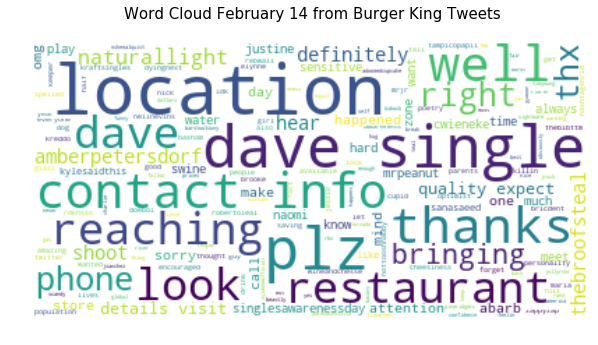

In [569]:
# word cloud of feb tweets

wordcloud = WordCloud(background_color="white",
                      max_font_size=50, relative_scaling=.5, 
                      random_state=1, stopwords=stopwords).generate(' '.join(bk_feb['cleaned']))
plt.figure(figsize=(10,10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud February 14 from Burger King Tweets\n", fontsize=15)
plt.savefig("images/Word Cloud February 14 from Burger King Tweets.png")

## Tweets Mentioning Burger King Sentiment Analysis

sentiment
negative    432 
neutral     1189
positive    440 
Name: sentiment, dtype: int64

The average sentiment for Burger King tweets:
0.016291266375545867


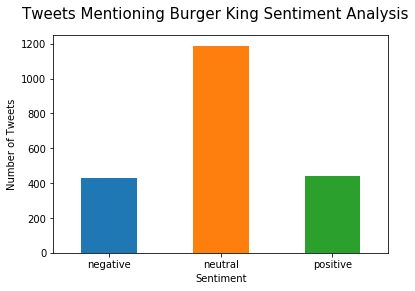

In [570]:
# positive vs. neutral vs. negative counts

print (df_mention_bk.groupby(df_mention_bk['sentiment'].apply(lambda x: 'negative' if x < 0 else 'positive' if x > 0 else 'neutral'))['sentiment'].count())
print('')

# average sentiment for all tweets

print("The average sentiment for Burger King tweets:")
print(df_mention_bk['sentiment'].mean())

# plot the sentiment classification

ax= df_mention_bk.groupby(df_mention_bk['sentiment'].apply(lambda x: 'negative' if x < 0 else 'positive' if x > 0 else 'neutral'))['sentiment'].count().plot(kind='bar')
plt.xticks(rotation=0)
plt.suptitle("Tweets Mentioning Burger King Sentiment Analysis", fontsize=15)
plt.xlabel("Sentiment")
plt.ylabel("Number of Tweets")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Tweets Mentioning Burger King Sentiment Analysis.png", bbox_inches='tight')


### Burger King Negative Tweets

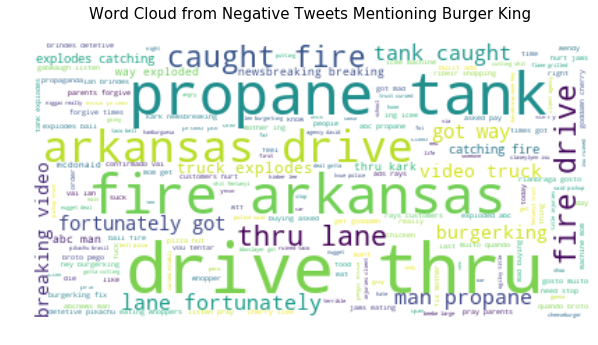

In [571]:
# word cloud negative tweets
#add stopwords

bk_neg = df_mention_bk.loc[df_mention_bk['sentiment'] < 0]

from nltk.corpus import stopwords
stopwords = set(stopwords.words("english"))
stopwords.add("burger")
stopwords.add("says")
stopwords.add("king")

wordcloud = WordCloud(background_color="white",
                      max_font_size=50, relative_scaling=.5, 
                      random_state=1, stopwords=stopwords).generate(' '.join(bk_neg['cleaned']))
plt.figure(figsize=(10,10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud from Negative Tweets Mentioning Burger King \n", fontsize=15)
plt.savefig("images/Word Cloud from Negative Tweets Mentioning Burger King.png")

### Popular Bigrams Negative Tweets

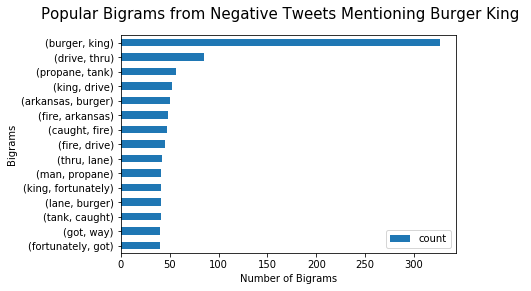

In [572]:
# popular bigrams

bk_bgs = bk_neg['cleaned'].values.tolist()
bk_bgs = str(bk_bgs)
bk_bgs = re.sub("[^a-zA-Z0-9]", " ", str(bk_bgs))
bk_bgs = word_tokenize(bk_bgs)
bk_bgs = nltk.bigrams(bk_bgs)
bk_bgs = nltk.FreqDist(bk_bgs)
bk_bgs = pd.DataFrame.from_dict(bk_bgs, orient='index').reset_index()
bk_bgs = bk_bgs.rename(columns={'index':'bigram', 0:'count'})
bk_bgs = bk_bgs.set_index('bigram')
ax = bk_bgs.sort_values('count', ascending=False).head(15)
ax = ax.sort_values('count', ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("Popular Bigrams from Negative Tweets Mentioning Burger King ", fontsize=15)
plt.ylabel("Bigrams")
plt.xlabel("Number of Bigrams")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Popular Bigrams from Negative Tweets Mentioning Burger King.png", bbox_inches='tight')


### Burger King Positive Tweets

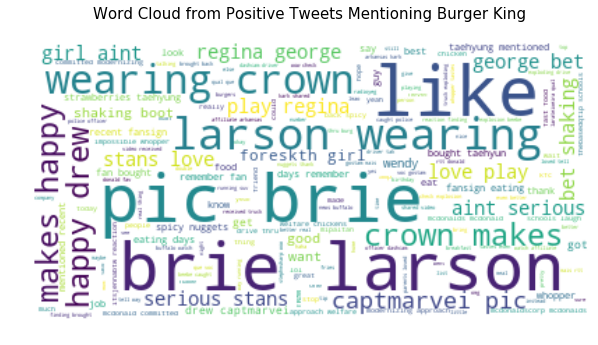

In [573]:
# word cloud positive tweets
# add stopwords

bk_pos = df_mention_bk.loc[df_mention_bk['sentiment'] > 0]

from nltk.corpus import stopwords
stopwords = set(stopwords.words("english"))
stopwords.add("burger")
stopwords.add("king")
stopwords.add("burgerking")

wordcloud = WordCloud(background_color="white",
                      max_font_size=50, relative_scaling=.5, 
                      random_state=1, stopwords=stopwords).generate(' '.join(bk_pos['cleaned']))
plt.figure(figsize=(10,10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud from Positive Tweets Mentioning Burger King \n", fontsize=15)
plt.savefig("images/Word Cloud from Positive Tweets Mentioning Burger King.png")

### Popular Bigrams Positive Tweets 

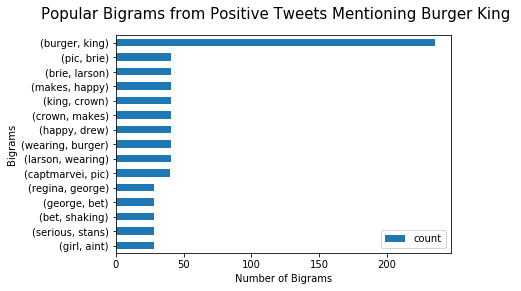

In [574]:
# popular bigrams
from nltk.corpus import stopwords

bk_bgs = bk_pos['cleaned'].values.tolist()
bk_bgs = str(bk_bgs)
bk_bgs = re.sub("[^a-zA-Z0-9]", " ", str(bk_bgs))
bk_bgs = word_tokenize(bk_bgs)
more_stopwords = set(('model', 'dimitri', 'wanna', 'aarp', 'really', 
                      'mcdonald', 'mcdonalds', 'hair', 'look',
                      'like', 'bmarchant', 'makes', 'flamingopunch', 'ask', 'wan', 'na', 'amp'))
#extra_stoplist = set(stopwords.words('english')) | more_stopwords
#bk_bgs = (word for word in bk_bgs if word not in extra_stoplist)
bk_bgs = nltk.bigrams(bk_bgs)
bk_bgs = nltk.FreqDist(bk_bgs)
bk_bgs = pd.DataFrame.from_dict(bk_bgs, orient='index').reset_index()
bk_bgs = bk_bgs.rename(columns={'index':'bigram', 0:'count'})
bk_bgs = bk_bgs.set_index('bigram')
ax = bk_bgs.sort_values('count', ascending=False).head(15)
ax = ax.sort_values('count', ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("Popular Bigrams from Positive Tweets Mentioning Burger King ", fontsize=15)
plt.ylabel("Bigrams")
plt.xlabel("Number of Bigrams")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Popular Bigrams from Positive Tweets Mentioning Burger King.png", bbox_inches='tight')


## Burger King Tweets Sentiment Analysis

sentiment
negative    488 
neutral     1181
positive    1559
Name: sentiment, dtype: int64

The average sentiment for Burger King tweets:
0.17634922552664253


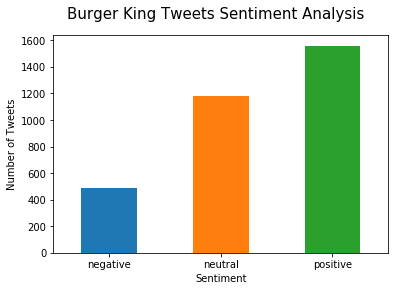

In [575]:
# positive vs. neutral vs. negative counts

print (df_bk.groupby(df_bk['sentiment'].apply(lambda x: 'negative' if x < 0 else 'positive' if x > 0 else 'neutral'))['sentiment'].count())
print('')

# average sentiment for all tweets

print("The average sentiment for Burger King tweets:")
print(df_bk['sentiment'].mean())

# plot the sentiment classification

ax= df_bk.groupby(df_bk['sentiment'].apply(lambda x: 'negative' if x < 0 else 'positive' if x > 0 else 'neutral'))['sentiment'].count().plot(kind='bar')
plt.xticks(rotation=0)
plt.suptitle("Burger King Tweets Sentiment Analysis", fontsize=15)
plt.xlabel("Sentiment")
plt.ylabel("Number of Tweets")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Burger King Tweets Sentiment Analysis.png", bbox_inches='tight')


### Burger King Negative Tweets

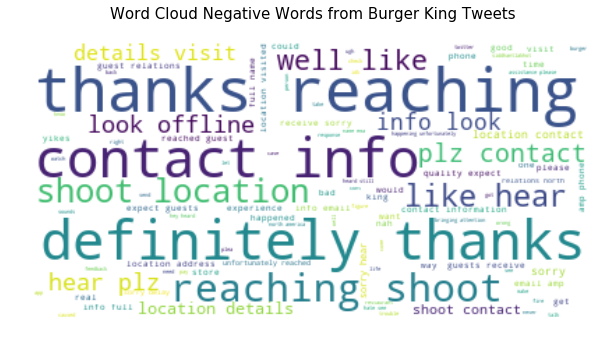

In [576]:
# word cloud of negative tweets

bk_neg = df_bk.loc[df_bk['sentiment'] < 0]

from nltk.corpus import stopwords
stopwords = set(stopwords.words("english"))

wordcloud = WordCloud(background_color="white",
                      max_font_size=50, relative_scaling=.5, 
                      random_state=1, stopwords=stopwords).generate(' '.join(bk_neg['cleaned']))
plt.figure(figsize=(10,10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud Negative Words from Burger King Tweets\n", fontsize=15)
plt.savefig("images/Word Cloud Negative Words from Burger King Tweets.png")

### Popular Bigrams Negative Tweets

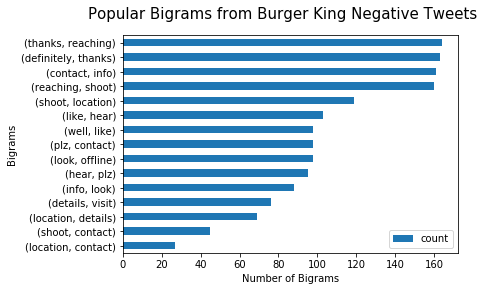

In [577]:
# popular bigrams

bk_bgs = bk_neg['cleaned'].values.tolist()
bk_bgs = str(bk_bgs)
bk_bgs = re.sub("[^a-zA-Z0-9]", " ", str(bk_bgs))
bk_bgs = word_tokenize(bk_bgs)
bk_bgs = nltk.bigrams(bk_bgs)
bk_bgs = nltk.FreqDist(bk_bgs)
bk_bgs = pd.DataFrame.from_dict(bk_bgs, orient='index').reset_index()
bk_bgs = bk_bgs.rename(columns={'index':'bigram', 0:'count'})
bk_bgs = bk_bgs.set_index('bigram')
ax = bk_bgs.sort_values('count', ascending=False).head(15)
ax = ax.sort_values('count', ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("Popular Bigrams from Burger King Negative Tweets ", fontsize=15)
plt.ylabel("Bigrams")
plt.xlabel("Number of Bigrams")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Popular Bigrams from Burger King Negative Tweets.png", bbox_inches='tight')


### Burger King Positive Tweets

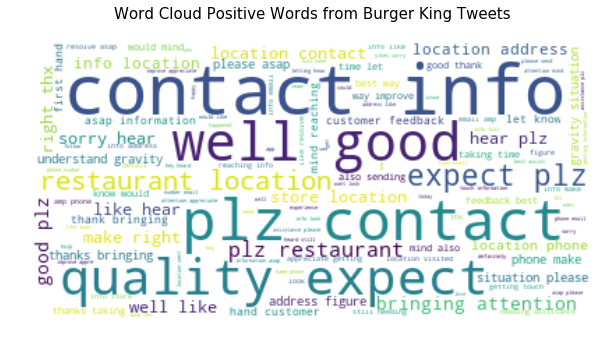

In [578]:
# word cloud of positive tweets

bk_pos = df_bk.loc[df_bk['sentiment'] > 0]

wordcloud = WordCloud(background_color="white",
                      max_font_size=50, relative_scaling=.5, 
                      random_state=1, stopwords=stopwords).generate(' '.join(bk_pos['cleaned']))
plt.figure(figsize=(10,10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud Positive Words from Burger King Tweets\n", fontsize=15)
plt.savefig("images/Word Cloud Positive Words from Burger King Tweets.png")

### Popular Bigrams Positive Tweets

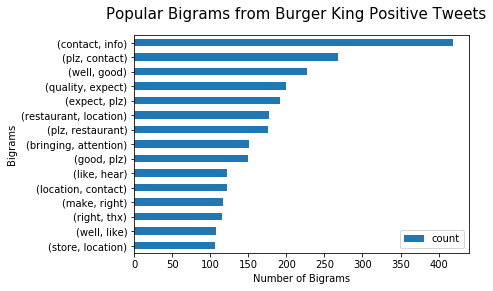

In [579]:
# popular bigrams

bk_bgs = bk_pos['cleaned'].values.tolist()
bk_bgs = str(bk_bgs)
bk_bgs = re.sub("[^a-zA-Z0-9]", " ", str(bk_bgs))
bk_bgs = word_tokenize(bk_bgs)
bk_bgs = nltk.bigrams(bk_bgs)
bk_bgs = nltk.FreqDist(bk_bgs)
bk_bgs = pd.DataFrame.from_dict(bk_bgs, orient='index').reset_index()
bk_bgs = bk_bgs.rename(columns={'index':'bigram', 0:'count'})
bk_bgs = bk_bgs.set_index('bigram')
ax = bk_bgs.sort_values('count', ascending=False).head(15)
ax = ax.sort_values('count', ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("Popular Bigrams from Burger King Positive Tweets", fontsize=15)
plt.ylabel("Bigrams")
plt.xlabel("Number of Bigrams")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Popular Bigrams from Burger King Positive Tweets.png", bbox_inches='tight')


## Topic Modeling for Tweets Mentioning Burger King

In [580]:
# select data for topic modeling and convert to list

bk_modeling = df_mention_bk['tweet']
texts = bk_modeling.values

### Data Cleaning

In [581]:
# text preprocessing
from nltk.corpus import stopwords

# Remove useless numbers and alphanumerical words
documents = [re.sub("[^a-zA-Z]+", " ", str(text)) for text in texts]

# tokenize
texts = [document.split() for document in documents]

# stemming words: having --> have; friends --> friend
wordnet_lemmatizer = WordNetLemmatizer()
texts = [[wordnet_lemmatizer.lemmatize(word) for word in tokens] for tokens in texts]

# remove common words 
stoplist = stopwords.words('english')
texts = [[word for word in tokens if word not in stoplist] for tokens in texts]

#remove short words
texts = [[word for word in tokens if len(word) >= 3] for tokens in texts]

# A list of extra stopwords 
extra_stopwords = ['http', 'temen', 'jadi', 'kasir', 'banget',
                   'mempekerjakan', 'mudahan', 'mudah', 'leyes', 'legislaci', 'norman',
                   'que', 'neme', 'esto', 'nassib', 'por', 'seu',
                   'faz', 'mica', 'pol', 'foge', 'nostril', 'non',
                  'per', 'passasse', 'straniero', 'iperbole', 'nonnie', 'aprile', 'perch', 'sacrificarono',
                   'una', 'lang', 'mit', 'einer', 'xxz', 'westerner',
                   'hkgv', 'bir', 'nce', 'capamagmoments', 'anlar', 'ndan', 'arac', 'ndeki']

extra_stoplist = extra_stopwords

# remove extra stopwords
texts = [[word for word in tokens if word not in extra_stoplist] for tokens in texts]
len(texts)
#https://github.com/alexperrier/datatalks/blob/master/debates/R/stm.R

2061

In [582]:
# save the preprocessed texts
df_texts = pd.DataFrame(texts)
df_texts.to_csv('data/mention_bk_processed_texts.csv', index=False, header=False)

# Create a dictionary representation of the documents.

dictionary = Dictionary(texts) 

len(dictionary)

5019

In [583]:
# Remove rare and common tokens.
# ignore words that appear in less than 2 documents or more than 40% documents (remove too frequent & infrequent words) - an optional step
dictionary.filter_extremes(no_below=5, no_above=0.5) #https://radimrehurek.com/gensim/corpora/dictionary.html#gensim.corpora.dictionary.Dictionary.filter_extremes
dictionary.save('data/mention_bk_texts.dict')  # store the dictionary, for future reference
len(dictionary)

575

In [584]:
# convert words to vetors or integers
corpus = [dictionary.doc2bow(text) for text in texts]
corpora.MmCorpus.serialize('data/mention_bk_texts.mm', corpus)  
len(corpus)

2061

In [585]:
print(('Number of unique tokens: %d' % len(dictionary)))
print(('Number of documents: %d' % len(corpus)))

# save dict and corpus

saved_dict = dictionary.load('data/mention_bk_texts.dict')
saved_corpus = corpora.MmCorpus('data/mention_bk_texts.mm')

Number of unique tokens: 575
Number of documents: 2061


### Determine Optimal K-value

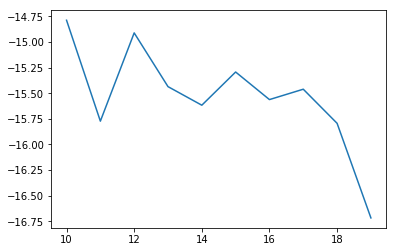

In [586]:
# load the optimal k-value result
Image("images/Optimal K-value for Tweets Mentioning Burger King LDA Model.png")

**Optimal k-value is 10 topics**

### Build topic modeling model with LDA and use optimal k-value = 10

In [587]:
# use the optimal k-value to build model (num_topics=10)

numpy.random.seed(1) # setting random seed to get the same results each time. 
model = ldamodel.LdaModel(corpus, id2word=dictionary, num_topics=10, passes=200, eval_every=1)

In [588]:
# save the best and optimal lda model
model.save('data/lda_bk_mention.model') 

In [589]:
# load the model
model = models.LdaModel.load('data/lda_bk_mention.model')

### Term-Topic Distribution

In [590]:
# let's see the topic found by the model

model.show_topics(num_topics=10)

[(0,
  '0.076*"burgerking" + 0.037*"first" + 0.034*"police" + 0.028*"get" + 0.028*"time" + 0.028*"suck" + 0.027*"took" + 0.026*"onion" + 0.016*"know" + 0.016*"one"'),
 (1,
  '0.132*"burgerking" + 0.059*"like" + 0.051*"would" + 0.050*"mcdonalds" + 0.039*"wendys" + 0.034*"today" + 0.030*"doe" + 0.029*"pero" + 0.026*"right" + 0.026*"lmao"'),
 (2,
  '0.080*"est" + 0.057*"mcdonald" + 0.042*"wendy" + 0.040*"customer" + 0.039*"mad" + 0.036*"mon" + 0.036*"take" + 0.033*"double" + 0.027*"want" + 0.022*"food"'),
 (3,
  '0.075*"folha" + 0.074*"governo" + 0.073*"comerciais" + 0.072*"inusitados" + 0.072*"enquanto" + 0.069*"yla" + 0.069*"xyzqxu" + 0.025*"arkansas" + 0.024*"explodes" + 0.023*"think"'),
 (4,
  '0.083*"local" + 0.082*"hay" + 0.081*"fifa" + 0.068*"tica" + 0.068*"moral" + 0.067*"sobre" + 0.067*"caso" + 0.067*"debate" + 0.067*"rescalvo" + 0.066*"indic"'),
 (5,
  '0.063*"nostri" + 0.046*"road" + 0.045*"sunset" + 0.044*"tuli" + 0.044*"menular" + 0.044*"keren" + 0.044*"bali" + 0.032*"arkansa

In [591]:
# print topics without probability
for i in range(0,10):
    topics = model.show_topic(i, 10)
    print(', '.join([str(word[0]) for word in topics]))

burgerking, first, police, get, time, suck, took, onion, know, one
burgerking, like, would, mcdonalds, wendys, today, doe, pero, right, lmao
est, mcdonald, wendy, customer, mad, mon, take, double, want, food
folha, governo, comerciais, inusitados, enquanto, yla, xyzqxu, arkansas, explodes, think
local, hay, fifa, tica, moral, sobre, caso, debate, rescalvo, indic
nostri, road, sunset, tuli, menular, keren, bali, arkansas, stesso, faccio
make, crown, happy, wearing, pic, larson, sumkdu, brie, drew, captmarvei
drive, thru, way, got, man, propane, fire, tank, caught, abc
people, flame, thought, grill, barstoolsports, nhjtc, twitter, believe, girl, job
day, nice, eating, poop, run, weesterner, rep, remember, fan, home


**Tweets Mentioning Burger King Topics:**
1. Burger King timing sucks
2. Burger King is like McDonald's and Wendy's today
3. McDonald's and Wendy's mad customers want food
4. Folha commercials and Arkansas fire car explodes
5. Burger King mentions in Portuegese community
6. Sunset in Bali
7. Brie Larson pictures or Captain Marvel wearing crown
8. There is fire in the drive thru
9. Barstoolsports posts 
10. Burger King mentions in Italian community

### Data Visualization with Gensim

In [592]:
# better visualization with gensim

pyLDAvis.enable_notebook()
pyLDAvis.gensim.prepare(model, corpus, dictionary, sort_topics=False)

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0      0.075947 -0.202732  1       1        11.552999
1      0.094569 -0.186464  2       1        8.245214 
2      0.003394 -0.138798  3       1        8.337515 
3      0.261045  0.097791  4       1        10.824677
4     -0.127059  0.146266  5       1        13.870464
5     -0.055965  0.241943  6       1        6.192799 
6     -0.274487 -0.016150  7       1        6.591962 
7      0.232224  0.130738  8       1        13.373272
8     -0.115057  0.076450  9       1        14.734270
9     -0.094610 -0.149044  10      1        6.276818 , topic_info=     Category        Freq            Term       Total  loglift  logprob
term                                                                   
21    Default  217.000000  burgerking      217.000000  30.0000  30.0000
225   Default  136.000000  people          136.000000  29.0000  29.0000
389   Default  115.000000  local           115.000000  28.0000  28.0000
115   Default  114.000000  hay             114.000000  27.0000  27.0000
448   Default  113.000000  fifa            113.000000  26.0000  26.0000
22    Default  111.000000  flame           111.000000  25.0000  25.0000
435   Default  110.000000  thought         110.000000  24.0000  24.0000
175   Default  106.000000  grill           106.000000  23.0000  23.0000
433   Default  103.000000  barstoolsports  103.000000  22.0000  22.0000
434   Default  103.000000  nhjtc           103.000000  21.0000  21.0000
442   Default  94.000000   moral           94.000000   20.0000  20.0000
443   Default  94.000000   tica            94.000000   19.0000  19.0000
451   Default  93.000000   sobre           93.000000   18.0000  18.0000
446   Default  93.000000   caso            93.000000   17.0000  17.0000
447   Default  93.000000   debate          93.000000   16.0000  16.0000
450   Default  93.000000   rescalvo        93.000000   15.0000  15.0000
445   Default  92.000000   alfredjoe       92.000000   14.0000  14.0000
449   Default  92.000000   indic           92.000000   13.0000  13.0000
534   Default  80.000000   governo         80.000000   12.0000  12.0000
532   Default  79.000000   comerciais      79.000000   11.0000  11.0000
12    Default  114.000000  drive           114.000000  10.0000  10.0000
536   Default  100.000000  folha           100.000000  9.0000   9.0000 
535   Default  79.000000   inusitados      79.000000   8.0000   8.0000 
533   Default  79.000000   enquanto        79.000000   7.0000   7.0000 
35    Default  67.000000   est             67.000000   6.0000   6.0000 
541   Default  75.000000   yla             75.000000   5.0000   5.0000 
540   Default  75.000000   xyzqxu          75.000000   4.0000   4.0000 
157   Default  58.000000   make            58.000000   3.0000   3.0000 
193   Default  57.000000   crown           57.000000   2.0000   2.0000 
347   Default  56.000000   happy           56.000000   1.0000   1.0000 
...       ...        ...     ...                 ...      ...      ... 
197   Topic10  16.774645   home            17.710356   2.7140  -3.6213 
485   Topic10  16.421707   strawberry      17.357409   2.7129  -3.6425 
482   Topic10  16.421701   bought          17.357403   2.7129  -3.6425 
288   Topic10  16.421658   park            17.357365   2.7129  -3.6425 
146   Topic10  16.421570   could           17.357313   2.7129  -3.6425 
101   Topic10  16.068670   pikachu         17.004377   2.7117  -3.6643 
486   Topic10  15.715709   taehyun         16.651407   2.7105  -3.6865 
484   Topic10  15.715709   recent          16.651407   2.7105  -3.6865 
483   Topic10  15.715709   mentioned       16.651407   2.7105  -3.6865 
269   Topic10  15.362646   brasil          16.298361   2.7092  -3.7092 
36    Topic10  15.362648   tweet           16.298363   2.7092  -3.7092 
272   Topic10  15.009663   detetive        15.945371   2.7078  -3.7324 
270   Topic10  15.009663   brindes         15.945372   2.7078  -3.732

## Topic Modeling for Burger King Tweets

In [593]:
# select data for topic modeling and convert to list

bk_modeling = df_bk['tweet']
texts = bk_modeling.values

### Data Cleaning

In [594]:
# text preprocessing
from nltk.corpus import stopwords

# Remove useless numbers and alphanumerical words
documents = [re.sub("[^a-zA-Z]+", " ", str(text)) for text in texts]

# tokenize
texts = [document.split() for document in documents]

# stemming words: having --> have; friends --> friend
wordnet_lemmatizer = WordNetLemmatizer()
texts = [[wordnet_lemmatizer.lemmatize(word) for word in tokens] for tokens in texts]

# remove common words 
stoplist = stopwords.words('english')
texts = [[word for word in tokens if word not in stoplist] for tokens in texts]

#remove short words
texts = [[word for word in tokens if len(word) >= 3] for tokens in texts]

# A list of extra stopwords 
extra_stopwords = ['http']

extra_stoplist = extra_stopwords

# remove extra stopwords
texts = [[word for word in tokens if word not in extra_stoplist] for tokens in texts]
len(texts)
#https://github.com/alexperrier/datatalks/blob/master/debates/R/stm.R

3228

In [595]:
# save the preprocessed texts
df_texts = pd.DataFrame(texts)
df_texts.to_csv('data/bk_processed_texts.csv', index=False, header=False)

# Create a dictionary representation of the documents.

dictionary = Dictionary(texts) 

len(dictionary)

6229

In [596]:
# Remove rare and common tokens.
# ignore words that appear in less than 2 documents or more than 40% documents (remove too frequent & infrequent words) - an optional step
dictionary.filter_extremes(no_below=5, no_above=0.5) #https://radimrehurek.com/gensim/corpora/dictionary.html#gensim.corpora.dictionary.Dictionary.filter_extremes
dictionary.save('data/bk_texts.dict')  # store the dictionary, for future reference
len(dictionary)

301

In [597]:
# convert words to vetors or integers
corpus = [dictionary.doc2bow(text) for text in texts]
corpora.MmCorpus.serialize('data/bk_texts.mm', corpus)  
len(corpus)

3228

In [598]:
print(('Number of unique tokens: %d' % len(dictionary)))
print(('Number of documents: %d' % len(corpus)))

# save dict and corpus

saved_dict = dictionary.load('data/bk_texts.dict')
saved_corpus = corpora.MmCorpus('data/bk_texts.mm')

Number of unique tokens: 301
Number of documents: 3228


### Determine Optimal K-value

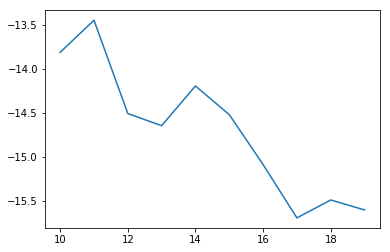

In [599]:
# load the optimal k-value result
Image("images/Optimal K-value for Burger King LDA Model.png")

**Optimal k-value is 11 topics**

### Build topic modeling model with LDA and use optimal k-value = 11

In [600]:
# use the optimal k-value to build model (num_topics=11)

numpy.random.seed(1) # setting random seed to get the same results each time. 
model = ldamodel.LdaModel(corpus, id2word=dictionary, num_topics=11, passes=200, eval_every=1)

In [601]:
# save the best and optimal lda model
model.save('data/lda_bk.model') 

In [602]:
# load the model
model = models.LdaModel.load('data/lda_bk.model')

### Term-Topic Distribution

In [603]:
# let's see the topic found by the model

model.show_topics(num_topics=11)

[(0,
  '0.079*"please" + 0.078*"sorry" + 0.061*"hear" + 0.057*"understand" + 0.057*"situation" + 0.057*"feedback" + 0.055*"information" + 0.055*"gravity" + 0.054*"way" + 0.053*"asap"'),
 (1,
  '0.064*"one" + 0.048*"see" + 0.035*"day" + 0.033*"kevinabstract" + 0.032*"could" + 0.031*"today" + 0.029*"say" + 0.028*"never" + 0.026*"life" + 0.022*"everyone"'),
 (2,
  '0.119*"thank" + 0.084*"attention" + 0.083*"bringing" + 0.075*"appreciate" + 0.070*"getting" + 0.050*"touch" + 0.050*"information" + 0.041*"twitter" + 0.036*"asap" + 0.029*"please"'),
 (3,
  '0.125*"contact" + 0.122*"info" + 0.110*"plz" + 0.094*"location" + 0.085*"store" + 0.084*"sorry" + 0.073*"happened" + 0.056*"look" + 0.042*"yikes" + 0.039*"hear"'),
 (4,
  '0.114*"still" + 0.105*"hey" + 0.091*"assistance" + 0.073*"needing" + 0.062*"heard" + 0.060*"send" + 0.055*"please" + 0.037*"check" + 0.036*"plz" + 0.032*"assist"'),
 (5,
  '0.150*"like" + 0.089*"asap" + 0.083*"resolve" + 0.065*"location" + 0.064*"store" + 0.045*"king" + 0

In [604]:
# print topics without probability
for i in range(0,11):
    topics = model.show_topic(i, 10)
    print(', '.join([str(word[0]) for word in topics]))

please, sorry, hear, understand, situation, feedback, information, gravity, way, asap
one, see, day, kevinabstract, could, today, say, never, life, everyone
thank, attention, bringing, appreciate, getting, touch, information, twitter, asap, please
contact, info, plz, location, store, sorry, happened, look, yikes, hear
still, hey, assistance, needing, heard, send, please, check, plz, assist
like, asap, resolve, location, store, king, address, find, burger, real
expect, quality, location, plz, restaurant, thx, right, make, phone, contact
get, want, name, team, whopper, full, love, experience, order, management
thanks, reaching, definitely, shoot, location, detail, info, visit, bringing, attention
good, would, know, time, let, mind, well, sending, also, thanks
like, contact, info, well, look, hear, plz, offline, location, email


**Burger King Tweets Topics:**
1. Sorry to hear the situation
2. One day, people could see Kevin Abstract the rapper
3. Please contact the store location and sorry to hear what happened 
4. Assistance needed in the Burger King store location
5. Burger King needs to resolve asap in this store location
6. Expect some quality at this location and please allow us to make it right and contact us
7. Love whopper and order and management team and experience
8. Thank you for bringing up the attention to us 
9. Sending thanks
10. Please contact the information by email

### Data Visualization with Gensim

In [605]:
# better visualization with gensim

pyLDAvis.enable_notebook()
pyLDAvis.gensim.prepare(model, corpus, dictionary, sort_topics=False)

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0     -0.161796  0.256670  1       1        9.924547 
1     -0.254076 -0.151870  2       1        3.930285 
2     -0.202027  0.173911  3       1        5.774209 
3      0.284294  0.028990  4       1        21.755047
4      0.013439  0.044833  5       1        4.673212 
5     -0.005029  0.140401  6       1        4.796368 
6      0.247032 -0.017219  7       1        11.781035
7     -0.237033 -0.075954  8       1        4.294611 
8      0.098311 -0.102686  9       1        11.158150
9     -0.057049 -0.325281  10      1        7.183662 
10     0.273934  0.028206  11      1        14.728875, topic_info=     Category        Freq             Term       Total  loglift  logprob
term                                                                    
10    Default  364.000000  like             364.000000  30.0000  30.0000
5     Default  345.000000  thanks           345.000000  29.0000  29.0000
4     Default  250.000000  reaching         250.000000  28.0000  28.0000
20    Default  805.000000  plz              805.000000  27.0000  27.0000
33    Default  333.000000  store            333.000000  26.0000  26.0000
51    Default  419.000000  look             419.000000  25.0000  25.0000
49    Default  401.000000  sorry            401.000000  24.0000  24.0000
17    Default  211.000000  expect           211.000000  23.0000  23.0000
45    Default  423.000000  well             423.000000  22.0000  22.0000
44    Default  253.000000  good             253.000000  21.0000  21.0000
21    Default  207.000000  quality          207.000000  20.0000  20.0000
19    Default  780.000000  location         780.000000  19.0000  19.0000
23    Default  454.000000  hear             454.000000  18.0000  18.0000
30    Default  823.000000  contact          823.000000  17.0000  17.0000
22    Default  186.000000  restaurant       186.000000  16.0000  16.0000
2     Default  835.000000  info             835.000000  15.0000  15.0000
48    Default  243.000000  happened         243.000000  14.0000  14.0000
41    Default  178.000000  definitely       178.000000  13.0000  13.0000
50    Default  170.000000  thx              170.000000  12.0000  12.0000
42    Default  172.000000  shoot            172.000000  11.0000  11.0000
35    Default  179.000000  asap             179.000000  10.0000  10.0000
66    Default  146.000000  right            146.000000  9.0000   9.0000 
28    Default  106.000000  thank            106.000000  8.0000   8.0000 
101   Default  143.000000  make             143.000000  7.0000   7.0000 
0     Default  151.000000  attention        151.000000  6.0000   6.0000 
59    Default  113.000000  would            113.000000  5.0000   5.0000 
1     Default  150.000000  bringing         150.000000  4.0000   4.0000 
104   Default  112.000000  know             112.000000  3.0000   3.0000 
64    Default  203.000000  phone            203.000000  2.0000   2.0000 
32    Default  210.000000  please           210.000000  1.0000   1.0000 
...       ...         ...    ...                   ...     ...      ... 
98    Topic11  49.824768   amp              62.341217   1.6912  -3.8158 
60    Topic11  41.846397   visited          54.069515   1.6591  -3.9903 
10    Topic11  253.821136  like             364.875732  1.5524  -2.1877 
51    Topic11  230.281799  look             419.394073  1.3159  -2.2850 
45    Topic11  230.785233  well             423.158173  1.3091  -2.2828 
23    Topic11  230.133728  hear             454.569580  1.2347  -2.2856 
53    Topic11  2.606106    date             5.863648    1.1044  -6.7664 
64    Topic11  74.623131   phone            203.587494  0.9117  -3.4118 
30    Topic11  247.563370  contact          823.703186  0.7132  -2.2126 
2     Topic11  242.831192  info             835.223389  0.6800  -2.2319 
20    Topic11  225.856781  plz              805.373657  0.6440  -2.3044 
65    Topic11  10.635081   experience      

## Tweets Mentioning Burger King Network Analytics

In [606]:
# let's process the data in list (better for text processing)

tweets = df_mention_bk.values
len(tweets)

2061

In [607]:
# make screen name and tweet text to be the only screen

mention = []

for tweet in tweets:
    mention.append([tweet[2], tweet[1]])
    
mention[:5]

[['FunnyVideoXP',
  'big package – funny burger king commercial . . . https://t.co/8akks1lk3b https://t.co/ujhsctlbsf'],
 ['mikakamco',
  'tava pensando em preparar uma jantinha pra bonita e ela me fala que\ncomeu \num \nburger king https://t.co/7qjuxwwmtc'],
 ['DanielNewman',
  'rt @mappenapp: in what is apparently not an april fool’s joke, impossible foods and burger king are launching an impossible whopper https:/…'],
 ['TV424',
  'rt @mitchellmccoy: #breaking: truck explodes in drive-thru of burger king in beebe on center.  @rechelle_turner on her way (video courtesy…'],
 ['CFlabio', '@burgerking oh yes']]

In [608]:
# computationally intensive ... very slow if you have a lot of data
for i in mention[:5]:
    print(i[0], i[1])

FunnyVideoXP big package – funny burger king commercial . . . https://t.co/8akks1lk3b https://t.co/ujhsctlbsf
mikakamco tava pensando em preparar uma jantinha pra bonita e ela me fala que
comeu 
um 
burger king https://t.co/7qjuxwwmtc
DanielNewman rt @mappenapp: in what is apparently not an april fool’s joke, impossible foods and burger king are launching an impossible whopper https:/…
TV424 rt @mitchellmccoy: #breaking: truck explodes in drive-thru of burger king in beebe on center.  @rechelle_turner on her way (video courtesy…
CFlabio @burgerking oh yes


In [609]:
# select only screen name and mention name

for tweet in mention[:5]:
    a = re.findall(r"(?<=@)\w+", tweet[1])
    for i in a:
        print(tweet[0], i)

DanielNewman mappenapp
TV424 mitchellmccoy
TV424 rechelle_turner
CFlabio burgerking


In [610]:
# putting everything together and save it to csv

import csv
mention = []
for tweet in tweets:
    mention.append([tweet[2], tweet[1]])
    
openfile = open("data/mention_bk_network.csv", "w", newline='')
w = csv.writer(openfile)

for tweet in mention:
    a = re.findall(r"(?<=@)\w+", tweet[1])
    for i in a:
        w.writerow([tweet[0], i])
        
openfile.close()

### Network Visualization

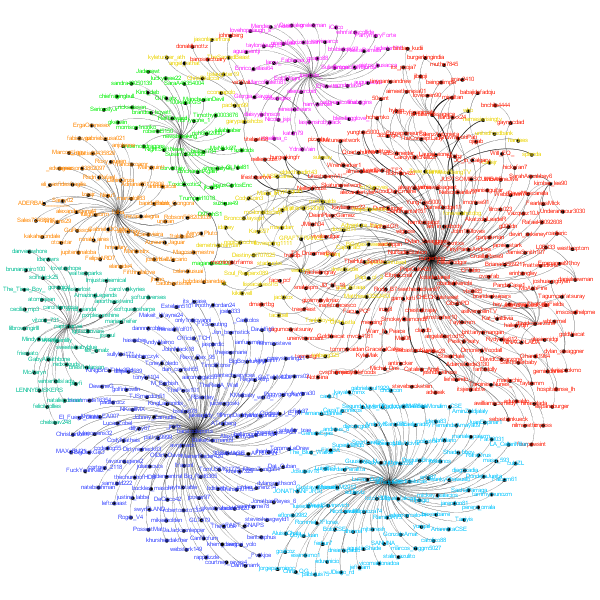

In [611]:
# load the gephi image

Image("images/Tweets Mentioning Burger King Networks.png")

**As can be seen above, tweets mentioning Burger King networks by Gephi have 8 clusters. And, the biggest cluster is red cluster.**

### The Largest Cluster from the Network

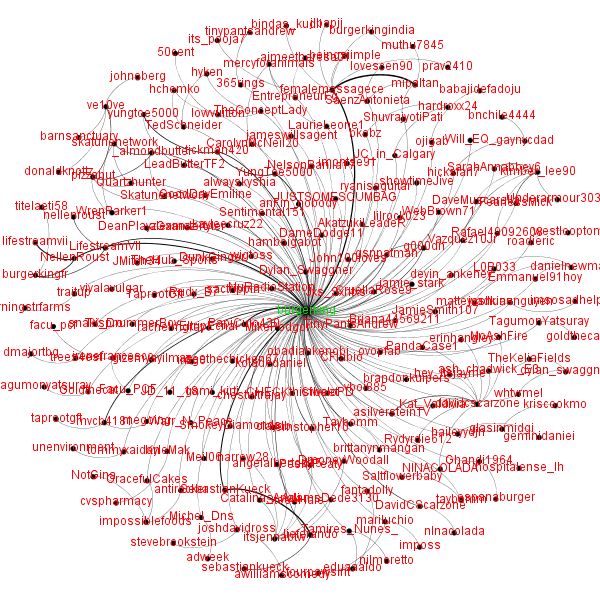

In [612]:
# load the red cluster

Image("images/Red Cluster.PNG")

**As can be seen by the network above, the biggest cluster, red cluster has a center that is Burger King.**

### Network Metrics

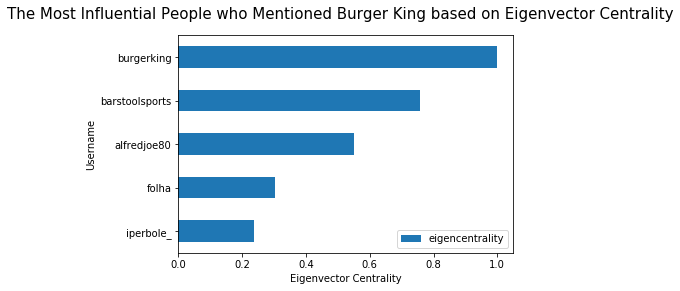

In [613]:
# load the data

mention_bk_network = pd.read_csv("Tweets mentioning Burger King networks data.csv")
mention_bk_network = mention_bk_network[['Label', 'eigencentrality']]
mention_bk_network = mention_bk_network.set_index('Label')
ax = mention_bk_network.sort_values('eigencentrality', ascending=False).head()
ax = ax.sort_values('eigencentrality', ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("The Most Influential People who Mentioned Burger King based on Eigenvector Centrality", fontsize=15)
plt.ylabel("Username")
plt.xlabel("Eigenvector Centrality")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Tweet Mentioning Burger King Network Metrics", bbox_inches='tight')

**The most influential people in terms of eigenvector centrality are burgerking, barstoolsports, alfredjoe80, folha, iperbole_.**


## Burger King Network Analytics

In [614]:
# let's process the data in list (better for text processing)

tweets = df_bk.values
len(tweets)

3228

In [615]:
# make screen name and tweet text to be the only screen

mention = []

for tweet in tweets:
    mention.append([tweet[0], tweet[3]])
    
mention[:5]

[['BurgerKing',
  '@charmaineoon_ thanks for bringing this to our attention, char. do you mind reaching out over dm with more info on… https://t.co/64didpqysh'],
 ['BurgerKing', '@cynderply365 same girl same'],
 ['BurgerKing', '@itsjennabtw awwww'],
 ['BurgerKing', '@_realamandashow hehe'],
 ['BurgerKing', '@adriennela rt']]

In [616]:
# computationally intensive ... very slow if you have a lot of data
for i in mention[:5]:
    print(i[0], i[1])

BurgerKing @charmaineoon_ thanks for bringing this to our attention, char. do you mind reaching out over dm with more info on… https://t.co/64didpqysh
BurgerKing @cynderply365 same girl same
BurgerKing @itsjennabtw awwww
BurgerKing @_realamandashow hehe
BurgerKing @adriennela rt


In [617]:
# select only screen name and mention name

for tweet in mention[:5]:
    a = re.findall(r"(?<=@)\w+", tweet[1])
    for i in a:
        print(tweet[0], i)

BurgerKing charmaineoon_
BurgerKing cynderply365
BurgerKing itsjennabtw
BurgerKing _realamandashow
BurgerKing adriennela


In [618]:
# putting everything together and save it to csv

import csv
mention = []
for tweet in tweets:
    mention.append([tweet[0], tweet[3]])
    
openfile = open("data/bk_network.csv", "w", newline='')
w = csv.writer(openfile)

for tweet in mention:
    a = re.findall(r"(?<=@)\w+", tweet[1])
    for i in a:
        w.writerow([tweet[0], i])
        
openfile.close()

### Network Visualization

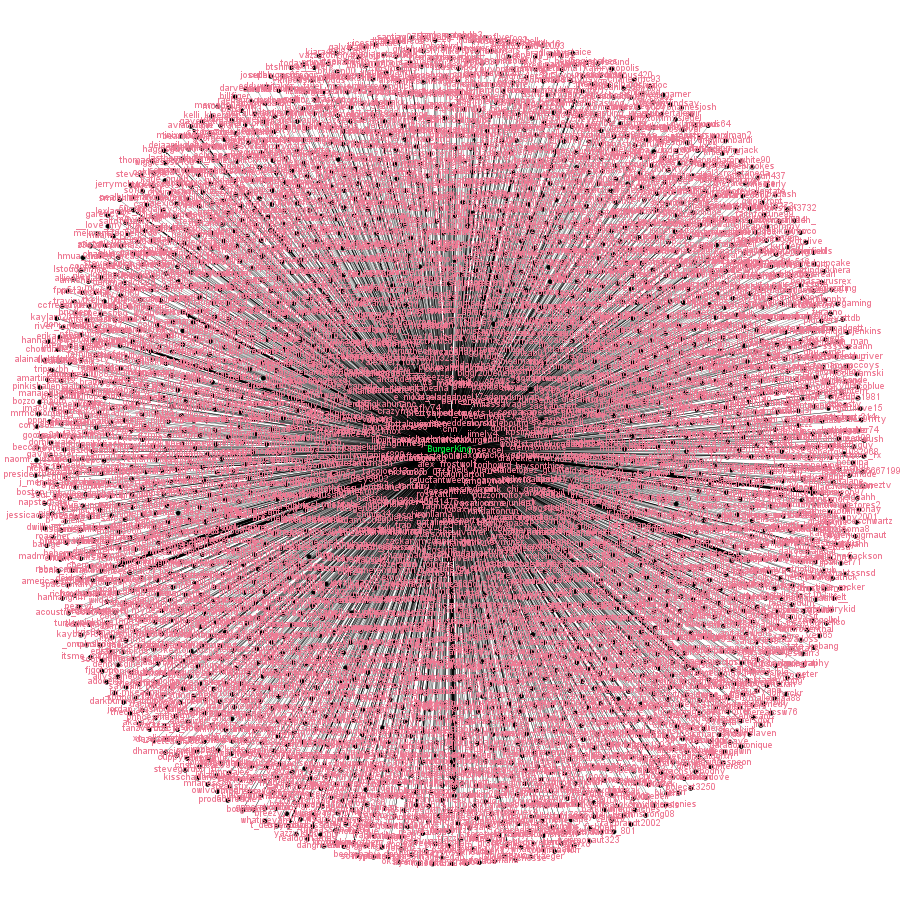

In [619]:
# load the gephi image

Image("images/Burger King Tweets Networks.PNG")

**As can be seen above, there is only one cluster in the network because this network is from Burger King's tweets and the center here is Burger King. And, the most influential person here is Burger King.**

# Chick-fil-A Twitter Analysis

**This section includes descriptive, content, sentiment, topic modeling, and network analysis for the company's tweets and the tweets mentioning the company.**

## Tweets Mentioning Chick-fil-A Descriptive and Content Analytics

### Total Original Tweets and Retweets

Total Number of Original Tweets and Retweets(False is Original Tweets and True is Retweets)
False    1133
True     905 
Name: retweet, dtype: int64

Total Tweets:
2038



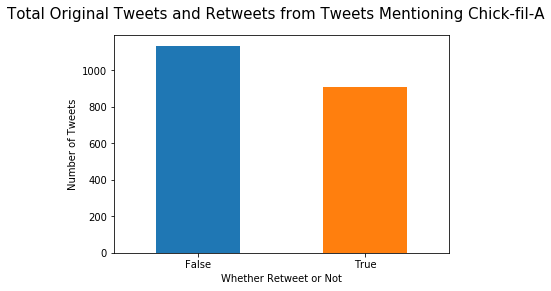

In [620]:
# find out how many tweets and retweets there are

print ('Total Number of Original Tweets and Retweets(False is Original Tweets and True is Retweets)')
print (df_mention_chick['retweet'].value_counts())
print()

# find out total tweets

print ('Total Tweets:')
print (df_mention_chick['tweet'].count())
print()

# plot the total tweets

ax = df_mention_chick['retweet'].value_counts().plot(kind='bar')
plt.xticks(rotation=0)
plt.suptitle("Total Original Tweets and Retweets from Tweets Mentioning Chick-fil-A", fontsize=15)
plt.xlabel("Whether Retweet or Not")
plt.ylabel("Number of Tweets")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Total Original Tweets and Retweets from Tweets Mentioning Chick-fil-A", bbox_inches='tight')


**There are 905 retweets and 1133 original tweets from tweets mentioning Chick-fil-A, which has 2038 tweets in total. This means that there are 2038 people mentioning Chick-fil-A from the data.**

### The Most Influential Person who Mentioned Chick-fil-A

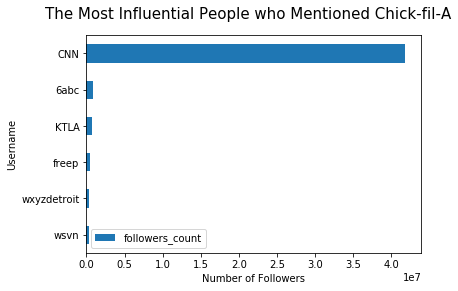

In [621]:
most_followers = df_mention_chick.groupby('screen_name')['followers_count'].sum().sort_values(ascending=False).reset_index().head(6)
most_followers = most_followers.set_index('screen_name')
ax = most_followers.sort_values('followers_count', ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("The Most Influential People who Mentioned Chick-fil-A", fontsize=15)
plt.ylabel("Username")
plt.xlabel("Number of Followers")
plt.show()
fig = ax.get_figure()
fig.savefig("images/The Most Influential People who Mentioned Chick-fil-A", bbox_inches='tight')


In [622]:
# what did the most influential person tweet?

most_influential = df_mention_chick.loc[df_mention_chick['screen_name']=='CNN']
most_influential = most_influential[['screen_name', 'tweet', 'followers_count', 'sentiment']]
most_influential

,screen_name,tweet,followers_count,sentiment
1067,CNN,chick-fil-a made a special easter sunday delivery to help a very sick boy https://t.co/zzhvtgnqko https://t.co/junw4wphdb,41814242,0.204


**It appears that the most influential username that mentioned Chick-fil-A was a giant news company, CNN, which tweeted about Chick-fil-A special easter Sunday delivery to help a very sick boy. CNN is a very influential Twitter user and has more than 41 million followers and fortunately, the sentiment of CNN tweet is positive, which is good for Chick-fil-A.**

### Hashtags Metrics

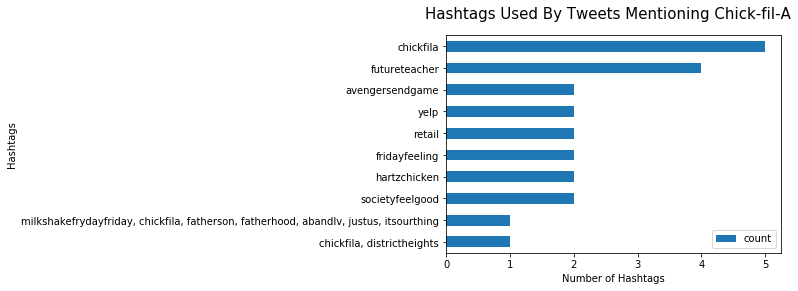

The Total Number of Hashtags:
count    75
dtype: int64



In [623]:
# find out the popular hashtags used

chick_mention_hashtags = df_mention_chick['hashtags'].value_counts().reset_index()
chick_mention_hashtags = chick_mention_hashtags.rename(columns={'index': 'hashtags', 'hashtags': 'count'})
chick_mention_hashtags = chick_mention_hashtags.drop(chick_mention_hashtags.index[[0]])
chick_mention_hashtags = chick_mention_hashtags.set_index('hashtags')
ax = chick_mention_hashtags.head(10).sort_values('count', ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("Hashtags Used By Tweets Mentioning Chick-fil-A", fontsize=15)
plt.ylabel("Hashtags")
plt.xlabel("Number of Hashtags")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Hashtags Used By Tweets Mentioning Chick-fil-A.png", bbox_inches='tight')

# find out how many hashtags used on their tweets

print('The Total Number of Hashtags:')
print(chick_mention_hashtags.sum())
print()

### Mentions Metrics

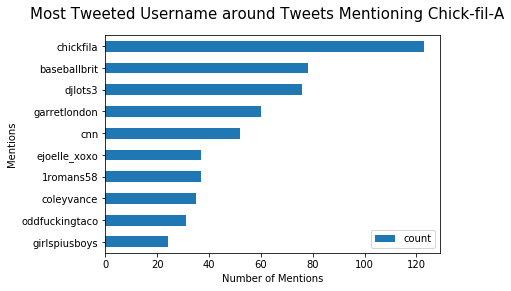

In [624]:
# find out who is the most mentioned 

mention_chick_most = df_mention_chick['mentions'].value_counts().reset_index()
mention_chick_most = mention_chick_most.rename(columns={'index': 'mentions', 'mentions': 'count'})
mention_chick_most['mentions'].replace('', np.nan, inplace=True)
mention_chick_most = mention_chick_most.dropna()
mention_chick_most = mention_chick_most.set_index('mentions')
ax = mention_chick_most.head(10).sort_values('count',ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("Most Tweeted Username around Tweets Mentioning Chick-fil-A", fontsize=15)
plt.ylabel("Mentions")
plt.xlabel("Number of Mentions")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Most Tweeted Username around Tweets Mentioning Chick-fil-A.png", bbox_inches='tight')


**The most mentioned user around tweets mentioning Chick-fil-A is Chick-fil-A itself.**

### Popular Words from Tweets Mentioning Chick-fil-A

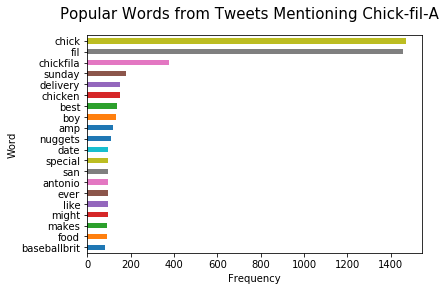

In [625]:
# find out the most popular words 

ax = df_mention_chick.cleaned.str.split(expand=True).stack().value_counts().head(20)
ax = ax.sort_values(ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("Popular Words from Tweets Mentioning Chick-fil-A", fontsize=15)
plt.ylabel("Word")
plt.xlabel("Frequency")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Popular Words from Tweets Mentioning Chick-fil-A.png", bbox_inches='tight')


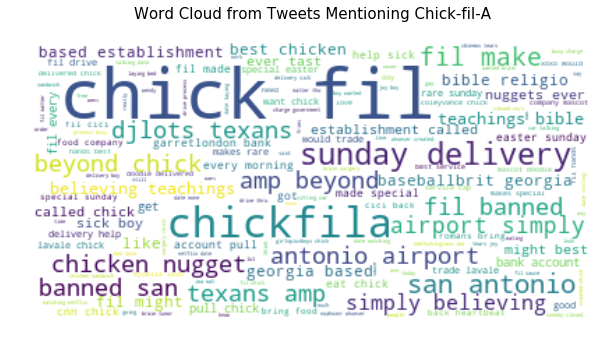

In [626]:
# word cloud 

from nltk.corpus import stopwords
stopwords = set(stopwords.words("english"))

wordcloud = WordCloud(background_color="white",
                      max_font_size=50, relative_scaling=.5, 
                      random_state=1, stopwords=stopwords).generate(' '.join(df_mention_chick['cleaned']))
plt.figure(figsize=(10,10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud from Tweets Mentioning Chick-fil-A\n", fontsize=15)
plt.savefig("images/Word Cloud from Tweets Mentioning Chick-fil-A.png")

### Popular Bigrams

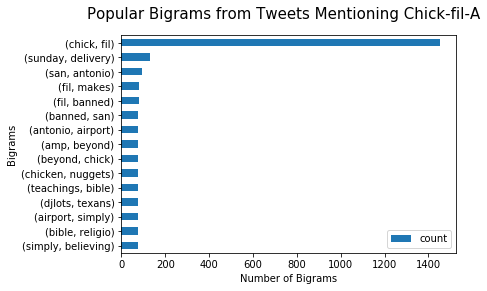

In [627]:
# popular bigrams

chick_bgs = df_mention_chick['cleaned'].values.tolist()
chick_bgs = str(chick_bgs)
chick_bgs = re.sub("[^a-zA-Z0-9]", " ", str(chick_bgs))
chick_bgs = word_tokenize(chick_bgs)
chick_bgs = nltk.bigrams(chick_bgs)
chick_bgs = nltk.FreqDist(chick_bgs)
chick_bgs = pd.DataFrame.from_dict(chick_bgs, orient='index').reset_index()
chick_bgs = chick_bgs.rename(columns={'index':'bigram', 0:'count'})
chick_bgs = chick_bgs.set_index('bigram')
ax = chick_bgs.sort_values('count', ascending=False).head(15)
ax = ax.sort_values('count', ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("Popular Bigrams from Tweets Mentioning Chick-fil-A", fontsize=15)
plt.ylabel("Bigrams")
plt.xlabel("Number of Bigrams")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Popular Bigrams from Tweets Mentioning Chick-fil-A.png", bbox_inches='tight')


## Chick-fil-A Tweets Descriptive and Content Analytics

### Total Original Tweets and Retweets

Total Number of Original Tweets and Retweets(True is Retweets and False is Original Tweets)
False    3236
Name: retweet, dtype: int64



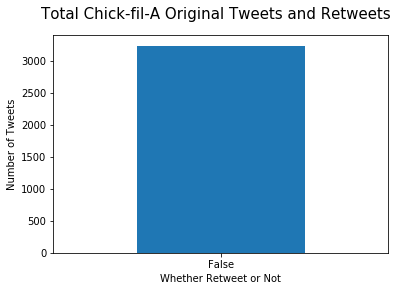

In [628]:
# find out how many tweets and retweets there are

print ('Total Number of Original Tweets and Retweets(True is Retweets and False is Original Tweets)')
print (df_chick['retweet'].value_counts())
print()
# plot the total tweets

ax = df_chick['retweet'].value_counts().plot(kind='bar')
plt.xticks(rotation=0)
plt.suptitle("Total Chick-fil-A Original Tweets and Retweets", fontsize=15)
plt.xlabel("Whether Retweet or Not")
plt.ylabel("Number of Tweets")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Total Chick-fil-A Original Tweets and Retweets.png", bbox_inches='tight')


**There are only 3236 original tweets from Chick-fil-A Twitter account.**

### Hashtags Metrics

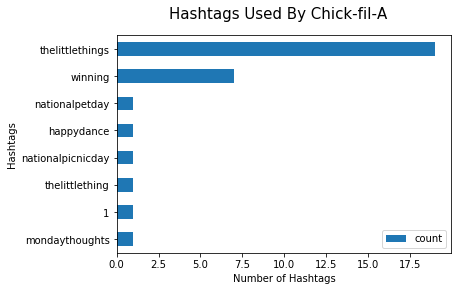

The Total Number of Hashtags:
count    32
dtype: int64



In [629]:
# find out the popular hashtags used

chick_hashtags = df_chick['hashtags'].value_counts().reset_index()
chick_hashtags = chick_hashtags.rename(columns={'index': 'hashtags', 'hashtags': 'count'})
chick_hashtags = chick_hashtags.drop(chick_hashtags.index[[0]])
chick_hashtags = chick_hashtags.set_index('hashtags')
ax = chick_hashtags.sort_values('count',ascending=False).head(10)
ax = ax.sort_values('count',ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("Hashtags Used By Chick-fil-A", fontsize=15)
plt.ylabel("Hashtags")
plt.xlabel("Number of Hashtags")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Hashtags Used By Chick-fil-A.png", bbox_inches='tight')

# find out how many hashtags mcdonalds used on their tweets

print('The Total Number of Hashtags:')
print(chick_hashtags.sum())
print()

### Mentions Metrics

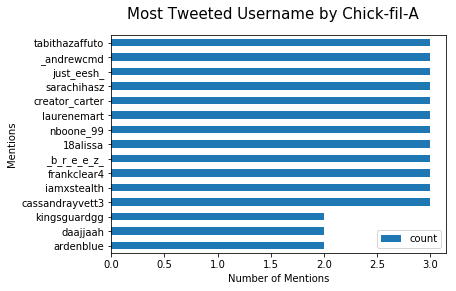

In [630]:
# find out who is the most mentioned by mcdonalds

chick_most_mention = df_chick['mentions'].value_counts().reset_index()
chick_most_mention = chick_most_mention.rename(columns={'index': 'mentions', 'mentions': 'count'})
chick_most_mention['mentions'].replace('', np.nan, inplace=True)
chick_most_mention = chick_most_mention.dropna()
chick_most_mention = chick_most_mention.set_index('mentions')
ax = chick_most_mention.head(15)
ax = ax.sort_values('count', ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("Most Tweeted Username by Chick-fil-A", fontsize=15)
plt.ylabel("Mentions")
plt.xlabel("Number of Mentions")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Most Tweeted Username by Chick-fil-A.png", bbox_inches='tight')


**There are 12 users that have been most mentioned by Chick-fil-A.**

### Popular Words Used by Chick-fil-A on Their Tweets

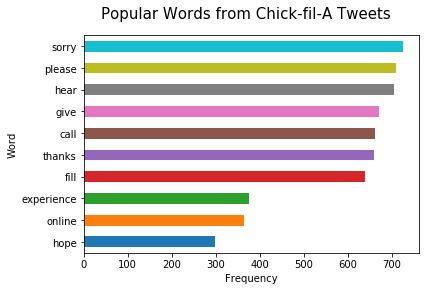

In [631]:
# find out the most popular words from company's tweets

ax = df_chick.cleaned.str.split(expand=True).stack().value_counts().head(10)
ax = ax.sort_values(ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("Popular Words from Chick-fil-A Tweets", fontsize=15)
plt.ylabel("Word")
plt.xlabel("Frequency")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Popular Words from Chick-fil-A Tweets.png", bbox_inches='tight')


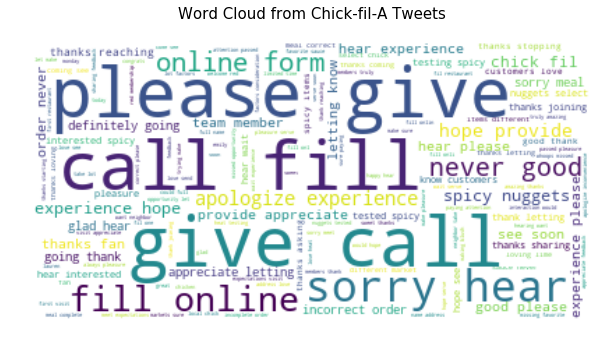

In [632]:
# word cloud of tweets

from nltk.corpus import stopwords
stopwords = stopwords.words('english')

wordcloud = WordCloud(background_color="white",
                      max_font_size=50, relative_scaling=.5, 
                      random_state=1, stopwords=stopwords).generate(' '.join(df_chick['cleaned']))
plt.figure(figsize=(10,10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud from Chick-fil-A Tweets\n", fontsize=15)
plt.savefig("images/Word Cloud from Chick-fil-A Tweets.png")

### Popular Bigrams 

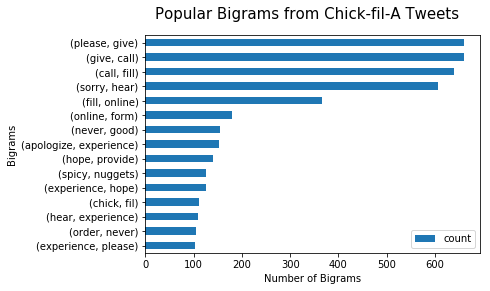

In [633]:
# popular bigrams

chick_bgs = df_chick['cleaned'].values.tolist()
chick_bgs = str(chick_bgs)
chick_bgs = re.sub("[^a-zA-Z0-9]", " ", str(chick_bgs))
chick_bgs = word_tokenize(chick_bgs)
chick_bgs = nltk.bigrams(chick_bgs)
chick_bgs = nltk.FreqDist(chick_bgs)
chick_bgs = pd.DataFrame.from_dict(chick_bgs, orient='index').reset_index()
chick_bgs = chick_bgs.rename(columns={'index':'bigram', 0:'count'})
chick_bgs = chick_bgs.set_index('bigram')
ax = chick_bgs.sort_values('count', ascending=False).head(15)
ax = ax.sort_values('count',ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("Popular Bigrams from Chick-fil-A Tweets", fontsize=15)
plt.ylabel("Bigrams")
plt.xlabel("Number of Bigrams")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Popular Bigrams from Chick-fil-A Tweets.png", bbox_inches='tight')


### Tweet Metrics

In [634]:
# time series analysis

df_chick1 = df_chick
df_chick1['time'] = pd.to_datetime(df_chick1['created_at'])
chick_time = df_chick1.set_index(['time'])
chick_time.head(2)

,screen_name,id,created_at,tweet,retweet,hashtags,mentions,hashtag_count,mention_count,cleaned,sentiment
time,,,,,,,,,,,
2019-04-26 18:08:28,ChickfilA,1121838467342831617,2019-04-26 18:08:28,@britneyrush10 🚗💨🚙💨🚗💨,False,,britneyrush10,0,1,britneyrush,0.0000
2019-04-26 18:07:33,ChickfilA,1121838239927689220,2019-04-26 18:07:33,@kelseyslager we're sorry that your meal wasn't correct. please give us a call at 1-866-232-2040 or fill out our on… https://t.co/dzshpfkr2p,False,,kelseyslager,0,1,kelseyslager sorry meal correct please give call fill,-0.3098


In [635]:
# create function to count number of tweets 

def f(x):
     return pd.Series(dict(number_of_tweets = x['tweet'].count(), 
                        ))

In [636]:
# time series by month 

chick_month = chick_time.groupby(chick_time.index.month).apply(f)
chick_month

,number_of_tweets
time,
3,671
4,2565


**It appears that all the Chick-fil-A tweets I collected is only from March and April but mostly from April.**

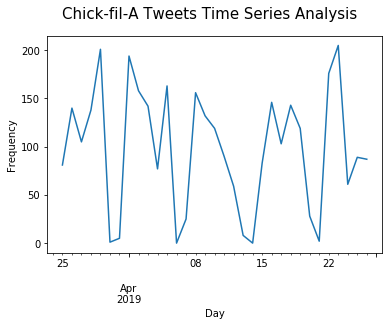

In [637]:
# time series by day

chick_day = chick_time.resample('D').size()
ax = chick_day.plot()
plt.suptitle("Chick-fil-A Tweets Time Series Analysis", fontsize=15)
plt.xlabel("Day")
plt.ylabel("Frequency")
plt.show()
fig = ax.get_figure()
fig.savefig('images/Chick-fil-A Tweets Time Series Analysis.png', bbox_inches='tight')


In [638]:
# find the most tweets per day

chick_day = chick_day.reset_index()
chick_day = chick_day.rename(columns={0: 'count', 'time': 'date'})
chick_day.sort_values('count', ascending=False).head()


,date,count
29,2019-04-23,205
4,2019-03-29,201
7,2019-04-01,194
28,2019-04-22,176
11,2019-04-05,163


**It appears that Chick-fil-A tweeted the most on April 23 with 205 tweets.**

### Drill-down: April 23 Tweet Metrics

In [639]:
# select and analyze april 23 tweets

chick_april = chick_time['2019-04-23']
print(chick_april.groupby(chick_april['sentiment'].apply(lambda x: 'negative' if x < 0 else 'positive' if x > 0 else 'neutral'))['sentiment'].count())
print('')

# average sentiment for april tweets

print('The average sentiment for April 23 tweets:')
print(chick_april['sentiment'].mean())

sentiment
negative    23 
neutral     38 
positive    144
Name: sentiment, dtype: int64

The average sentiment for April 23 tweets:
0.3589136585365852


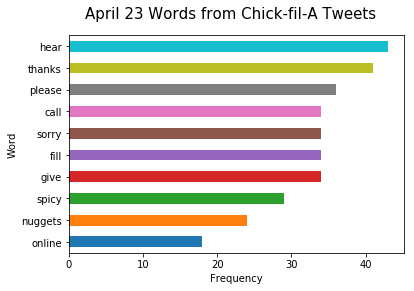

In [640]:
# popular words for april tweets

ax = chick_april.cleaned.str.split(expand=True).stack().value_counts().head(10)
ax = ax.sort_values(ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("April 23 Words from Chick-fil-A Tweets", fontsize=15)
plt.ylabel("Word")
plt.xlabel("Frequency")
plt.show()
fig = ax.get_figure()
fig.savefig("images/April 23 Words from Chick-fil-A Tweets.png", bbox_inches='tight')


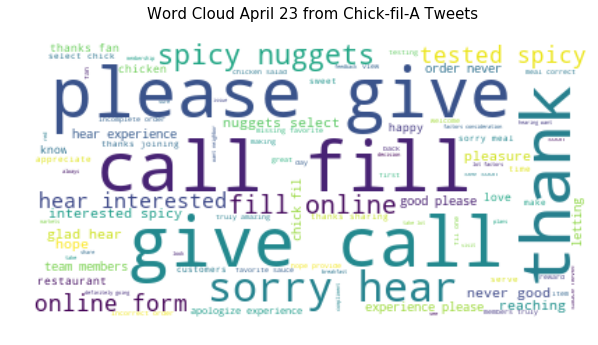

In [641]:
# word cloud of april tweets

wordcloud = WordCloud(background_color="white",
                      max_font_size=50, relative_scaling=.5, 
                      random_state=1, stopwords=stopwords).generate(' '.join(chick_april['cleaned']))
plt.figure(figsize=(10,10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud April 23 from Chick-fil-A Tweets\n", fontsize=15)
plt.savefig("images/Word Cloud April 23 from Chick-fil-A Tweets.png")

## Tweets Mentioning Chick-fil-A Sentiment Analysis

sentiment
negative    446
neutral     744
positive    848
Name: sentiment, dtype: int64

The average sentiment for Chick-fil-A tweets:
0.09085569185475943


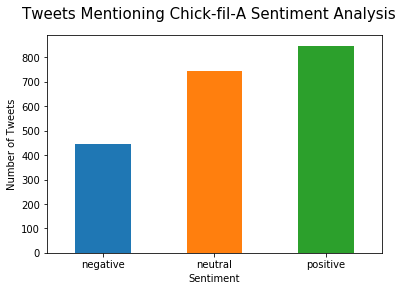

In [642]:
# positive vs. neutral vs. negative counts

print (df_mention_chick.groupby(df_mention_chick['sentiment'].apply(lambda x: 'negative' if x < 0 else 'positive' if x > 0 else 'neutral'))['sentiment'].count())
print('')

# average sentiment for all tweets

print("The average sentiment for Chick-fil-A tweets:")
print(df_mention_chick['sentiment'].mean())

# plot the sentiment classification

ax= df_mention_chick.groupby(df_mention_chick['sentiment'].apply(lambda x: 'negative' if x < 0 else 'positive' if x > 0 else 'neutral'))['sentiment'].count().plot(kind='bar')
plt.xticks(rotation=0)
plt.suptitle("Tweets Mentioning Chick-fil-A Sentiment Analysis", fontsize=15)
plt.xlabel("Sentiment")
plt.ylabel("Number of Tweets")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Tweets Mentioning Chick-fil-A Sentiment Analysis.png", bbox_inches='tight')


### Chick-fil-A Negative Tweets

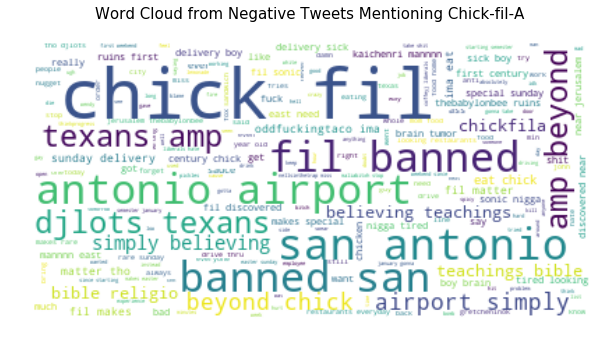

In [643]:
# word cloud negative tweets
#add stopwords

chick_neg = df_mention_chick.loc[df_mention_chick['sentiment'] < 0]

from nltk.corpus import stopwords
stopwords = set(stopwords.words("english"))

wordcloud = WordCloud(background_color="white",
                      max_font_size=50, relative_scaling=.5, 
                      random_state=1, stopwords=stopwords).generate(' '.join(chick_neg['cleaned']))
plt.figure(figsize=(10,10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud from Negative Tweets Mentioning Chick-fil-A \n", fontsize=15)
plt.savefig("images/Word Cloud from Negative Tweets Mentioning Chick-fil-A.png")

### Popular Bigrams Negative Tweets

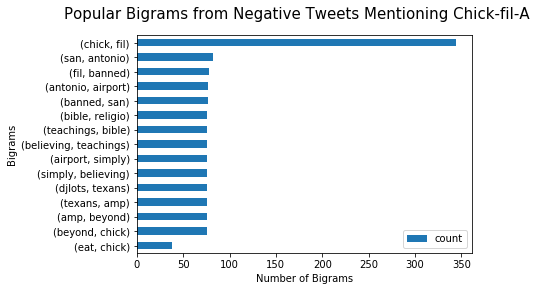

In [644]:
# popular bigrams

chick_bgs = chick_neg['cleaned'].values.tolist()
chick_bgs = str(chick_bgs)
chick_bgs = re.sub("[^a-zA-Z0-9]", " ", str(chick_bgs))
chick_bgs = word_tokenize(chick_bgs)
chick_bgs = nltk.bigrams(chick_bgs)
chick_bgs = nltk.FreqDist(chick_bgs)
chick_bgs = pd.DataFrame.from_dict(chick_bgs, orient='index').reset_index()
chick_bgs = chick_bgs.rename(columns={'index':'bigram', 0:'count'})
chick_bgs = chick_bgs.set_index('bigram')
ax = chick_bgs.sort_values('count', ascending=False).head(15)
ax = ax.sort_values('count', ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("Popular Bigrams from Negative Tweets Mentioning Chick-fil-A ", fontsize=15)
plt.ylabel("Bigrams")
plt.xlabel("Number of Bigrams")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Popular Bigrams from Negative Tweets Mentioning Chick-fil-A.png", bbox_inches='tight')


### Chick-fil-A Positive Tweets

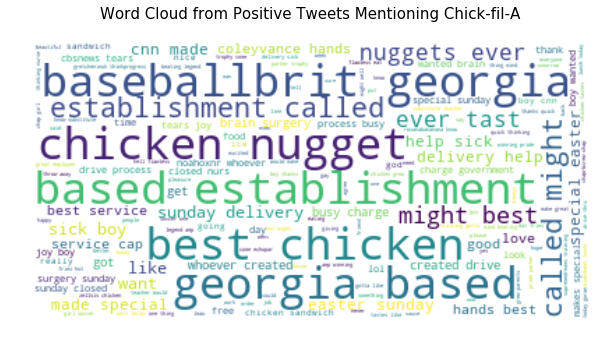

In [645]:
# word cloud positive tweets
# add stopwords

chick_pos = df_mention_chick.loc[df_mention_chick['sentiment'] > 0]

from nltk.corpus import stopwords
stopwords = set(stopwords.words("english"))
stopwords.add("chickfila")
stopwords.add("chick")
stopwords.add("fil")

wordcloud = WordCloud(background_color="white",
                      max_font_size=50, relative_scaling=.5, 
                      random_state=1, stopwords=stopwords).generate(' '.join(chick_pos['cleaned']))
plt.figure(figsize=(10,10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud from Positive Tweets Mentioning Chick-fil-A \n", fontsize=15)
plt.savefig("images/Word Cloud from Positive Tweets Mentioning Chick-fil-A.png")

### Popular Bigrams Positive Tweets 

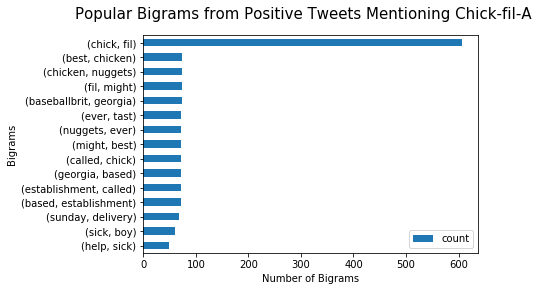

In [646]:
# popular bigrams
from nltk.corpus import stopwords

chick_bgs = chick_pos['cleaned'].values.tolist()
chick_bgs = str(chick_bgs)
chick_bgs = re.sub("[^a-zA-Z0-9]", " ", str(chick_bgs))
chick_bgs = word_tokenize(chick_bgs)
more_stopwords = set(('model', 'dimitri', 'wanna', 'aarp', 'really', 
                      'mcdonald', 'mcdonalds', 'hair', 'look',
                      'like', 'bmarchant', 'makes', 'flamingopunch', 'ask', 'wan', 'na', 'amp'))
#extra_stoplist = set(stopwords.words('english')) | more_stopwords
#bk_bgs = (word for word in bk_bgs if word not in extra_stoplist)
chick_bgs = nltk.bigrams(chick_bgs)
chick_bgs = nltk.FreqDist(chick_bgs)
chick_bgs = pd.DataFrame.from_dict(chick_bgs, orient='index').reset_index()
chick_bgs = chick_bgs.rename(columns={'index':'bigram', 0:'count'})
chick_bgs = chick_bgs.set_index('bigram')
ax = chick_bgs.sort_values('count', ascending=False).head(15)
ax = ax.sort_values('count', ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("Popular Bigrams from Positive Tweets Mentioning Chick-fil-A ", fontsize=15)
plt.ylabel("Bigrams")
plt.xlabel("Number of Bigrams")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Popular Bigrams from Positive Tweets Mentioning Chick-fil-A.png", bbox_inches='tight')


## Chick-fil-A Tweets Sentiment Analysis

sentiment
negative    319 
neutral     591 
positive    2326
Name: sentiment, dtype: int64

The average sentiment for Burger King tweets:
0.3670968170580951


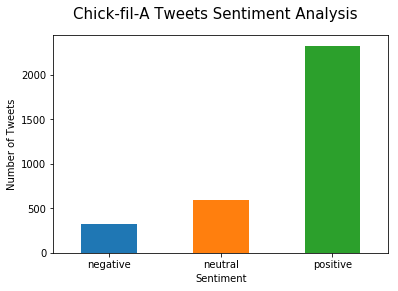

In [207]:
# positive vs. neutral vs. negative counts

print (df_chick.groupby(df_chick['sentiment'].apply(lambda x: 'negative' if x < 0 else 'positive' if x > 0 else 'neutral'))['sentiment'].count())
print('')

# average sentiment for all tweets

print("The average sentiment for Burger King tweets:")
print(df_chick['sentiment'].mean())

# plot the sentiment classification

ax= df_chick.groupby(df_chick['sentiment'].apply(lambda x: 'negative' if x < 0 else 'positive' if x > 0 else 'neutral'))['sentiment'].count().plot(kind='bar')
plt.xticks(rotation=0)
plt.suptitle("Chick-fil-A Tweets Sentiment Analysis", fontsize=15)
plt.xlabel("Sentiment")
plt.ylabel("Number of Tweets")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Chick-fil-A Tweets Sentiment Analysis.png", bbox_inches='tight')


### Chick-fil-A Negative Tweets

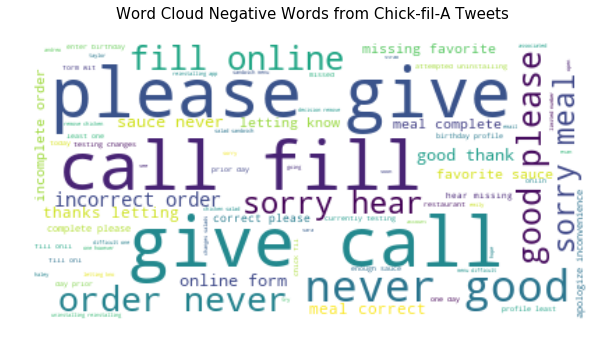

In [208]:
# word cloud of negative tweets

chick_neg = df_chick.loc[df_chick['sentiment'] < 0]

from nltk.corpus import stopwords
stopwords = set(stopwords.words("english"))

wordcloud = WordCloud(background_color="white",
                      max_font_size=50, relative_scaling=.5, 
                      random_state=1, stopwords=stopwords).generate(' '.join(chick_neg['cleaned']))
plt.figure(figsize=(10,10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud Negative Words from Chick-fil-A Tweets\n", fontsize=15)
plt.savefig("images/Word Cloud Negative Words from Chick-fil-A Tweets.png")

### Popular Bigrams Negative Tweets

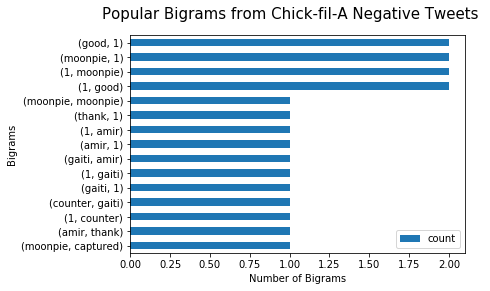

In [209]:
# popular bigrams

chick_bgs = chick_neg['cleaned'].values.tolist()
chick_bgs = str(bk_bgs)
chick_bgs = re.sub("[^a-zA-Z0-9]", " ", str(bk_bgs))
chick_bgs = word_tokenize(chick_bgs)
chick_bgs = nltk.bigrams(chick_bgs)
chick_bgs = nltk.FreqDist(chick_bgs)
chick_bgs = pd.DataFrame.from_dict(chick_bgs, orient='index').reset_index()
chick_bgs = chick_bgs.rename(columns={'index':'bigram', 0:'count'})
chick_bgs = chick_bgs.set_index('bigram')
ax = chick_bgs.sort_values('count', ascending=False).head(15)
ax = ax.sort_values('count', ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("Popular Bigrams from Chick-fil-A Negative Tweets ", fontsize=15)
plt.ylabel("Bigrams")
plt.xlabel("Number of Bigrams")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Popular Bigrams from Chick-fil-A Negative Tweets.png", bbox_inches='tight')


### Chick-fil-A Positive Tweets

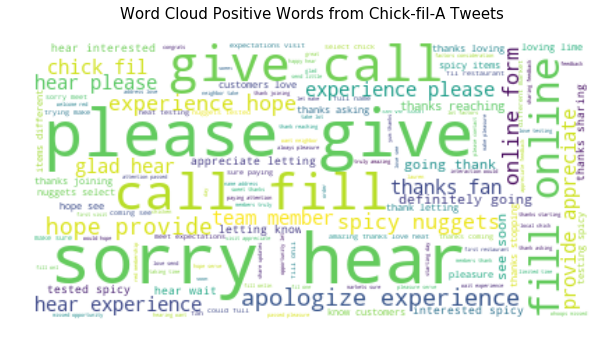

In [210]:
# word cloud of positive tweets

chick_pos = df_chick.loc[df_chick['sentiment'] > 0]

wordcloud = WordCloud(background_color="white",
                      max_font_size=50, relative_scaling=.5, 
                      random_state=1, stopwords=stopwords).generate(' '.join(chick_pos['cleaned']))
plt.figure(figsize=(10,10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud Positive Words from Chick-fil-A Tweets\n", fontsize=15)
plt.savefig("images/Word Cloud Positive Words from Chick-fil-A Tweets.png")

### Popular Bigrams Positive Tweets

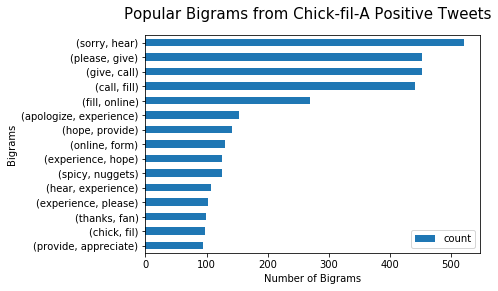

In [211]:
# popular bigrams

chick_bgs = chick_pos['cleaned'].values.tolist()
chick_bgs = str(chick_bgs)
chick_bgs = re.sub("[^a-zA-Z0-9]", " ", str(chick_bgs))
chick_bgs = word_tokenize(chick_bgs)
chick_bgs = nltk.bigrams(chick_bgs)
chick_bgs = nltk.FreqDist(chick_bgs)
chick_bgs = pd.DataFrame.from_dict(chick_bgs, orient='index').reset_index()
chick_bgs = chick_bgs.rename(columns={'index':'bigram', 0:'count'})
chick_bgs = chick_bgs.set_index('bigram')
ax = chick_bgs.sort_values('count', ascending=False).head(15)
ax = ax.sort_values('count', ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("Popular Bigrams from Chick-fil-A Positive Tweets", fontsize=15)
plt.ylabel("Bigrams")
plt.xlabel("Number of Bigrams")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Popular Bigrams from Chick-fil-A Positive Tweets.png", bbox_inches='tight')


## Topic Modeling for Tweets Mentioning Burger King

In [212]:
# select data for topic modeling and convert to list

chick_modeling = df_mention_chick['tweet']
texts = chick_modeling.values

### Data Cleaning

In [213]:
# text preprocessing
from nltk.corpus import stopwords

# Remove useless numbers and alphanumerical words
documents = [re.sub("[^a-zA-Z]+", " ", str(text)) for text in texts]

# tokenize
texts = [document.split() for document in documents]

# stemming words: having --> have; friends --> friend
wordnet_lemmatizer = WordNetLemmatizer()
texts = [[wordnet_lemmatizer.lemmatize(word) for word in tokens] for tokens in texts]

# remove common words 
stoplist = stopwords.words('english')
texts = [[word for word in tokens if word not in stoplist] for tokens in texts]

#remove short words
texts = [[word for word in tokens if len(word) >= 3] for tokens in texts]

# A list of extra stopwords 
extra_stopwords = ['http', 'temen', 'jadi', 'kasir', 'banget',
                   'mempekerjakan', 'mudahan', 'mudah', 'leyes', 'legislaci', 'norman',
                   'que', 'neme', 'esto', 'nassib', 'por', 'seu',
                   'faz', 'mica', 'pol', 'foge', 'nostril', 'non',
                  'per', 'passasse', 'straniero', 'iperbole', 'nonnie', 'aprile', 'perch', 'sacrificarono',
                   'una', 'lang', 'mit', 'einer', 'xxz', 'westerner',
                   'hkgv', 'bir', 'nce', 'capamagmoments', 'anlar', 'ndan', 'arac', 'ndeki']

#extra_stoplist = extra_stopwords

# remove extra stopwords
texts = [[word for word in tokens if word not in extra_stoplist] for tokens in texts]
len(texts)
#https://github.com/alexperrier/datatalks/blob/master/debates/R/stm.R

2038

In [214]:
# save the preprocessed texts
df_texts = pd.DataFrame(texts)
df_texts.to_csv('data/mention_chick_processed_texts.csv', index=False, header=False)

# Create a dictionary representation of the documents.

dictionary = Dictionary(texts) 

len(dictionary)

3655

In [215]:
# Remove rare and common tokens.
# ignore words that appear in less than 2 documents or more than 40% documents (remove too frequent & infrequent words) - an optional step
dictionary.filter_extremes(no_below=5, no_above=0.5) #https://radimrehurek.com/gensim/corpora/dictionary.html#gensim.corpora.dictionary.Dictionary.filter_extremes
dictionary.save('data/mention_chick_texts.dict')  # store the dictionary, for future reference
len(dictionary)

527

In [216]:
# convert words to vetors or integers
corpus = [dictionary.doc2bow(text) for text in texts]
corpora.MmCorpus.serialize('data/mention_chick_texts.mm', corpus)  
len(corpus)

2038

In [217]:
print(('Number of unique tokens: %d' % len(dictionary)))
print(('Number of documents: %d' % len(corpus)))

# save dict and corpus

saved_dict = dictionary.load('data/mention_chick_texts.dict')
saved_corpus = corpora.MmCorpus('data/mention_chick_texts.mm')

Number of unique tokens: 527
Number of documents: 2038


### Determine Optimal K-value

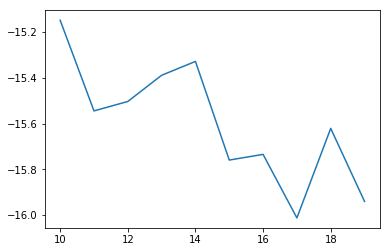

In [218]:
# load the optimal k-value result
Image("images/Optimal K-value for Tweets Mentioning Chick-fil-A LDA Model.png")

**Optimal k-value is 10 topics**

### Build topic modeling model with LDA and use optimal k-value = 10

In [219]:
# use the optimal k-value to build model (num_topics=10)

numpy.random.seed(1) # setting random seed to get the same results each time. 
model = ldamodel.LdaModel(corpus, id2word=dictionary, num_topics=10, passes=200, eval_every=1)

In [220]:
# save the best and optimal lda model
model.save('data/lda_chick_mention.model') 

In [221]:
# load the model
model = models.LdaModel.load('data/lda_chick_mention.model')

### Term-Topic Distribution

In [222]:
# let's see the topic found by the model

model.show_topics(num_topics=10)

[(0,
  '0.069*"sunday" + 0.057*"delivery" + 0.050*"boy" + 0.046*"make" + 0.037*"know" + 0.037*"special" + 0.033*"closed" + 0.029*"sick" + 0.028*"day" + 0.028*"week"'),
 (1,
  '0.085*"nugget" + 0.083*"chicken" + 0.075*"ever" + 0.070*"might" + 0.069*"baseballbrit" + 0.068*"best" + 0.066*"called" + 0.064*"georgia" + 0.064*"based" + 0.064*"establishment"'),
 (2,
  '0.119*"first" + 0.115*"near" + 0.115*"ruin" + 0.115*"century" + 0.115*"discovered" + 0.114*"thebabylonbee" + 0.114*"lom" + 0.114*"jerusalem" + 0.011*"feel" + 0.010*"check"'),
 (3,
  '0.053*"chickfila" + 0.050*"date" + 0.046*"today" + 0.045*"still" + 0.044*"car" + 0.043*"watching" + 0.042*"eating" + 0.040*"lol" + 0.039*"day" + 0.039*"could"'),
 (4,
  '0.205*"chickfila" + 0.076*"try" + 0.057*"sauce" + 0.050*"people" + 0.044*"mom" + 0.043*"much" + 0.043*"doe" + 0.042*"gonna" + 0.041*"polynesian" + 0.040*"baby"'),
 (5,
  '0.087*"like" + 0.074*"one" + 0.070*"chickfila" + 0.058*"man" + 0.041*"time" + 0.035*"order" + 0.034*"home" + 0.0

In [223]:
# print topics without probability
for i in range(0,10):
    topics = model.show_topic(i, 10)
    print(', '.join([str(word[0]) for word in topics]))

sunday, delivery, boy, make, know, special, closed, sick, day, week
nugget, chicken, ever, might, baseballbrit, best, called, georgia, based, establishment
first, near, ruin, century, discovered, thebabylonbee, lom, jerusalem, feel, check
chickfila, date, today, still, car, watching, eating, lol, day, could
chickfila, try, sauce, people, mom, much, doe, gonna, polynesian, baby
like, one, chickfila, man, time, order, home, old, something, sure
chickfila, got, every, morning, drink, found, would, account, bank, pull
amp, antonio, san, airport, djlots, banned, bible, beyond, religio, teaching
sauce, best, service, point, hand, cap, coleyvance, many, saying, milkshake
well, hell, wow, cfa, drive, fry, chickfila, eat, whoever, charge


**Tweets Mentioning Chick-fil-A Topics:**
1. Special Sunday delivery to a very sick boy
2. Best chicken nugget Georgia-based
3. First discovered near ruin in Jerusalem
4. Watching and eating Chick-fil-A
5. Polynesian mom try Chick-fil-A sauce
6. A man orders Chick-fil-A 
7. Every morning drinks at Chick-fil-A
8. San Antonio airport banned bible
9. Best service and best sauce and milkshake
10. Drive fry Chick-fil-A

### Data Visualization with Gensim

In [224]:
# better visualization with gensim

pyLDAvis.enable_notebook()
pyLDAvis.gensim.prepare(model, corpus, dictionary, sort_topics=False)

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0     -0.056319 -0.000361  1       1        19.986546
1     -0.199408  0.263068  2       1        10.883308
2     -0.322377 -0.336864  3       1        2.840279 
3      0.147343 -0.066197  4       1        9.675038 
4      0.200826 -0.033760  5       1        4.091369 
5      0.173826 -0.072237  6       1        9.452007 
6      0.129111 -0.051639  7       1        15.219858
7     -0.067391  0.090105  8       1        14.859859
8     -0.083658  0.188954  9       1        3.912134 
9      0.078047  0.018931  10      1        9.079602 , topic_info=     Category        Freq           Term       Total  loglift  logprob
term                                                                  
1     Default  360.000000  chickfila      360.000000  30.0000  30.0000
70    Default  142.000000  best           142.000000  29.0000  29.0000
306   Default  89.000000   sauce          89.000000   28.0000  28.0000
98    Default  152.000000  sunday         152.000000  27.0000  27.0000
76    Default  102.000000  nugget         102.000000  26.0000  26.0000
72    Default  139.000000  chicken        139.000000  25.0000  25.0000
96    Default  101.000000  like           101.000000  24.0000  24.0000
46    Default  90.000000   ever           90.000000   23.0000  23.0000
148   Default  126.000000  delivery       126.000000  22.0000  22.0000
122   Default  57.000000   service        57.000000   21.0000  21.0000
68    Default  84.000000   baseballbrit   84.000000   20.0000  20.0000
64    Default  77.000000   one            77.000000   19.0000  19.0000
71    Default  80.000000   called         80.000000   18.0000  18.0000
75    Default  91.000000   might          91.000000   17.0000  17.0000
261   Default  112.000000  boy            112.000000  16.0000  16.0000
34    Default  104.000000  amp            104.000000  15.0000  15.0000
74    Default  78.000000   georgia        78.000000   14.0000  14.0000
69    Default  77.000000   based          77.000000   13.0000  13.0000
73    Default  77.000000   establishment  77.000000   12.0000  12.0000
77    Default  77.000000   tast           77.000000   11.0000  11.0000
22    Default  89.000000   san            89.000000   10.0000  10.0000
18    Default  89.000000   antonio        89.000000   9.0000   9.0000 
88    Default  86.000000   got            86.000000   8.0000   8.0000 
78    Default  102.000000  make           102.000000  7.0000   7.0000 
33    Default  77.000000   airport        77.000000   6.0000   6.0000 
378   Default  61.000000   man            61.000000   5.0000   5.0000 
511   Default  43.000000   point          43.000000   4.0000   4.0000 
63    Default  38.000000   first          38.000000   3.0000   3.0000 
39    Default  75.000000   djlots         75.000000   2.0000   2.0000 
288   Default  104.000000  day            104.000000  1.0000   1.0000 
...       ...        ...      ...               ...      ...      ... 
277   Topic10  22.533075   noahoxnr       23.519735   2.3563  -3.7956 
276   Topic10  22.533092   government     23.519753   2.3563  -3.7956 
60    Topic10  22.532898   thru           23.519581   2.3563  -3.7956 
275   Topic10  20.294889   created        21.281559   2.3517  -3.9002 
273   Topic10  18.802900   busy           19.789560   2.3480  -3.9766 
97    Topic10  13.580424   line           14.567103   2.3290  -4.3020 
56    Topic10  13.580258   work           14.566961   2.3290  -4.3020 
143   Topic10  13.580107   even           14.566824   2.3290  -4.3020 
104   Topic10  12.834426   away           13.821106   2.3251  -4.3585 
83    Topic10  12.087953   right          13.074676   2.3207  -4.4184 
299   Topic10  11.342263   hit            12.328940   2.3157  -4.4821 
238   Topic10  9.850289    hot            10.836963   2.3037  -4.6231 
129   Topic10  9.850154    waffle         10.836853   2.3037  -4.6231 
196   Topic10  9.849794    fast           1

## Topic Modeling for Chick-fil-A Tweets

In [225]:
# select data for topic modeling and convert to list

chick_modeling = df_chick['tweet']
texts = chick_modeling.values

### Data Cleaning

In [226]:
# text preprocessing
from nltk.corpus import stopwords

# Remove useless numbers and alphanumerical words
documents = [re.sub("[^a-zA-Z]+", " ", str(text)) for text in texts]

# tokenize
texts = [document.split() for document in documents]

# stemming words: having --> have; friends --> friend
wordnet_lemmatizer = WordNetLemmatizer()
texts = [[wordnet_lemmatizer.lemmatize(word) for word in tokens] for tokens in texts]

# remove common words 
stoplist = stopwords.words('english')
texts = [[word for word in tokens if word not in stoplist] for tokens in texts]

#remove short words
texts = [[word for word in tokens if len(word) >= 3] for tokens in texts]

# A list of extra stopwords 
extra_stopwords = ['http']

extra_stoplist = extra_stopwords

# remove extra stopwords
texts = [[word for word in tokens if word not in extra_stoplist] for tokens in texts]
len(texts)
#https://github.com/alexperrier/datatalks/blob/master/debates/R/stm.R

3236

In [227]:
# save the preprocessed texts
df_texts = pd.DataFrame(texts)
df_texts.to_csv('data/chick_processed_texts.csv', index=False, header=False)

# Create a dictionary representation of the documents.

dictionary = Dictionary(texts) 

len(dictionary)

6653

In [228]:
# Remove rare and common tokens.
# ignore words that appear in less than 2 documents or more than 40% documents (remove too frequent & infrequent words) - an optional step
dictionary.filter_extremes(no_below=5, no_above=0.5) #https://radimrehurek.com/gensim/corpora/dictionary.html#gensim.corpora.dictionary.Dictionary.filter_extremes
dictionary.save('data/chick_texts.dict')  # store the dictionary, for future reference
len(dictionary)

395

In [229]:
# convert words to vetors or integers
corpus = [dictionary.doc2bow(text) for text in texts]
corpora.MmCorpus.serialize('data/chick_texts.mm', corpus)  
len(corpus)

3236

In [230]:
print(('Number of unique tokens: %d' % len(dictionary)))
print(('Number of documents: %d' % len(corpus)))

# save dict and corpus

saved_dict = dictionary.load('data/chick_texts.dict')
saved_corpus = corpora.MmCorpus('data/chick_texts.mm')

Number of unique tokens: 395
Number of documents: 3236


### Determine Optimal K-value

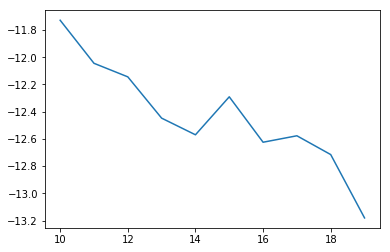

In [231]:
# load the optimal k-value result
Image("images/Optimal K-value for Chick-fil-A LDA Model.png")

**Optimal k-value is 11 topics**

### Build topic modeling model with LDA and use optimal k-value = 10

In [232]:
# use the optimal k-value to build model (num_topics=10)

numpy.random.seed(1) # setting random seed to get the same results each time. 
model = ldamodel.LdaModel(corpus, id2word=dictionary, num_topics=10, passes=200, eval_every=1)

In [233]:
# save the best and optimal lda model
model.save('data/lda_chick.model') 

In [234]:
# load the model
model = models.LdaModel.load('data/lda_chick.model')

### Term-Topic Distribution

In [235]:
# let's see the topic found by the model

model.show_topics(num_topics=10)

[(0,
  '0.101*"soon" + 0.093*"see" + 0.085*"hope" + 0.065*"visit" + 0.043*"first" + 0.036*"come" + 0.028*"appreciate" + 0.026*"expectation" + 0.026*"meet" + 0.026*"letting"'),
 (1,
  '0.093*"nugget" + 0.086*"spicy" + 0.083*"pleasure" + 0.065*"glad" + 0.057*"tested" + 0.055*"hear" + 0.050*"select" + 0.044*"make" + 0.041*"interested" + 0.026*"let"'),
 (2,
  '0.131*"love" + 0.050*"testing" + 0.048*"item" + 0.045*"know" + 0.042*"customer" + 0.042*"spicy" + 0.036*"could" + 0.035*"different" + 0.033*"market" + 0.030*"name"'),
 (3,
  '0.107*"chick" + 0.100*"fil" + 0.066*"always" + 0.053*"reaching" + 0.052*"restaurant" + 0.039*"great" + 0.037*"one" + 0.030*"local" + 0.030*"please" + 0.027*"thank"'),
 (4,
  '0.134*"please" + 0.132*"give" + 0.130*"call" + 0.126*"fill" + 0.077*"sorry" + 0.073*"online" + 0.061*"hear" + 0.043*"experience" + 0.036*"form" + 0.032*"apologize"'),
 (5,
  '0.173*"thanks" + 0.067*"lime" + 0.061*"loving" + 0.057*"sweet" + 0.048*"joining" + 0.034*"red" + 0.032*"welcome" + 0

In [236]:
# print topics without probability
for i in range(0,10):
    topics = model.show_topic(i, 10)
    print(', '.join([str(word[0]) for word in topics]))

soon, see, hope, visit, first, come, appreciate, expectation, meet, letting
nugget, spicy, pleasure, glad, tested, hear, select, make, interested, let
love, testing, item, know, customer, spicy, could, different, market, name
chick, fil, always, reaching, restaurant, great, one, local, please, thank
please, give, call, fill, sorry, online, hear, experience, form, apologize
thanks, lime, loving, sweet, joining, red, welcome, app, membership, congrats
thanks, fan, member, serve, team, see, stopping, pleasure, coming, happy
hear, hope, sorry, experience, provide, appreciate, wait, letting, would, interaction
hear, sorry, thank, letting, going, definitely, sauce, thanks, good, never
thanks, day, time, feedback, sharing, chicken, reaching, best, asking, appreciate


**Chick-fil-A Tweets Topics:**
1. Appreciating customers visits
2. Spicy nuggets seem interesting
3. Love testing new spicy item that could be different
4. Chick-fil-A is always reaching local and great
5. Apologizing to customers and directing them to contact by call
6. Membership app
7. Thanking fan, member, server, and team
8. Hearing customer's voice by appreciating and apologizing for mistakes
9. Appreciating customer's feedback and make up for them
10. Appreciating for feedbacks and sharing chicken

### Data Visualization with Gensim

In [237]:
# better visualization with gensim

pyLDAvis.enable_notebook()
pyLDAvis.gensim.prepare(model, corpus, dictionary, sort_topics=False)

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0      0.081357 -0.066998  1       1        7.880237 
1      0.021911  0.288673  2       1        9.115431 
2     -0.023228  0.276308  3       1        7.882922 
3     -0.110157  0.175945  4       1        6.077060 
4      0.286558 -0.068879  5       1        28.310310
5     -0.231253 -0.157255  6       1        5.798944 
6     -0.221494 -0.145544  7       1        9.976118 
7      0.275562 -0.104914  8       1        8.469584 
8      0.158694 -0.105851  9       1        9.139625 
9     -0.237952 -0.091484  10      1        7.349759 , topic_info=     Category        Freq        Term       Total  loglift  logprob
term                                                               
59    Default  661.000000  thanks      661.000000  30.0000  30.0000
3     Default  618.000000  give        618.000000  29.0000  29.0000
0     Default  612.000000  call        612.000000  28.0000  28.0000
2     Default  592.000000  fill        592.000000  27.0000  27.0000
5     Default  659.000000  please      659.000000  26.0000  26.0000
6     Default  704.000000  sorry       704.000000  25.0000  25.0000
35    Default  691.000000  hear        691.000000  24.0000  24.0000
8     Default  366.000000  experience  366.000000  23.0000  23.0000
36    Default  299.000000  hope        299.000000  22.0000  22.0000
41    Default  172.000000  love        172.000000  21.0000  21.0000
9     Default  343.000000  online      343.000000  20.0000  20.0000
61    Default  148.000000  provide     148.000000  19.0000  19.0000
42    Default  196.000000  see         196.000000  18.0000  18.0000
37    Default  166.000000  soon        166.000000  17.0000  17.0000
74    Default  141.000000  nugget      141.000000  16.0000  16.0000
72    Default  185.000000  spicy       185.000000  15.0000  15.0000
22    Default  140.000000  chick       140.000000  14.0000  14.0000
10    Default  184.000000  fan         184.000000  13.0000  13.0000
43    Default  197.000000  pleasure    197.000000  12.0000  12.0000
26    Default  189.000000  thank       189.000000  11.0000  11.0000
23    Default  117.000000  fil         117.000000  10.0000  10.0000
60    Default  186.000000  appreciate  186.000000  9.0000   9.0000 
55    Default  179.000000  letting     179.000000  8.0000   8.0000 
83    Default  99.000000   glad        99.000000   7.0000   7.0000 
38    Default  85.000000   visit       85.000000   6.0000   6.0000 
95    Default  89.000000   going       89.000000   5.0000   5.0000 
76    Default  86.000000   tested      86.000000   4.0000   4.0000 
48    Default  97.000000   day         97.000000   3.0000   3.0000 
179   Default  88.000000   member      88.000000   2.0000   2.0000 
70    Default  103.000000  reaching    103.000000  1.0000   1.0000 
...       ...        ...      ...            ...      ...      ... 
240   Topic10  11.408637   shout       12.306661   2.5347  -4.6717 
318   Topic10  11.203548   anna        12.101641   2.5334  -4.6898 
298   Topic10  10.409793   return      11.307808   2.5278  -4.7633 
333   Topic10  10.205476   variation   11.103491   2.5262  -4.7831 
330   Topic10  10.205476   natural     11.103491   2.5262  -4.7831 
242   Topic10  9.228902    potato      10.126956   2.5176  -4.8837 
214   Topic10  8.820339    request     9.718373    2.5135  -4.9290 
332   Topic10  8.230135    size        9.128152    2.5069  -4.9982 
211   Topic10  7.639628    credit      8.537663    2.4994  -5.0727 
174   Topic10  7.639175    seasonal    8.537260    2.4994  -5.0728 
172   Topic10  7.253804    late        8.151818    2.4938  -5.1245 
301   Topic10  6.640820    banana      7.538834    2.4837  -5.2128 
302   Topic10  6.640820    pudding     7.538834    2.4837  -5.2128 
175   Topic10  6.254746    spring      7.152764    2.4763  -5.2727 
171   Topic10  6.254723    early       7.152741    2.4763  -5.2727 
388   Topic10  5.846159    closer      6.7441

## Tweets Mentioning Chick-fil-A Network Analytics

In [238]:
# let's process the data in list (better for text processing)

tweets = df_mention_chick.values
len(tweets)

2038

In [239]:
# make screen name and tweet text to be the only screen

mention = []

for tweet in tweets:
    mention.append([tweet[2], tweet[1]])
    
mention[:5]

[['brnvldmr',
  '@chickfila you know i have to go back because i’m addicted, okay. just 30min i’ll never get back 💔'],
 ['realpatkane',
  '.@kfc is here to remind the gays that chick-fil-a is homophobic and the colonel is apparently a snack now? https://t.co/nnpovkkkyy'],
 ['RobertoRosa05',
  'rt @garretlondon: my bank account when i pull into chick fil a every morning https://t.co/9lptbxaa8b'],
 ['83TXOCHAIR',
  'rt @gretcheninok: potential voter backlash against san antonio’s left-leaning city councilors who blocked \u2066@chickfila\u2069 at the san antonio a…'],
 ['itsjasminnnne',
  "rt @girlspiusboys: chick-fil-a's is a date, sitting in our car talking is a date, laying in bed is a date, watching netflix is a date. mone…"]]

In [240]:
# computationally intensive ... very slow if you have a lot of data
for i in mention[:5]:
    print(i[0], i[1])

brnvldmr @chickfila you know i have to go back because i’m addicted, okay. just 30min i’ll never get back 💔
realpatkane .@kfc is here to remind the gays that chick-fil-a is homophobic and the colonel is apparently a snack now? https://t.co/nnpovkkkyy
RobertoRosa05 rt @garretlondon: my bank account when i pull into chick fil a every morning https://t.co/9lptbxaa8b
83TXOCHAIR rt @gretcheninok: potential voter backlash against san antonio’s left-leaning city councilors who blocked ⁦@chickfila⁩ at the san antonio a…
itsjasminnnne rt @girlspiusboys: chick-fil-a's is a date, sitting in our car talking is a date, laying in bed is a date, watching netflix is a date. mone…


In [241]:
# select only screen name and mention name

for tweet in mention[:5]:
    a = re.findall(r"(?<=@)\w+", tweet[1])
    for i in a:
        print(tweet[0], i)

brnvldmr chickfila
realpatkane kfc
RobertoRosa05 garretlondon
83TXOCHAIR gretcheninok
83TXOCHAIR chickfila
itsjasminnnne girlspiusboys


In [242]:
# putting everything together and save it to csv

import csv
mention = []
for tweet in tweets:
    mention.append([tweet[2], tweet[1]])
    
openfile = open("data/mention_chick_network.csv", "w", newline='')
w = csv.writer(openfile)

for tweet in mention:
    a = re.findall(r"(?<=@)\w+", tweet[1])
    for i in a:
        w.writerow([tweet[0], i])
        
openfile.close()

### Network Visualization

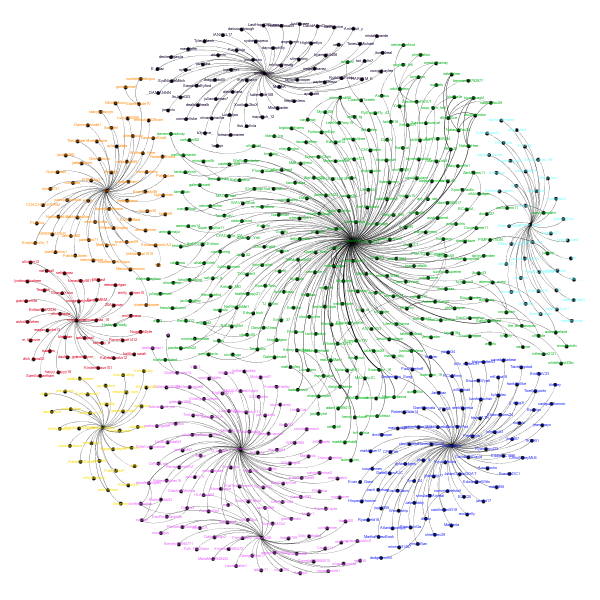

In [243]:
# load the gephi image

Image("images/Tweets Mentioning Chick-fil-A Networks.png")

**As can be seen above, tweets mentioning Chick-fil-A networks by Gephi have 8 clusters. And, the biggest cluster is green cluster.**

### The Largest Cluster from the Network

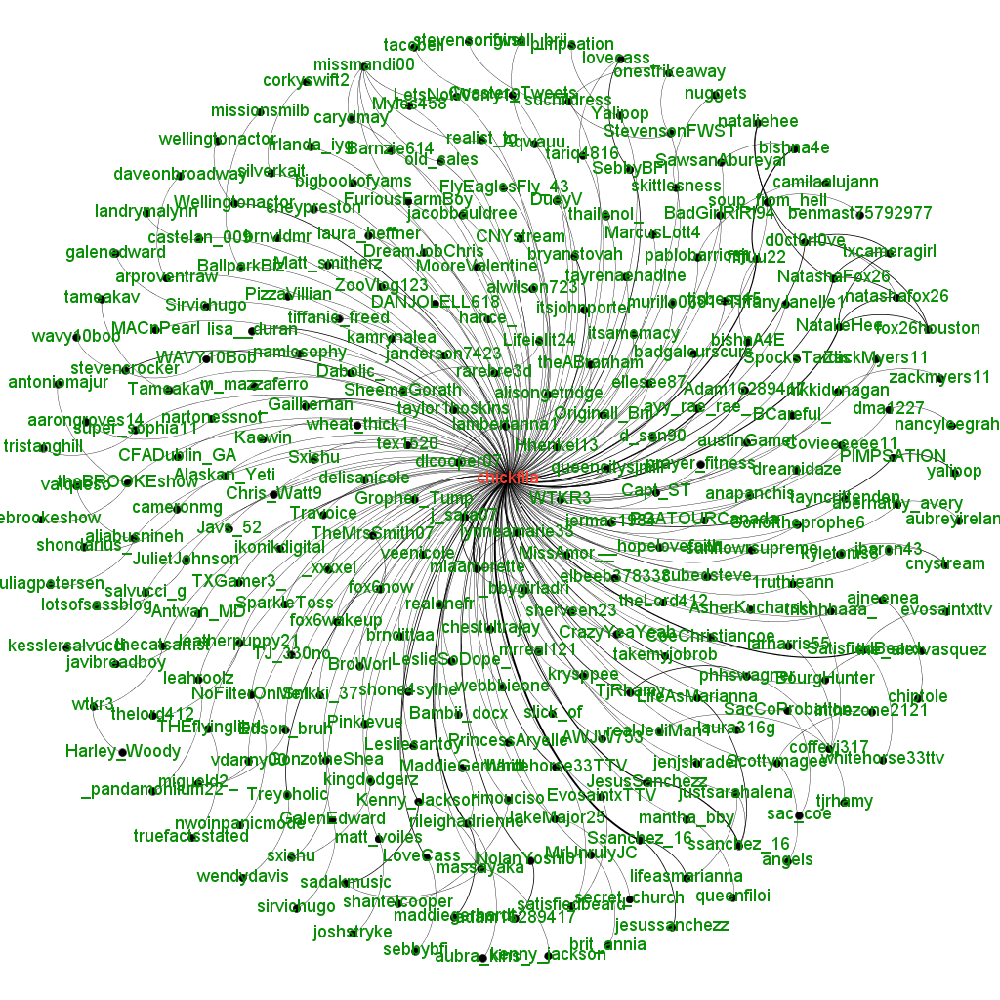

In [244]:
# load the green cluster

Image("images/Green Cluster.PNG")

**As can be seen by the network above, the biggest cluster, green cluster has a center that is Chick-fil-A.**

### Network Metrics

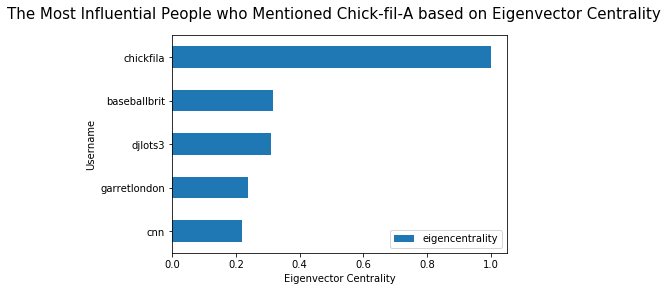

In [245]:
# load the data

mention_chick_network = pd.read_csv("Tweets mentioning Chick-fil-A networks data.csv")
mention_chick_network = mention_chick_network[['Label', 'eigencentrality']]
mention_chick_network = mention_chick_network.set_index('Label')
ax = mention_chick_network.sort_values('eigencentrality', ascending=False).head()
ax = ax.sort_values('eigencentrality', ascending=True).plot(kind='barh')
plt.xticks(rotation=0)
plt.suptitle("The Most Influential People who Mentioned Chick-fil-A based on Eigenvector Centrality", fontsize=15)
plt.ylabel("Username")
plt.xlabel("Eigenvector Centrality")
plt.show()
fig = ax.get_figure()
fig.savefig("images/Tweet Mentioning Chick-fil-A Network Metrics", bbox_inches='tight')

**The most influential people in terms of eigenvector centrality are chickfila, baseballbrit, djlots3, garretlondon, cnn.**


## Chick-fil-A Network Analytics

In [246]:
# let's process the data in list (better for text processing)

tweets = df_chick.values
len(tweets)

3236

In [247]:
# make screen name and tweet text to be the only screen

mention = []

for tweet in tweets:
    mention.append([tweet[0], tweet[3]])
    
mention[:5]

[['ChickfilA', '@britneyrush10 🚗💨🚙💨🚗💨'],
 ['ChickfilA',
  "@kelseyslager we're sorry that your meal wasn't correct. please give us a call at 1-866-232-2040 or fill out our on… https://t.co/dzshpfkr2p"],
 ['ChickfilA',
  '@pokinghontas__ we apologize for your experience. please give us a call at 1-866-232-2040 or fill out our online fo… https://t.co/nnhnhhkjv4'],
 ['ChickfilA', "@evolvingaj we're grateful for fans like you, aj!"],
 ['ChickfilA', '@jortastic facts!']]

In [248]:
# computationally intensive ... very slow if you have a lot of data
for i in mention[:5]:
    print(i[0], i[1])

ChickfilA @britneyrush10 🚗💨🚙💨🚗💨
ChickfilA @kelseyslager we're sorry that your meal wasn't correct. please give us a call at 1-866-232-2040 or fill out our on… https://t.co/dzshpfkr2p
ChickfilA @pokinghontas__ we apologize for your experience. please give us a call at 1-866-232-2040 or fill out our online fo… https://t.co/nnhnhhkjv4
ChickfilA @evolvingaj we're grateful for fans like you, aj!
ChickfilA @jortastic facts!


In [249]:
# select only screen name and mention name

for tweet in mention[:5]:
    a = re.findall(r"(?<=@)\w+", tweet[1])
    for i in a:
        print(tweet[0], i)

ChickfilA britneyrush10
ChickfilA kelseyslager
ChickfilA pokinghontas__
ChickfilA evolvingaj
ChickfilA jortastic


In [250]:
# putting everything together and save it to csv

import csv
mention = []
for tweet in tweets:
    mention.append([tweet[0], tweet[3]])
    
openfile = open("data/chick_network.csv", "w", newline='')
w = csv.writer(openfile)

for tweet in mention:
    a = re.findall(r"(?<=@)\w+", tweet[1])
    for i in a:
        w.writerow([tweet[0], i])
        
openfile.close()

### Network Visualization

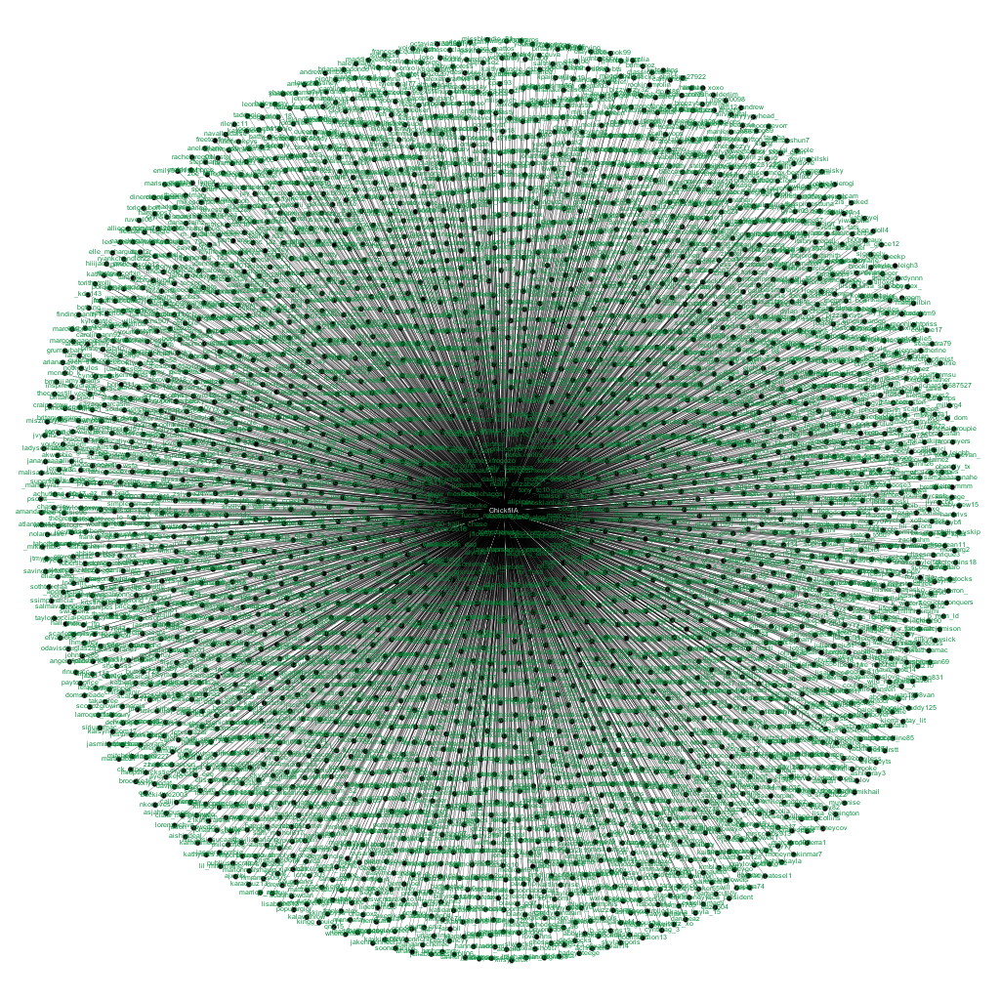

In [251]:
# load the gephi image

Image("images/Chick-fil-A Tweets Networks.PNG")

**As can be seen above, there is only one cluster in the network because this network is from Chick-fil-A's tweets and the center here is Chick-fil-A. And, the most influential person here is Chick-fil-A.**

# Conclusion/Summary/Storytelling

* From more or less than 3000 tweets, each company barely does promotion in their tweets. Mostly, they just respond to customer’s feedbacks and directs them to their hotline number or email. However, only McDonald’s did some kind of sweepstakes and they responded to their customer’s entry in Twitter. 


* People like to talk about the French fries of McDonald’s, the video of an explosion of a truck on Burger King’s drive thru, and Chick-fil-A’s Sunday delivery to a sick boy. 


* Chick-fil-A has the most positive tweets from people’s tweets and the company’s own tweets. McDonald’s and Burger King mostly have neutral sentiment on their tweets and from people’s tweets.


* The most influential people who mentioned these 3 companies are all media organizations. These organizations have the most followers among all people who mentioned these companies. News and media company mentioned Chick-fil-A and Burger King while a travel magazine company mentioned McDonald’s. 


* For Burger King, there are so many Brazilian people who mentioned and talked about Burger King. Perhaps, it was also mentioned by the most influential person, Folha which is a newspaper company based in Sao Paulo.


* For positive reviews, many people love Chick-fil-A’s chicken nuggets. Many people also talked about Captain Marvel and Brie Larson mentioning Burger King. As for McDonald’s, people like about the company’s arches. 


* For negative reviews, many people talked about Warren Buffet’s plans leaving McDonald’s. Many people also talked about a truck exploding on Burger King’s drive thru in Arkansas. People also mentioned San Antonio airport banning Chick-fil-A.


* It is interesting sometimes to see how people talked a lot about weird things related to each company. But, it is also good to know what is going on Twitter and  what people are talking about. 


* Sometimes, it is also helpful to see what irritates people or what makes people like things from each company.


* For network analysis, the tweets mentioning each company are divided into 8 clusters using Gephi. All 3 companies have 8 different clusters, where the biggest cluster is centered on each company. 

